<a href="https://colab.research.google.com/github/chatwipa-sur/SRCC_detection/blob/main/Student_model_training_noKD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Trian Student model
- Train CenterNet model with original ground truth label and pseudo-label from teacher model

In [1]:
# Standard library for file and directory operations
import os
from datetime import datetime
import sys

# Library for parsing XML files (used for annotations)
import xml.etree.ElementTree as ET

# Core PyTorch library for tensor operations
import torch
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from torchvision import transforms
# import torchvision.transforms.functional as F
import torch.nn.functional as F
from torchvision.transforms.functional import to_pil_image
from torch.utils.data import random_split
import torch.nn as nn
import torchvision
from torchvision.ops import nms, box_iou
from torchvision.models import ResNet50_Weights, ResNet34_Weights, ResNet18_Weights
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset, DataLoader, Subset
from sklearn.model_selection import StratifiedKFold

# Library for numerical computations
import numpy as np
from scipy.ndimage import maximum_filter
import pandas as pd
import time

# Library for data visualization
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [2]:
# Mount the drive with google colab notebook
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1. Create Dataset

In [3]:
# Make heatmaps using the utility functions from the centernet repo
# Draw a Gaussian centered at a point on a heatmap
def draw_msra_gaussian(heatmap, center, sigma=7):
  # Total size (radius) of the Gaussian region
  tmp_size = sigma * 6

  # Round the x and y center to nearest int
  mu_x = int(center[0] + 0.5)
  mu_y = int(center[1] + 0.5)

  # Get heatmap dimensions
  w, h = heatmap.shape[0], heatmap.shape[1]

  # Upper-left and bottom-right corners of the Gaussian patch
  ul = [int(mu_x - tmp_size), int(mu_y - tmp_size)]
  br = [int(mu_x + tmp_size + 1), int(mu_y + tmp_size + 1)]

  # If Gaussian patch is completely outside the heatmap, return
  if ul[0] >= h or ul[1] >= w or br[0] < 0 or br[1] < 0:
    return heatmap

  # Create a 2D Gaussian
  size = 2 * tmp_size + 1 # Size of the Gaussian patch
  x = np.arange(0, size, 1, np.float32) # x coordinates
  y = x[:, np.newaxis] # y coordinates
  x0 = y0 = size // 2 # Center of the Gaussian
  g = np.exp(- ((x - x0) ** 2 + (y - y0) ** 2) / (2 * sigma ** 2)) # 2D Gaussian formula

  # Compute valid bounds for placing the Gaussian patch on the heatmap
  g_x = max(0, -ul[0]), min(br[0], h) - ul[0]
  g_y = max(0, -ul[1]), min(br[1], w) - ul[1]
  img_x = max(0, ul[0]), min(br[0], h)
  img_y = max(0, ul[1]), min(br[1], w)

  # Place the Gaussian on the heatmap using max to retain highest intensity
  heatmap[img_y[0]:img_y[1], img_x[0]:img_x[1]] = np.maximum(
    heatmap[img_y[0]:img_y[1], img_x[0]:img_x[1]],
    g[g_y[0]:g_y[1], g_x[0]:g_x[1]])

  return heatmap

# Draw a dense regression value map around a center point
def draw_dense_reg(regmap, heatmap, center, value, radius, is_offset=False):
  # Size of the square region
  diameter = 2 * radius + 1
  # Create Gaussian mask
  gaussian = gaussian2D((diameter, diameter), sigma=diameter / 6)

  # Convert value to float32 and reshape to [dim, 1, 1]
  value = np.array(value, dtype=np.float32).reshape(-1, 1, 1)
  dim = value.shape[0]

  # Create a repeated value map of shape [dim, H, W]
  reg = np.ones((dim, diameter*2+1, diameter*2+1), dtype=np.float32) * value

  # If it's an offset, adjust the values using distance from center
  if is_offset and dim == 2:
    delta = np.arange(diameter*2+1) - radius
    reg[0] = reg[0] - delta.reshape(1, -1)
    reg[1] = reg[1] - delta.reshape(-1, 1)

  # Center coordinates
  x, y = int(center[0]), int(center[1])

  # Heatmap dimensions
  height, width = heatmap.shape[0:2]

  # Compute boundaries (clipping at image edges)
  left, right = min(x, radius), min(width - x, radius + 1)
  top, bottom = min(y, radius), min(height - y, radius + 1)

  # Crop regions from heatmap, regmap, Gaussian, and value maps
  masked_heatmap = heatmap[y - top:y + bottom, x - left:x + right]
  masked_regmap = regmap[:, y - top:y + bottom, x - left:x + right]
  masked_gaussian = gaussian[radius - top:radius + bottom,
                             radius - left:radius + right]
  masked_reg = reg[:, radius - top:radius + bottom,
                      radius - left:radius + right]

  # Only update if region is valid (non-zero size)
  if min(masked_gaussian.shape) > 0 and min(masked_heatmap.shape) > 0: # TODO debug

    # Create a mask where Gaussian is stronger than existing heatmap
    idx = (masked_gaussian >= masked_heatmap).reshape(1, masked_gaussian.shape[0],
                                                      masked_gaussian.shape[1])

    # Update regmap only where mask is True (using Gaussian gate)
    masked_regmap = (1-idx) * masked_regmap + idx * masked_reg

  # Write updated region back to original regmap
  regmap[:, y - top:y + bottom, x - left:x + right] = masked_regmap

  return regmap

def gaussian2D(shape, sigma=1):
    # Get center and coordinate grid
    m, n = [(ss - 1.) / 2. for ss in shape]
    y, x = np.ogrid[-m:m+1,-n:n+1]

    # Apply 2D Gaussian function
    h = np.exp(-(x * x + y * y) / (2 * sigma * sigma))

    # Remove near-zero values for stability
    h[h < np.finfo(h.dtype).eps * h.max()] = 0

    return h

def make_hm_regr(target, input_size=512, MODEL_SCALE=4):

    IN_SCALE = 1
    # make output heatmap for single class
    hm = np.zeros([input_size//MODEL_SCALE, input_size//MODEL_SCALE], dtype=np.float32)
    # make regr heatmap
    regr = np.zeros([2, input_size//MODEL_SCALE, input_size//MODEL_SCALE], dtype=np.float32)

    if target.empty:
        return hm, regr

    center = np.array([target["x"] + target["w"]//2, target["y"] + target["h"]//2,
                       target["w"], target["h"]]).T

    # make a center point
    # try gaussian points.
    for c in center:
        hm = draw_msra_gaussian(hm, [int(c[0])//MODEL_SCALE//IN_SCALE,
                                     int(c[1])//MODEL_SCALE//IN_SCALE],
                                sigma=np.clip(c[2]*c[3]//2000, 5, 10))

    # convert targets to its center.
    regrs = center[:, 2:]/input_size/IN_SCALE

    # plot regr values to mask
    for r, c in zip(regrs, center):
        for i in range(-2, 3):
            for j in range(-2, 3):
                try:
                    regr[:, int(c[0])//MODEL_SCALE//IN_SCALE+i,
                         int(c[1])//MODEL_SCALE//IN_SCALE+j] = r
                except:
                    pass
    regr[0] = regr[0].T; regr[1] = regr[1].T;

    return hm, regr

def pred2box(hm, regr, thresh=0.99, MODEL_SCALE=4, input_size=512):
    pred = hm > thresh
    pred_center = np.where(pred)
    pred_r = regr[:, pred].T  # Shape: [N, 2] for w, h
    boxes = []
    scores = hm[pred]

    for i, b in enumerate(pred_r):
        cx = pred_center[1][i] * MODEL_SCALE
        cy = pred_center[0][i] * MODEL_SCALE

        w = b[0] * input_size
        h = b[1] * input_size

        x1 = cx - w /2
        y1 = cy - h /2

        arr = np.clip([x1, y1, w, h], 0, input_size)
        boxes.append(arr)

    return np.asarray(boxes), scores


# Assuming `image` is a torch.Tensor of shape (3, H, W)
def unnormalize_tensor(image):
  mean = [0.485, 0.456, 0.406]
  std  = [0.229, 0.224, 0.225]
  for t, m, s in zip(image, mean, std):
    t.mul_(s).add_(m)
  return image

In [4]:
class SignetRingCellPatchCenterNetDataset(Dataset):
  def __init__(self, image_dir, annotation_dir, patch_size=512, transform=None):
    # Initialize parameters
    self.patch_size = patch_size
    self.stride = patch_size//2
    self.transform = transform
    self.image_information = []

    # Loop over positive and negative folders
    for class_type in ['positive', 'negative']:
      full_image_dir = os.path.join(image_dir, class_type)
      full_anno_dir = os.path.join(annotation_dir, class_type)

      # Iterate over image files in the folder
      for fname in os.listdir(full_image_dir):
        if fname.lower().endswith(('.png', '.jpg', '.jpeg')):
          # Collect image path
          image_path = os.path.join(full_image_dir, fname)

          # Collect annotation path
          if class_type == "positive":
            anno_filename = fname.replace('.png', '.xml').replace('.jpg', '.xml').replace('.jpeg', '.xml')
            anno_path = os.path.join(full_anno_dir, anno_filename)
          else:
            anno_path = None  # no annotation for negatives

          # Get the size of image
          image = cv2.imread(image_path)
          height, width = image.shape[:2]
          self.stride = self.stride if class_type == 'positive' else 512
          window_size = self.patch_size

          # Calculate padding size
          pad_h = (self.stride - (height - window_size) % self.stride) % self.stride
          pad_w = (self.stride - (width - window_size) % self.stride) % self.stride
          padded_height = height + pad_h
          padded_width = width + pad_w

          # Generate sliding window patches
          for top in range(0, height - self.patch_size + 1, self.stride):
            for left in range(0, width - self.patch_size + 1, self.stride):
              self.image_information.append({
                  'image_path': image_path,
                  'annotation_path': anno_path,
                  'crop_box': (left, top, left + self.patch_size, top + self.patch_size),
                  'original_size': (width, height),
                  'flag': 1 if class_type == 'positive' else 0
              })

  def __len__(self):
    return len(self.image_information) # Total number of patches

  def __getitem__(self, idx):
    # Get image for this index
    image_info = self.image_information[idx]
    image = cv2.imread(image_info['image_path'])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Crop patch
    width, height = image_info['original_size']
    pad_h = (self.stride - (height - self.patch_size) % self.stride) % self.stride
    pad_w = (self.stride - (width - self.patch_size) % self.stride) % self.stride
    image = np.pad(image, ((0, pad_h), (0, pad_w), (0,0)), mode='constant', constant_values=0)
    left, top, right, bottom = image_info['crop_box']
    image_patch = image[top:bottom, left:right]

    # Get type of image
    flag = image_info['flag']

    # Load and process annotations
    boxes_list = []
    category_ids = []
    if image_info['annotation_path'] is not None:
        tree = ET.parse(image_info['annotation_path'])
        root = tree.getroot()

        crop_xmin, crop_ymin, crop_xmax, crop_ymax = image_info['crop_box']
        for obj in root.findall('object'):
            name = obj.find('name').text
            if name == 'ring_cell_cancer':
                bbox = obj.find('bndbox')
                xmin = int(bbox.find('xmin').text)
                ymin = int(bbox.find('ymin').text)
                xmax = int(bbox.find('xmax').text)
                ymax = int(bbox.find('ymax').text)

                if (xmin >= crop_xmin and xmax <= crop_xmax) and (ymin >= crop_ymin and ymax <= crop_ymax):
                    new_xmin = xmin - crop_xmin
                    new_ymin = ymin - crop_ymin
                    new_xmax = xmax - crop_xmin
                    new_ymax = ymax - crop_ymin
                    boxes_list.append((new_xmin, new_ymin,
                                       new_xmax - new_xmin,
                                       new_ymax - new_ymin))
                    category_ids.append(1)  # ring_cell_cancer

    # Apply transform (if any)
    if self.transform and len(boxes_list) > 0:
        transformed = self.transform(
            image=image_patch,
            bboxes=boxes_list,
            category_ids=category_ids
        )
        image_patch = transformed['image']
        boxes_list = transformed['bboxes']
    elif self.transform:
        transformed = self.transform(image=image_patch, bboxes=[], category_ids=[])
        image_patch = transformed['image']

    # Generate heatmap + regression map
    if len(boxes_list) == 0:
        hm = np.zeros([self.patch_size // 4, self.patch_size // 4], dtype=np.float32)
        regr = np.zeros([2, self.patch_size // 4, self.patch_size // 4], dtype=np.float32)
    else:
        target = pd.DataFrame(boxes_list, columns=['x', 'y', 'w', 'h'])
        hm, regr = make_hm_regr(target)

    return image_patch, hm, regr, boxes_list, flag

### 1.1 Transform function

#### Training transform

In [5]:
# Transform function - Training set
train_transform = A.Compose([
    A.Affine(translate_percent=(-0.05, 0.05), scale=(0.9, 1.1), rotate=(-10, 10), p=0.5),
    A.HorizontalFlip(p=0.5),
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2(),  # converts image and bounding boxes to torch.Tensor
], bbox_params=A.BboxParams(format='coco', label_fields=['category_ids']))

#### Validation and Test transform

In [6]:
# Transform function - Validation and Test set
val_test_transform = A.Compose([
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2(),
], bbox_params=A.BboxParams(format='coco', label_fields=['category_ids']))

/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for bboxes, but no transform to process it.
  self._set_keys()


### 1.2 DataLoader

#### Main functions

In [7]:
def custom_collate_fn(batch):
    images = torch.stack([item[0] for item in batch])
    hms = torch.stack([torch.from_numpy(item[1]).float() for item in batch])
    regrs = torch.stack([torch.from_numpy(item[2]).float() for item in batch])
    gt_boxes = [item[3] for item in batch]
    flags = [item[4] for item in batch]
    return images, hms, regrs, gt_boxes, flags

def get_dataloaders(fold_root_dir, train_fold, val_fold, test_fold,
                    transform_train, transform_val_test, batch_size=16):

    # Load training dataset (concat multiple folds)
    train_datasets = []
    for idx in train_fold_idxs:
        fold_name = folds[idx]
        dataset = SignetRingCellPatchCenterNetDataset(
            image_dir=os.path.join(fold_root_dir, fold_name, 'images'),
            annotation_dir=os.path.join(fold_root_dir, fold_name, 'annotations'),
            transform=transform_train
        )
        train_datasets.append(dataset)
    train_dataset = ConcatDataset(train_datasets)

    # Load val dataset
    val_fold = folds[val_fold_idx]
    val_dataset = SignetRingCellPatchCenterNetDataset(
        image_dir=os.path.join(fold_root_dir, val_fold, 'images'),
        annotation_dir=os.path.join(fold_root_dir, val_fold, 'annotations'),
        transform=transform_val_test
    )

    # Load test dataset
    test_fold = folds[test_fold_idx]
    test_dataset = SignetRingCellPatchCenterNetDataset(
        image_dir=os.path.join(fold_root_dir, test_fold, 'images'),
        annotation_dir=os.path.join(fold_root_dir, test_fold, 'annotations'),
        transform=transform_val_test
    )

    # DataLoaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=custom_collate_fn)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, collate_fn=custom_collate_fn)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, collate_fn=custom_collate_fn)

    return train_loader, val_loader, test_loader

#### Check `get_dataloaders`

In [8]:
folds = ['fold1', 'fold2', 'fold3', 'fold4']

for test_fold_idx, test_fold_name in enumerate(folds):
    val_fold_idx = (test_fold_idx + 1) % 4
    train_fold_idxs = [i for i in range(4) if i != test_fold_idx and i != val_fold_idx]

    print(f"==== Test Fold: {folds[test_fold_idx]}, Val Fold: {folds[val_fold_idx]}, Train Folds: {[folds[i] for i in train_fold_idxs]} ====")

    train_loader, val_loader, test_loader = get_dataloaders(
        fold_root_dir = "/content/drive/MyDrive/Dissertation_Chatwipa/dataset",
        train_fold = [folds[i] for i in train_fold_idxs],
        val_fold = folds[val_fold_idx],
        test_fold = folds[test_fold_idx],
        transform_train = train_transform,
        transform_val_test = val_test_transform,
        batch_size = 32
    )

    # Total number of images
    num_train = len(train_loader.dataset)
    num_val = len(val_loader.dataset)
    num_test = len(test_loader.dataset)

    print(f"Train: {num_train} images")
    print(f"Validation: {num_val} images")
    print(f"Test: {num_test} images")

==== Test Fold: fold1, Val Fold: fold2, Train Folds: ['fold3', 'fold4'] ====
Train: 3128 images
Validation: 1672 images
Test: 1666 images
==== Test Fold: fold2, Val Fold: fold3, Train Folds: ['fold1', 'fold4'] ====
Train: 3241 images
Validation: 1553 images
Test: 1672 images
==== Test Fold: fold3, Val Fold: fold4, Train Folds: ['fold1', 'fold2'] ====
Train: 3338 images
Validation: 1575 images
Test: 1553 images
==== Test Fold: fold4, Val Fold: fold1, Train Folds: ['fold2', 'fold3'] ====
Train: 3225 images
Validation: 1666 images
Test: 1575 images


## 2. Model Training

### 2.1 Pseudo-label generation

#### Evaluation function

In [9]:
# Convert bounding boxes from (x, y, w, h) format to (x1, y1, x2, y2) format.
def boxes_conversion_xy(boxes_x1y1wh):
    """
    Args:
        boxes: A set of bounding boxes in (x, y, width, height) format

    Returns:
        torch.Tensor: Bounding boxes in (x1, y1, x2, y2) format as a float32 tensor.
                      (x1, y1) is the top-left corner, (x2, y2) is the bottom-right.
    """

    if isinstance(boxes_x1y1wh, torch.Tensor):
        boxes_x1y1x2y2 = boxes_x1y1wh.clone()
        boxes_x1y1x2y2[:, 2] = boxes_x1y1x2y2[:, 0] + boxes_x1y1x2y2[:, 2]  # x2 = x + w
        boxes_x1y1x2y2[:, 3] = boxes_x1y1x2y2[:, 1] + boxes_x1y1x2y2[:, 3]  # y2 = y + h
    else:
        boxes_x1y1wh = np.array(boxes_x1y1wh)
        boxes_x1y1x2y2 = boxes_x1y1wh.copy()
        boxes_x1y1x2y2[:, 2] = boxes_x1y1x2y2[:, 0] + boxes_x1y1x2y2[:, 2]
        boxes_x1y1x2y2[:, 3] = boxes_x1y1x2y2[:, 1] + boxes_x1y1x2y2[:, 3]
        boxes_x1y1x2y2 = torch.tensor(boxes_x1y1x2y2, dtype=torch.float32)

    return boxes_x1y1x2y2

def match_predictions(pred_boxes, gt_boxes, positive_flag):
    """
    Args:
        pred_boxes: List of predicted boxes in xywh
        gt_boxes: List of ground truth boxes in xywh
        positive_flag: True if image has GT boxes (positive sample), else False
    Returns:
        tp_pos, fp_pos, tn_pos, fn_pos, fp_neg, tn_neg
    """
    tp_pos = fp_pos = tn_pos = fn_pos = fp_neg = tn_neg = 0

    # ---- Positive Images: Precision and Recall ---- #
    if positive_flag:
        # No label from both gound-truth and prediction -> TN
        if len(gt_boxes) == 0 and len(pred_boxes) == 0:
            tp_pos, fp_pos, tn_pos, fn_pos = 0, 0, 1, 0
            return tp_pos, fp_pos, tn_pos, fn_pos, fp_neg, tn_neg

        # No label from ground-truth -> all preds are FP
        if len(gt_boxes) == 0:
            tp_pos, fp_pos, tn_pos, fn_pos = 0, len(pred_boxes), 0, 0
            return tp_pos, fp_pos, tn_pos, fn_pos, fp_neg, tn_neg

        # No label from prediction -> all preds are FN
        if len(pred_boxes) == 0:
            tp_pos, fp_pos, tn_pos, fn_pos = 0, 0, 0, len(gt_boxes)
            return tp_pos, fp_pos, tn_pos, fn_pos, fp_neg, tn_neg

        # Convert bounding boxes from (x, y, w, h) format to (x1, y1, x2, y2) format
        pred_boxes_xyxy = boxes_conversion_xy(pred_boxes)
        gt_boxes_xyxy = boxes_conversion_xy(gt_boxes)

        # Calculate ious from library
        ious = box_iou(gt_boxes_xyxy, pred_boxes_xyxy)  # return [num_gt, num_pred]

        # Initialize tensor
        matched_gt = torch.zeros(len(gt_boxes), dtype=torch.bool)
        matched_pred = torch.zeros(len(pred_boxes), dtype=torch.bool)
        for j in range(ious.size(1)):  # loop all prediction
            for i in range(ious.size(0)):  # loop all ground-truth
                # skips already-matched ground truth boxes
                if not (matched_gt[i]) and (ious[i, j] >= 0.3):
                    matched_gt[i] = True
                    matched_pred[j] = True
                    break

        tp_pos = matched_gt.sum().item()
        fp_pos = (~matched_pred).sum().item()
        fn_pos = (~matched_gt).sum().item()

    # ---- Negative Images: Normal Region False Positive ---- #
    else:  # only TN or FP
        tn_neg = 1 if len(pred_boxes) == 0 else 0
        fp_neg = 0 if tn_neg == 1 else len(pred_boxes)

    return tp_pos, fp_pos, tn_pos, fn_pos, fp_neg, tn_neg

def pool_numpy(data, size=3):
    max_filtered = maximum_filter(data, size=size, mode='constant')
    return np.where(data == max_filtered, data, 0)

def compute_metrics(tp_pos, fp_pos, tn_pos, fn_pos, fp_neg, total_gt_boxes, flag_list):

    # ---- Positive Images : Precision and Recall ---- #
    precision = tp_pos / (tp_pos + fp_pos + 1e-6)
    recall = tp_pos / (tp_pos + fn_pos + 1e-6)
    instance_recall = tp_pos / total_gt_boxes
    f1 = 2 * precision * instance_recall / (precision + instance_recall + 1e-6)

    # ---- Negative Images: FPs ---- #
    num_normal_images = sum(1 for flag in flag_list if not flag)
    normal_region_fp = fp_neg / num_normal_images
    normal_fp_score = max((100 - normal_region_fp), 0)

    return {
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'Instance Recall': instance_recall,
        'Normal Region FP': normal_region_fp,
        'FP Score': normal_fp_score
    }

def compute_froc_valid_recall(predictions_by_thresh, gt_boxes_list, flag_list, thresholds, fp_levels=[1, 2, 4, 8, 16, 32]):

    total_gt_boxes = sum(len(boxes) for boxes in gt_boxes_list)
    fp_per_image_list = []
    recall_list = []

    # For each threshold, compute FP/image and recall
    for threshold in thresholds:
        preds_list = predictions_by_thresh[threshold]

        total_tp_pos = total_fp_pos = total_tn_pos = total_fn_pos = total_fp_neg = total_tn_neg = 0

        for boxes_sorted, gt_boxes, flag in zip(preds_list, gt_boxes_list, flag_list):
            tp_pos, fp_pos, tn_pos, fn_pos, fp_neg, tn_neg = match_predictions(boxes_sorted, gt_boxes, flag)
            total_tp_pos += tp_pos
            total_fp_pos += fp_pos
            total_tn_pos += tn_pos
            total_fn_pos += fn_pos
            total_fp_neg += fp_neg
            total_tn_neg += tn_neg

        metric = compute_metrics(total_tp_pos, total_fp_pos, total_tn_pos, total_fn_pos, total_fp_neg, total_gt_boxes, flag_list)
        instance_recall = metric['Instance Recall']
        precision = metric['Precision']
        normal_region_fp = metric['Normal Region FP']

        # Save FP per image and recall for interpolation later
        fp_per_image_list.append(normal_region_fp)
        recall_list.append(instance_recall)

    # Ensure FP levels are sorted
    fp_per_image_list = np.array(fp_per_image_list)
    recall_list = np.array(recall_list)

    # Sort by FP per image (ascending)
    sorted_indices = np.argsort(fp_per_image_list)
    fp_per_image_list = fp_per_image_list[sorted_indices]
    recall_list = recall_list[sorted_indices]

    # Interpolate recall at required FP levels
    recalls_at_fp = {}
    for fp_level in fp_levels:
        if fp_level <= fp_per_image_list[-1]:  # If within range
            interpolated_recall = np.interp(fp_level, fp_per_image_list, recall_list)
            recalls_at_fp[fp_level] = interpolated_recall
        else:
            # If FP level is beyond available range, assign last available recall (or zero)
            recalls_at_fp[fp_level] = recall_list[-1]  # Or set to 0.0 if you prefer

    # Compute FROC as average recall at the specified FP levels
    froc_score = np.mean(list(recalls_at_fp.values()))

    return froc_score, recalls_at_fp

#### Teacher model structure

In [ ]:
class double_conv(nn.Module):
    '''(conv => BN => ReLU) * 2'''
    def __init__(self, in_ch, out_ch):
        super(double_conv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ELU(inplace=True), # Change from ReLU to ELU
            nn.Dropout2d(p=0.3),

            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ELU(inplace=True), # Change from ReLU to ELU
            nn.Dropout2d(p=0.3),
        )

    def forward(self, x):
        x = self.conv(x)
        return x

class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=True):
        super(up, self).__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch//2, in_ch//2, 2, stride=2)
        self.conv = double_conv(in_ch, out_ch)

    def forward(self, x1, x2=None):
        x1 = self.up(x1)
        if x2 is not None:
            x = torch.cat([x2, x1], dim=1)
            # input is CHW
            diffY = x2.size()[2] - x1.size()[2]
            diffX = x2.size()[3] - x1.size()[3]

            x1 = F.pad(x1, (diffX // 2, diffX - diffX//2,
                            diffY // 2, diffY - diffY//2))
        else:
            x = x1
        x = self.conv(x)
        return x

class centernet_teacher(nn.Module):
    def __init__(self, n_classes=1, model_name="resnet34"):
        super(centernet_teacher, self).__init__()

        # Create model backbone
        if model_name == "resnet50":
            basemodel = torchvision.models.resnet50(weights=ResNet50_Weights.DEFAULT)
            self.num_ch = 2048
        elif model_name == "resnet34":
            basemodel = torchvision.models.resnet34(weights=ResNet34_Weights.DEFAULT)
            self.num_ch = 512
        elif model_name == "resnet18":
            basemodel = torchvision.models.resnet18(weights=ResNet18_Weights.DEFAULT)
            self.num_ch = 512

        # Remove the last two layers (average pooling and linear layer)
        self.base_model = nn.Sequential(*list(basemodel.children())[:-2])

        # Freeze earlier layers except layer3 and layer4
        for name, param in basemodel.named_parameters():
            if "layer3" in name or "layer4" in name:
                param.requires_grad = True
            else:
                param.requires_grad = False

        if self.num_ch == 2048:
            self.up1 = up(self.num_ch, 1024)
            self.up2 = up(1024, 512)
            self.up3 = up(512, 256)
        else:
            self.up1 = up(self.num_ch, 512)
            self.up2 = up(512, 256)
            self.up3 = up(256, 256)

        # Output classification
        self.outc = nn.Conv2d(256, n_classes, 1)

        # Output residue
        self.outr = nn.Conv2d(256, 2, 1)

    def forward(self, x):
        x = self.base_model(x)
        x = self.up1(x)
        feat = self.up2(x)
        x = self.up3(feat)
        outc = self.outc(x)
        outr = self.outr(x)
        return feat, outc, outr

#### Teacher model checkpoint

In [ ]:
teacher_model = centernet_teacher(model_name='resnet50')
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
teacher_model.to(device)

model_path = "/content/drive/MyDrive/Dissertation_Chatwipa/model_checkpoint/teacher/adam50_checkpoints_20250709_125408/fold1/best_model.pth"
checkpoint = torch.load(model_path)
# checkpoint = torch.load(model_path, map_location=torch.device('cpu'))
teacher_model.load_state_dict(checkpoint['model_state_dict'])

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 213MB/s]


<All keys matched successfully>

#### Generate pseudo-label (Example)

In [ ]:
def plot_pseudo_images(image, pseudo_boxes_gt, boxes_gt, pseudo_hm):
    # ----- Visualization ----- #
    # Unnormalize image (if normalized during preprocessing)
    image = unnormalize_tensor(image.clone())

    # Convert tensor image to numpy
    image = image.permute(1, 2, 0).cpu().numpy()
    image = (image * 255).astype(np.uint8)

    # Copy image for drawing boxes
    image_copy = image.copy()

    # Draw pseudo-label boxes in red
    for box in pseudo_boxes_gt:
        x, y, w, h = map(int, box)
        cv2.rectangle(image_copy, (x, y), (x + w, y + h), (255, 0, 0), 2)

    # Draw ground truth boxes in green
    for box in boxes_gt:
        x1, y1, w, h = map(int, box)
        cv2.rectangle(image_copy, (x1, y1), (x1 + w, y1 + h), (0, 255, 0), 2)

    # Create subplot for visualization
    fig, axs = plt.subplots(1, 2, figsize=(5, 3.5))  # 2 columns: image + heatmap

    # Display image with pseudo and GT boxes
    axs[0].imshow(image_copy)
    axs[0].set_title("Red: Pseudo Boxes | Green: GT Boxes", fontsize = 10)
    axs[0].axis('off')

    # Display heatmap
    axs[1].imshow(pseudo_hm, cmap='hot', interpolation='nearest', vmin=0, vmax=1)
    axs[1].set_title("Pseudo Heatmap", fontsize = 10)
    axs[1].axis('off')

    plt.tight_layout()
    plt.show()

def pool_numpy(data, size=3):
    max_filtered = maximum_filter(data, size=size, mode='constant')
    return np.where(data == max_filtered, data, 0)

In [ ]:
def generate_pseudo_label(teacher_model, img_batch, hm_batch_gt, regr_batch_gt, box_gt_batch, flags_batch, plot = False):

    pseudo_hm_batch, pseudo_regr_batch = [], []

    # Move batch tensors to the device (GPU or CPU)
    img_batch = img_batch.to(device)
    hm_batch_gt = hm_batch_gt.to(device)
    regr_batch_gt = regr_batch_gt.to(device)

   # Helper functions to check box containment
    def is_inside(box_a, box_b):
        # Convert xywh to xyxy
        ax1, ay1 = box_a[0], box_a[1]
        ax2, ay2 = box_a[0] + box_a[2], box_a[1] + box_a[3]

        bx1, by1 = box_b[0], box_b[1]
        bx2, by2 = box_b[0] + box_b[2], box_b[1] + box_b[3]

        return (ax1 >= bx1) and (ay1 >= by1) and (ax2 <= bx2) and (ay2 <= by2)

    def is_covering(box_a, box_b):
        # Convert xywh to xyxy
        ax1, ay1 = box_a[0], box_a[1]
        ax2, ay2 = box_a[0] + box_a[2], box_a[1] + box_a[3]

        bx1, by1 = box_b[0], box_b[1]
        bx2, by2 = box_b[0] + box_b[2], box_b[1] + box_b[3]

        return (ax1 <= bx1) and (ay1 <= by1) and (ax2 >= bx2) and (ay2 >= by2)

    # ----- Generate pseudo-label from teacher model ----- #
    with torch.no_grad():
        # Forward pass through the model
        _, hm_teacher_batch, regr_teacher_batch = teacher_model(img_batch)
        hm_teacher_batch = torch.sigmoid(hm_teacher_batch)

        # Iterate through each image in the batch
        for i, (img, hm_teacher, regr_teacher, boxes_gt, flag) in enumerate(zip(img_batch, hm_teacher_batch, regr_teacher_batch, box_gt_batch, flags_batch)):
            if flag == 1:
                # Preprocess predictions
                hm_teacher = pool_numpy(hm_teacher.cpu().numpy().squeeze(0))  # Apply pooling to smoothen heatmap
                regr_teacher = regr_teacher.cpu().numpy()

                # Get predicted bounding boxes and scores from heatmap and regression output
                boxes_teacher, scores = pred2box(hm_teacher, regr_teacher, thresh=0.5)

                if len(boxes_teacher) != 0:
                    # Convert to tensors for NMS
                    boxes_tensor = torch.tensor(boxes_teacher, dtype=torch.float32)
                    scores_tensor = torch.tensor(scores, dtype=torch.float32)

                    # Apply Non-Maximum Suppression
                    boxes_xyxy = boxes_conversion_xy(boxes_tensor)
                    keep = nms(boxes_xyxy, scores_tensor, iou_threshold=0.3)

                    # Filter top boxes and scores
                    boxes_sorted = boxes_teacher[keep]
                    scores_sorted = scores[keep]

                    # Filter by score > 0.5
                    high_conf_mask = scores_sorted > 0.5
                    boxes_teacher_confidence = boxes_sorted[high_conf_mask]

                    # Select unmatched teacher boxes
                    if len(boxes_gt) > 0:
                        # Convert ground truth and teacher boxes to xyxy
                        boxes_gt_xyxy = boxes_conversion_xy(boxes_gt)
                        boxes_teacher_xyxy = boxes_conversion_xy(boxes_teacher_confidence)

                        # Calculate IoU
                        ious = box_iou(boxes_teacher_xyxy, boxes_gt_xyxy)
                        max_ious, _ = ious.max(dim=1)
                        unmatched_mask = max_ious < 0.3
                        pseudo_boxes_gt = boxes_teacher_confidence[unmatched_mask.numpy()].tolist() + boxes_gt

                        remove_list = []
                        for box in pseudo_boxes_gt:
                          for box_gt in boxes_gt:
                            if is_inside(box, box_gt) or is_covering(box, box_gt):
                              remove_list.append(box)

                        pseudo_boxes_gt = [box for box in pseudo_boxes_gt if box not in remove_list]
                        pseudo_boxes_gt = pseudo_boxes_gt + boxes_gt
                    else:
                        pseudo_boxes_gt = boxes_teacher_confidence.tolist()  # All are unmatched if no GT

                    # Convert pseudo boxes to DataFrame format
                    pseudo_boxes_df = pd.DataFrame(pseudo_boxes_gt, columns=['x', 'y', 'w', 'h'])

                    # Generate pseudo-label heatmap and regression maps
                    pseudo_hm, pseudo_regr = make_hm_regr(pseudo_boxes_df)

                    # ---- Visualization ---- #
                    if plot:
                      plot_pseudo_images(img, pseudo_boxes_gt, boxes_gt, pseudo_hm)

                else:
                    # Original label
                    pseudo_boxes_gt = boxes_gt
                    pseudo_boxes_df = pd.DataFrame(pseudo_boxes_gt, columns=['x', 'y', 'w', 'h'])
                    pseudo_hm, pseudo_regr = make_hm_regr(pseudo_boxes_df)

                    # ---- Visualization ---- #
                    if plot:
                      plot_pseudo_images(img, pseudo_boxes_gt, boxes_gt, pseudo_hm)

            else:
                # Original label
                pseudo_boxes_gt = boxes_gt
                pseudo_boxes_df = pd.DataFrame(pseudo_boxes_gt, columns=['x', 'y', 'w', 'h'])
                pseudo_hm, pseudo_regr = make_hm_regr(pseudo_boxes_df)

                # ---- Visualization ---- #
                if plot:
                  plot_pseudo_images(img, pseudo_boxes_gt, boxes_gt, pseudo_hm)

            # Save pseudo hm and regr in batch
            pseudo_hm_batch = pseudo_hm_batch + [pseudo_hm]
            pseudo_regr_batch = pseudo_regr_batch + [pseudo_regr]

            # ----- End of pseudo-label generation ----- #

    # Create tensor
    pseudo_hm_batch = torch.from_numpy(np.array(pseudo_hm_batch)).float()
    pseudo_regr_batch = torch.from_numpy(np.array(pseudo_regr_batch)).float()

    return pseudo_hm_batch, pseudo_regr_batch

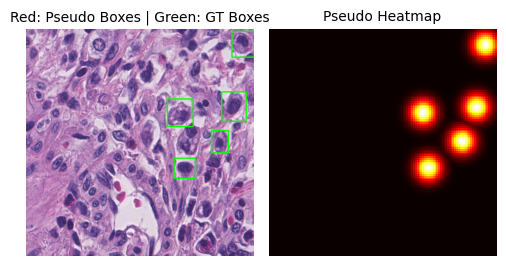

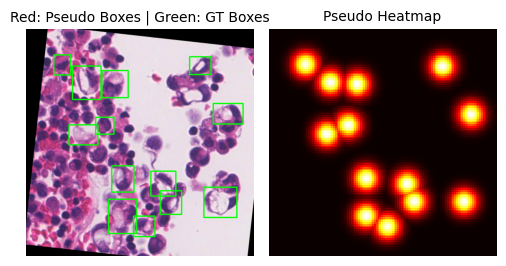

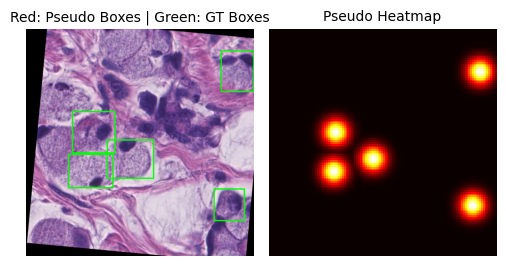

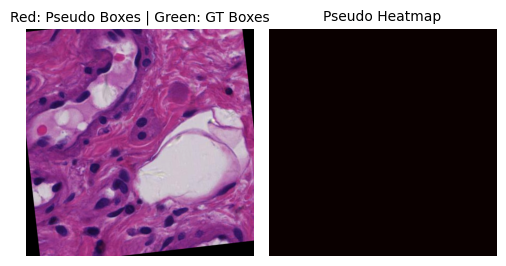

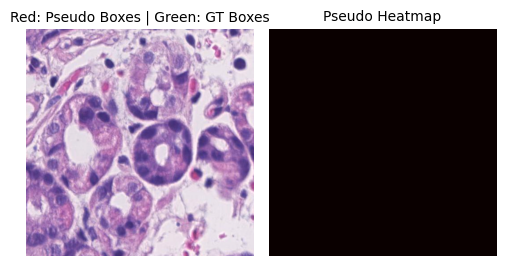

...

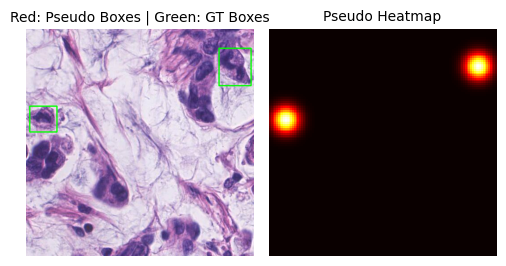

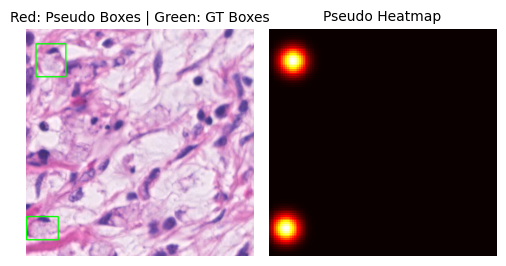

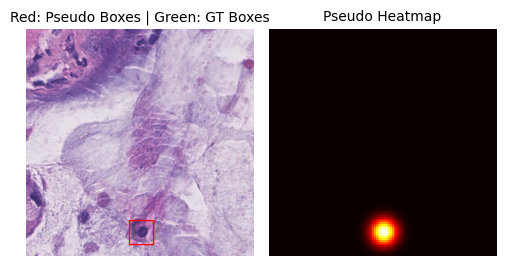

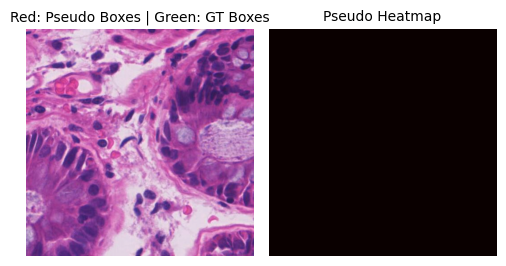

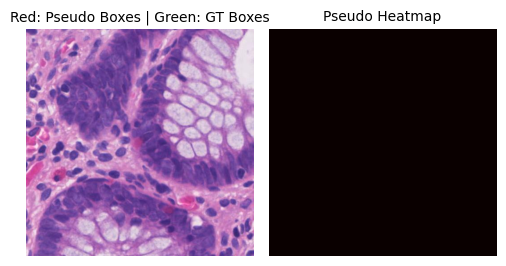

In [ ]:
teacher_model.eval()

for batch_idx, (img_batch, hm_batch_gt, regr_batch_gt, box_gt_batch, flags_batch) in enumerate(train_loader):
    if batch_idx > 1:
       break
    pseudo_hm_batch, pseudo_regr_batch = generate_pseudo_label(teacher_model, img_batch, hm_batch_gt, regr_batch_gt, box_gt_batch, flags_batch, plot = True)

In [ ]:
pseudo_hm_batch.shape, hm_batch_gt.shape

(torch.Size([32, 128, 128]), torch.Size([32, 128, 128]))

### 2.2 CenterNet Model

- The model is based on [CenterNet Baseline](https://www.kaggle.com/hocop1/centernet-baseline/data).

#### CenterNet class

In [10]:
class double_conv(nn.Module):
    '''(conv => BN => ReLU) * 2'''
    def __init__(self, in_ch, out_ch):
        super(double_conv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ELU(inplace=True), # Change from ReLU to ELU
            nn.Dropout2d(p=0.3),

            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ELU(inplace=True), # Change from ReLU to ELU
            nn.Dropout2d(p=0.3),
        )

    def forward(self, x):
        x = self.conv(x)
        return x

class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=True):
        super(up, self).__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch//2, in_ch//2, 2, stride=2)
        self.conv = double_conv(in_ch, out_ch)

    def forward(self, x1, x2=None):
        x1 = self.up(x1)
        if x2 is not None:
            x = torch.cat([x2, x1], dim=1)
            # input is CHW
            diffY = x2.size()[2] - x1.size()[2]
            diffX = x2.size()[3] - x1.size()[3]

            x1 = F.pad(x1, (diffX // 2, diffX - diffX//2,
                            diffY // 2, diffY - diffY//2))
        else:
            x = x1
        x = self.conv(x)
        return x

class centernet(nn.Module):
    def __init__(self, n_classes=1, model_name="resnet34"):
        super(centernet, self).__init__()

        # Create model backbone
        if model_name == "resnet34":
            basemodel = torchvision.models.resnet34(weights=ResNet34_Weights.DEFAULT)
            self.num_ch = 512
        elif model_name == "resnet18":
            basemodel = torchvision.models.resnet18(weights=ResNet18_Weights.DEFAULT)
            self.num_ch = 512

        # Remove the last two layers (average pooling and linear layer)
        self.base_model = nn.Sequential(*list(basemodel.children())[:-2])

        # Freeze earlier layers except layer3 and layer4
        for name, param in basemodel.named_parameters():
            if "layer3" in name or "layer4" in name:
                param.requires_grad = True
            else:
                param.requires_grad = False

        self.up1 = up(self.num_ch, 512)
        self.up2 = up(512, 256)
        self.up3 = up(256, 256)

        # Output classification
        self.outc = nn.Conv2d(256, n_classes, 1)

        # Output residue
        self.outr = nn.Conv2d(256, 2, 1)

    def forward(self, x):
        x = self.base_model(x)
        x = self.up1(x)
        feat = self.up2(x)
        x = self.up3(feat)
        outc = self.outc(x)
        outr = self.outr(x)
        return feat, outc, outr

#### Loss function

In [11]:
# From centernet repo
# Modified focal loss to detect object centers via heatmap
def neg_loss(pred, gt, pos_gamma=3, neg_gamma=4):
  ''' Modified focal loss. Exactly the same as CornerNet.
      Runs faster and costs a little bit more memory
      Args:
      pred: (B, 1, H, W)
      gt: (B, 1, H, W)
      pos_gamma: focusing parameter for positive examples
      neg_gamma: focusing parameter for negative examples
    '''

  pred = pred.unsqueeze(1).float()
  pred = torch.clamp(pred, min=1e-4, max=1 - 1e-4)
  gt = gt.unsqueeze(1).float()

  pos_inds = gt.eq(1).float() # Locations where there is a true object center
  neg_inds = gt.lt(1).float()  # All other pixels
  neg_weights = torch.pow(1 - gt, 4) # Higher weight for pixels farther from center

  loss = 0

  pos_loss = torch.log(pred + 1e-12) * torch.pow(1 - pred, pos_gamma) * pos_inds
  neg_loss = torch.log(1 - pred + 1e-12) * torch.pow(pred, neg_gamma) * neg_weights * neg_inds

  num_pos  = pos_inds.float().sum()
  pos_loss = pos_loss.sum()
  neg_loss = neg_loss.sum()

  if num_pos == 0:
    loss = (loss - neg_loss)
  else:
    loss = loss - (pos_loss + neg_loss) / (num_pos + 1e-4)

  return loss

# Smooth L1 regression loss for offsets, widths, etc.
def _reg_loss(regr, gt_regr, mask):
  ''' L1 regression loss
      regr: (B, N, 2)
      gt_regr: (B, N, 2)
      mask: (B, N)
  '''
  num = mask.float().sum()
  mask = mask.unsqueeze(2).expand_as(gt_regr)  # (B, N, 2)

  regr = regr * mask
  gt_regr = gt_regr * mask

  regr_loss = nn.functional.smooth_l1_loss(regr, gt_regr, reduction='sum')
  regr_loss = regr_loss / (num + 1e-4)

  return regr_loss


def centerloss(prediction, mask, regr, weight=100, size_average=True):
    """
    Combines heatmap focal loss and regression L1 loss into a total loss.

    Args:
        prediction: (B, 3, H, W) where [:, 0] = heatmap, [:, 1:] = regr
        mask: (B, H, W) – binary mask for object centers
        regr: (B, 2, H, W) – regression ground truth
        weight: float – weight of regression loss
        size_average: bool – average the final loss across batch

    Returns:
        total_loss, mask_loss, regr_loss
    """

    # Mask loss
    pred_mask = prediction[:, 0]
    mask_loss = neg_loss(pred_mask, mask)

    # Regression loss
    pred_regr = prediction[:, 1:]
    # Flatten tensors for _reg_loss: (B, 2, H, W) -> (B, H*W, 2)
    pred_regr_flat = pred_regr.permute(0, 2, 3, 1).reshape(pred_regr.size(0), -1, 2)
    regr_gt_flat = regr.permute(0, 2, 3, 1).reshape(regr.size(0), -1, 2)
    mask_flat = mask.view(mask.size(0), -1)  # (B, H*W)

    # Regression loss using helper
    regr_loss = _reg_loss(pred_regr_flat, regr_gt_flat, mask_flat) * weight

    # Total loss (with weighting)
    total_loss = mask_loss + regr_loss

    if not size_average:
        total_loss *= prediction.shape[0]

    return total_loss, mask_loss, regr_loss

### 2.3 Training Function

#### Define training function

In [12]:
def train_student(epoch, teacher_model, student_model,
                  save_dir, best_f1,
                  epochs_no_improve, early_stop_patience,
                  train_loader, val_loader, optimizer, teacher_proj):

    # Set model to training mode
    student_model.train()
    teacher_model.eval()  # Freeze teacher
    print(f'\nEpoch {epoch + 1}/{epochs}')

    # Initialize loss value
    running_loss, running_mask, running_regr = 0.0, 0.0, 0.0

    # Start epoch timer
    epoch_start = time.time()

    # Iterate over batches
    for idx, (img, hm_gt, regr_gt, box_gt, flag_list) in enumerate(train_loader):

        # Move batch tensors to the device (GPU or CPU)
        img = img.to(device)
        hm_gt = hm_gt.to(device)
        regr_gt = regr_gt.to(device)

        # ----- Generate pseudo-label from teacher model ----- #
        hm_pseudo, regr_pseudo = generate_pseudo_label(teacher_model, img, hm_gt, regr_gt, box_gt, flag_list)
        hm_pseudo = hm_pseudo.to(device)
        regr_pseudo = regr_pseudo.to(device)

        # ---- Student model ---- #
        # Reset gradients for new batch
        optimizer.zero_grad()

        # Forward pass: predict heatmap and regression outputs
        feat_pred, hm_pred, regr_pred = student_model(img)
        hm_pred = torch.sigmoid(hm_pred)
        feat_pred = F.normalize(feat_pred, p=2, dim=1)

        # Visualization: plot the GT and predicted heatmap for only first batch of epoch
        if idx == 0 and (epoch % 2 == 0 or epoch == 0):
            plt.subplot(1, 2, 1)
            plt.imshow(hm_gt[0].cpu().squeeze().numpy(), cmap='hot', vmin=0, vmax=1)
            plt.title('GT Heatmap')

            plt.subplot(1, 2, 2)
            plt.imshow(hm_pred[0].cpu().squeeze().detach().numpy(), cmap='hot', vmin=0, vmax=1)
            plt.title('Pred Heatmap')
            plt.show()

        # ------ Loss ----- #
        # Concatenate heatmap and regression predictions along channel dimension
        preds = torch.cat((hm_pred, regr_pred), dim=1)
        # Calculate Pseudo-label loss
        loss_pseudo, mask_loss_pseudo, regr_loss_pseudo = centerloss(preds, hm_pseudo, regr_pseudo)

        # Total loss
        loss = loss_pseudo

        # Backpropagation: compute gradients
        loss.backward()

        # Gradient clipping for stability
        torch.nn.utils.clip_grad_norm_(student_model.parameters(), max_norm=1.0)

        # Update model weights
        optimizer.step()

        # Accumulate loss values for reporting
        running_loss += loss.item()
        running_mask += mask_loss_pseudo.item()
        running_regr += regr_loss_pseudo.item()

        # Compute running average losses for display
        train_loss = running_loss / (idx + 1)
        avg_mask = running_mask / (idx + 1)
        avg_regr = running_regr / (idx + 1)

   # Average losses over the entire epoch after training completes
    epoch_time = time.time() - epoch_start
    print(f"\nEpoch {epoch + 1} completed in {epoch_time:.2f} seconds.")
    print(f"Train loss : {running_loss / len(train_loader):.4f}")
    print(f"GT mask loss : {running_mask / len(train_loader):.4f}")
    print(f"GT regr loss : {running_regr / len(train_loader):.4f}")

    # Run validation after training epoch
    val_loss, avg_mask, avg_regr, metrics = validate(student_model, teacher_model)

    # Step learning rate scheduler based on validation loss
    scheduler.step(val_loss)

    # 🔍 Get current learning rate
    current_lr = optimizer.param_groups[0]['lr']
    print(f'Current Learning Rate: {current_lr}')

    # Check if F1 improved
    f1 = metrics['F1 Score']
    if f1 > best_f1:
        print(f"F1 Score improved from {best_f1:.4f} to {f1:.4f}")
        best_f1 = f1
        epochs_no_improve = 0  # reset counter

        # Save best model
        torch.save({
            'epoch': epoch + 1,
            'model_state_dict': student_model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': val_loss
        }, f'{save_dir}/best_model.pth')

    else:
        epochs_no_improve += 1
        print(f"No improvement in F1 Score for {epochs_no_improve} epoch(s)")

    # # Save full checkpoint every 10 epochs
    # if (epoch + 1) % 10 == 0:
    #     torch.save({
    #         'epoch': epoch + 1,
    #         'model_state_dict': student_model.state_dict(),
    #         'optimizer_state_dict': optimizer.state_dict(),
    #         'loss': val_loss
    #     }, f'{save_dir}/checkpoint_epoch_{epoch + 1}.pth')

    # Early stopping condition
    if epochs_no_improve >= early_stop_patience:
        print(f"Early stopping triggered after {early_stop_patience} epochs without improvement.")
        early_stop_flag = True
    else:
        early_stop_flag = False

    return early_stop_flag, best_f1, epochs_no_improve, train_loss, val_loss, metrics

#### Define validation function

In [13]:
def validate(student_model, teacher_model):
    # Set model to evaluation mode
    student_model.eval()

    # Initialize loss trackers
    running_loss = 0.0
    running_mask = 0.0
    running_regr = 0.0

    # Initialize counters for evaluation metrics
    total_tp_pos = total_fp_pos = total_tn_pos = total_fn_pos = total_fp_neg = total_tn_neg = 0
    thresholds = [0.1, 0.3, 0.5, 0.7, 0.9]
    predictions_by_thresh = {t: [] for t in thresholds}
    gt_boxes_list = []
    flag_list = []

    # Disable gradient computations during validation
    with torch.no_grad():
        for idx, (img_batch, hm_gt_batch, regr_gt_batch, box_gt_batch, flags_batch) in enumerate(val_loader):

            # Move inputs to the correct device
            img_batch = img_batch.to(device)
            hm_gt_batch = hm_gt_batch.to(device)
            regr_gt_batch = regr_gt_batch.to(device)

            # ---- Student model ---- #
            # Forward pass through the model
            feat_pred, hm_pred_batch, regr_pred_batch = student_model(img_batch)
            hm_pred_batch = torch.sigmoid(hm_pred_batch)
            feat_pred = F.normalize(feat_pred, p=2, dim=1)

            # Plot GT and predicted heatmaps for the first batch every 2 epochs
            if idx == 0 and (epoch % 5 == 0 or epoch == 0):
                plt.subplot(1, 2, 1)
                plt.imshow(hm_gt_batch[0].squeeze().cpu().numpy(), cmap='hot')
                plt.title('GT Heatmap')

                plt.subplot(1, 2, 2)
                plt.imshow(hm_pred_batch[0].squeeze().cpu().numpy(), cmap='hot')
                plt.title('Pred Heatmap')
                plt.show()

            # ------ Loss ----- #
            # Concatenate heatmap and regression predictions along channel dimension
            preds = torch.cat((hm_pred_batch, regr_pred_batch), dim=1)

            # Calculate Pseudo loss
            loss_pseudo, mask_loss_pseudo, regr_loss_pseudo = centerloss(preds, hm_gt_batch, regr_gt_batch)

            # Total loss
            loss = loss_pseudo

            # Update running loss totals
            running_loss += loss.item()
            running_mask += mask_loss_pseudo.item()
            running_regr += regr_loss_pseudo.item()

            # Process each image in the batch
            for i, (img, hm, regr, gt_boxes, flag) in enumerate(zip(img_batch, hm_pred_batch, regr_pred_batch, box_gt_batch, flags_batch)):

                # Post-process predicted heatmap and regression outputs
                hm = pool_numpy(hm.cpu().numpy().squeeze(0))  # Apply local max pooling
                regr = regr.cpu().numpy()

                # Convert predictions to bounding boxes and scores
                boxes, scores = pred2box(hm, regr, thresh=0.3)

                # Apply NMS if there are any predicted boxes
                boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
                scores_tensor = torch.tensor(scores, dtype=torch.float32)
                if boxes_tensor.numel() > 0:
                    boxes_xyxy = boxes_conversion_xy(boxes_tensor)  # Convert to (x1, y1, x2, y2) format
                    keep = nms(boxes_xyxy, scores_tensor, iou_threshold=0.3)  # Apply NMS
                    boxes_sorted = boxes_tensor[keep].numpy()
                    scores_sorted = scores_tensor[keep].numpy()
                else:
                    boxes_sorted = np.empty((0, 4))
                    scores_sorted = np.empty((0,))

                # Match predicted boxes with ground truth to compute evaluation metrics
                tp_pos, fp_pos, tn_pos, fn_pos, fp_neg, tn_neg = match_predictions(boxes_sorted, gt_boxes, flag)
                total_tp_pos += tp_pos
                total_fp_pos += fp_pos
                total_tn_pos += tn_pos
                total_fn_pos += fn_pos
                total_fp_neg += fp_neg
                total_tn_neg += tn_neg

                ## ---- FROC Computation ---- ##
                gt_boxes_list.append(gt_boxes)
                flag_list.append(flag)

                # Group predictions by confidence threshold with NMS per threshold
                for t in thresholds:
                    # Get predicted bounding boxes and scores from heatmap and regression output
                    boxes, scores = pred2box(hm, regr, t)

                    # Convert to tensors for NMS
                    boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
                    scores_tensor = torch.tensor(scores, dtype=torch.float32)

                    # Apply Non-Maximum Suppression if any boxes are predicted
                    if boxes_tensor.numel() > 0:
                        boxes_xyxy = boxes_conversion_xy(boxes_tensor)
                        keep = nms(boxes_xyxy, scores_tensor, iou_threshold=0.5)

                        # Filter top boxes and scores
                        boxes_sorted = boxes[keep.numpy()]
                        scores_sorted = scores[keep.numpy()]
                    else:
                        # No predictions, initialize empty arrays
                        boxes_sorted = np.empty((0, 4))
                        scores_sorted = np.empty((0,))

                    # Store for this threshold
                    predictions_by_thresh[t].append(boxes_sorted)

    # Compute average losses
    avg_loss = running_loss / len(val_loader)
    avg_mask = running_mask / len(val_loader)
    avg_regr = running_regr / len(val_loader)

    # Print validation loss results
    print(f"\nValidation loss      : {avg_loss:.4f}")
    print(f"Validation mask loss : {avg_mask:.4f}")
    print(f"Validation regr loss : {avg_regr:.4f}")

    # Compute total number of ground truth boxes across all images
    total_gt_boxes = sum(len(boxes) for boxes in gt_boxes_list)

    # Compute precision, recall, F1, and FP metrics
    metrics = compute_metrics(total_tp_pos, total_fp_pos, total_tn_pos, total_fn_pos, total_fp_neg, total_gt_boxes, flag_list)
    froc_score, recall_at_fps = compute_froc_valid_recall(predictions_by_thresh, gt_boxes_list, flag_list, thresholds)

    # Add FROC Score to the metrics dict
    metrics['FROC Score'] = froc_score

    # Print core evaluation metrics
    print(f"Precision:        {metrics['Precision']:.4f}")
    print(f"Instance Recall:  {metrics['Instance Recall']:.4f}")
    print(f"F1 Score:         {metrics['F1 Score']:.4f}")
    print(f"Normal Region FP: {metrics['Normal Region FP']}")
    print(f"FROC Score:       {froc_score:.4f}")

    return avg_loss, avg_mask, avg_regr, metrics

#### Define test function

In [14]:
def plot_pred_gt(image, boxes_pred, boxes_gt, hm_pred):
    # ----- Visualization ----- #
    # Unnormalize image (if normalized during preprocessing)
    image = unnormalize_tensor(image.clone())

    # Convert tensor image to numpy
    image = image.permute(1, 2, 0).cpu().numpy()
    image = (image * 255).astype(np.uint8)

    # Copy image for drawing boxes
    image_copy = image.copy()

    # Draw pseudo-label boxes in red
    for box in boxes_pred:
        x, y, w, h = map(int, box)
        cv2.rectangle(image_copy, (x, y), (x + w, y + h), (255, 0, 0), 2)

    # Draw ground truth boxes in green
    for box in boxes_gt:
        x1, y1, w, h = map(int, box)
        cv2.rectangle(image_copy, (x1, y1), (x1 + w, y1 + h), (0, 255, 0), 2)

    # Create subplot for visualization
    fig, axs = plt.subplots(1, 2, figsize=(5, 3.5))

    # Display image with pseudo and GT boxes
    axs[0].imshow(image_copy)
    axs[0].set_title("Red: Pred Boxes | Green: GT Boxes", fontsize = 10)
    axs[0].axis('off')

    # Display heatmap
    axs[1].imshow(hm_pred, cmap='hot', interpolation='nearest', vmin=0, vmax=1)
    axs[1].set_title("Pred Heatmap", fontsize = 10)
    axs[1].axis('off')

    plt.tight_layout()
    plt.show()

In [15]:
def test(model, test_loader, device, save_dir, plot=False):
    # Save path
    save_path = os.path.join(save_dir, 'test_results.csv')

    # Set model to evaluation mode
    model.eval()

    # Initialize counters for overall performance metrics
    total_tp_pos = total_fp_pos = total_tn_pos = total_fn_pos = total_fp_neg = total_tn_neg = 0

    # Structures for FROC evaluation
    thresholds = [0.1, 0.3, 0.5, 0.7, 0.9]
    predictions_by_thresh = {t: [] for t in thresholds}
    gt_boxes_list = []
    flag_list = []

    # Store per-image results for CSV logging
    result_rows = []

    with torch.no_grad():
        for batch_idx, (img_batch, hm_batch, regr_batch, box_gt_batch, flags_batch) in enumerate(test_loader):

            # Get images in batch
            img_batch = img_batch.to(device)

            # Forward pass through the model
            _, hms_pred, regrs_pred = model(img_batch)
            hms_pred = torch.sigmoid(hms_pred)

            # Iterate through each image in the batch
            for i, (img, hm, regr, gt_boxes, flag) in enumerate(zip(img_batch, hms_pred, regrs_pred, box_gt_batch, flags_batch)):
                index = batch_idx * test_loader.batch_size + i  # Global image index

                # Preprocess predictions
                hm = pool_numpy(hm.cpu().numpy().squeeze(0))
                regr = regr.cpu().numpy()

                # Get predicted bounding boxes and scores from heatmap and regression output
                boxes, scores = pred2box(hm, regr, 0.3)

                # Convert to tensors for NMS
                boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
                scores_tensor = torch.tensor(scores, dtype=torch.float32)

                # Apply Non-Maximum Suppression if any boxes are predicted
                if boxes_tensor.numel() > 0:
                    boxes_xyxy = boxes_conversion_xy(boxes_tensor)
                    keep = nms(boxes_xyxy, scores_tensor, iou_threshold=0.3)

                    # # Filter top boxes and scores
                    boxes_sorted = boxes[keep.numpy()]
                    scores_sorted = scores[keep.numpy()]
                else:
                    # No predictions, initialize empty arrays
                    boxes_sorted = np.empty((0, 4))
                    scores_sorted = np.empty((0,))

                # Compute TP, FP, TN, FN for this image
                tp_pos, fp_pos, tn_pos, fn_pos, fp_neg, tn_neg = match_predictions(boxes_sorted, gt_boxes, flag)
                total_tp_pos += tp_pos
                total_fp_pos += fp_pos
                total_tn_pos += tn_pos
                total_fn_pos += fn_pos
                total_fp_neg += fp_neg
                total_tn_neg += tn_neg

                # Append per-image results for CSV
                result_rows.append({
                    'Image_Index': index,
                    'TP_positive': tp_pos,
                    'FP_positive': fp_pos,
                    'TN_positive': tn_pos,
                    'FN_positive': fn_pos,
                    'FP_negative': fp_neg,
                    'TN_negative': tn_neg,
                    'Num_Pred_Boxes': len(boxes_sorted),
                    'Num_GT_Boxes': len(gt_boxes),
                    'Positive_Flag': flag
                })

                # Plot images
                if plot and i == 0:
                    plot_pred_gt(img, boxes_sorted, gt_boxes, hm)

                ## ---- FROC Computation ---- ##
                gt_boxes_list.append(gt_boxes)
                flag_list.append(flag)

                # Group predictions by confidence threshold with NMS per threshold
                for t in thresholds:
                    # Get predicted bounding boxes and scores from heatmap and regression output
                    boxes, scores = pred2box(hm, regr, t)

                    # Convert to tensors for NMS
                    boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
                    scores_tensor = torch.tensor(scores, dtype=torch.float32)

                    # Apply Non-Maximum Suppression if any boxes are predicted
                    if boxes_tensor.numel() > 0:
                        boxes_xyxy = boxes_conversion_xy(boxes_tensor)
                        keep = nms(boxes_xyxy, scores_tensor, iou_threshold=0.5)

                        # Filter top boxes and scores
                        boxes_sorted = boxes[keep.numpy()]
                        scores_sorted = scores[keep.numpy()]
                    else:
                        # No predictions, initialize empty arrays
                        boxes_sorted = np.empty((0, 4))
                        scores_sorted = np.empty((0,))

                    # Store for this threshold
                    predictions_by_thresh[t].append(boxes_sorted)

        total_gt_boxes = sum(len(boxes) for boxes in gt_boxes_list)
        metrics = compute_metrics(total_tp_pos, total_fp_pos, total_tn_pos, total_fn_pos, total_fp_neg, total_gt_boxes, flag_list)
        froc_score, recall_at_fps = compute_froc_valid_recall(predictions_by_thresh, gt_boxes_list, flag_list, thresholds)

        # Append summary row to CSV data
        result_rows.append({
            'Image_Index': 'Total',
            'TP': total_tp_pos,
            'FP': total_fp_pos,
            'TN': total_tn_pos,
            'FN': total_fn_pos,
            'Precision': metrics['Precision'],
            'Recall': metrics['Recall'],
            'F1_Score': metrics['F1 Score'],
            'FPs': metrics['FP Score'],
            'FROC_Score': froc_score
        })

        # # Save results to CSV file
        df = pd.DataFrame(result_rows)

        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        df.to_csv(save_path, index=False)

        # Print final performance summary
        print(f"Precision: {metrics['Precision']:.4f}")
        print(f"Instance Recall: {metrics['Instance Recall']:.4f}")
        print(f"F1 Score:  {metrics['F1 Score']:.4f}")
        print(f"FPs:       {metrics['FP Score']:.4f}")
        print(f"FROC Score: {froc_score:.4f}")

    return metrics, froc_score, recall_at_fps, save_path

### 2.3 Train model

#### Load student model

In [ ]:
# Move model to device (GPU if available)
student_model = centernet(model_name='resnet18')
student_model(torch.rand(1,3,512,512))[0].size()

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 161MB/s]


torch.Size([1, 256, 64, 64])

In [ ]:
# Total parameters
total_params = sum(p.numel() for p in student_model.parameters())

# Trainable parameters
trainable_params = sum(p.numel() for p in student_model.parameters() if p.requires_grad)

print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")

Total parameters: 18,851,139
Trainable parameters: 18,168,067


#### Training loop

==== Test Fold: fold1, Val Fold: fold2, Train Folds: ['fold3', 'fold4'] ====

Epoch 1/100


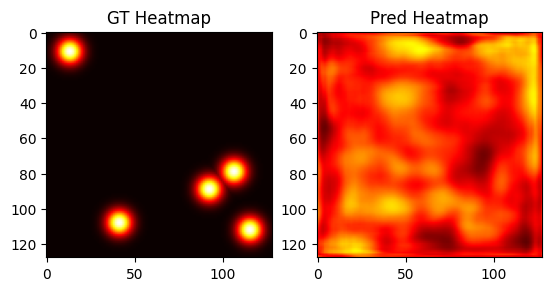


Epoch 1 completed in 230.35 seconds.
Train loss : 421.4958
GT mask loss : 413.1459
GT regr loss : 8.3499


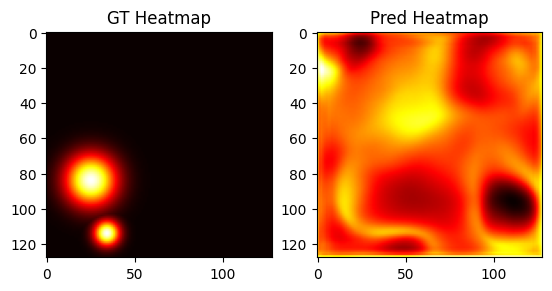


Validation loss      : 2071.5416
Validation mask loss : 2070.8788
Validation regr loss : 0.6628
Precision:        0.0014
Instance Recall:  0.0106
F1 Score:         0.0025
Normal Region FP: 51.05910165484634
FROC Score:       0.0023
Current Learning Rate: 5e-05
F1 Score improved from -inf to 0.0025

Epoch 2/100

Epoch 2 completed in 218.06 seconds.
Train loss : 105.7837
GT mask loss : 102.2040
GT regr loss : 3.5798

Validation loss      : 254.3137
Validation mask loss : 254.0209
Validation regr loss : 0.2928
Precision:        0.0012
Instance Recall:  0.0057
F1 Score:         0.0020
Normal Region FP: 31.872340425531913
FROC Score:       0.0019
Current Learning Rate: 5e-05
No improvement in F1 Score for 1 epoch(s)

Epoch 3/100


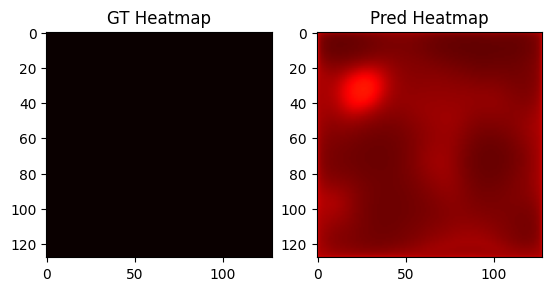


Epoch 3 completed in 216.65 seconds.
Train loss : 20.8961
GT mask loss : 19.3846
GT regr loss : 1.5115

Validation loss      : 50.3773
Validation mask loss : 50.2289
Validation regr loss : 0.1484
Precision:        0.0294
Instance Recall:  0.0002
F1 Score:         0.0003
Normal Region FP: 0.14657210401891252
FROC Score:       0.0219
Current Learning Rate: 5e-05
No improvement in F1 Score for 2 epoch(s)

Epoch 4/100

Epoch 4 completed in 217.18 seconds.
Train loss : 5.8724
GT mask loss : 5.2525
GT regr loss : 0.6200

Validation loss      : 11.0963
Validation mask loss : 11.0019
Validation regr loss : 0.0944
Precision:        0.0455
Instance Recall:  0.0003
F1 Score:         0.0007
Normal Region FP: 0.0
FROC Score:       0.0018
Current Learning Rate: 5e-05
No improvement in F1 Score for 3 epoch(s)

Epoch 5/100


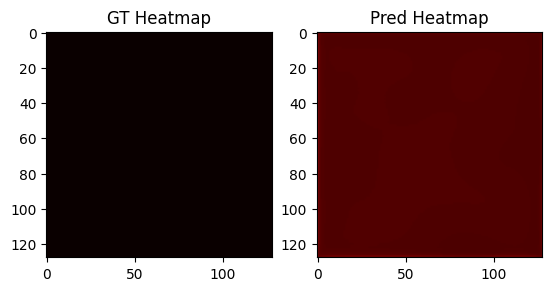


Epoch 5 completed in 217.21 seconds.
Train loss : 2.7781
GT mask loss : 2.3654
GT regr loss : 0.4127

Validation loss      : 4.3085
Validation mask loss : 4.1836
Validation regr loss : 0.1249
Precision:        0.0000
Instance Recall:  0.0000
F1 Score:         0.0000
Normal Region FP: 0.0
FROC Score:       0.0046
Current Learning Rate: 5e-05
No improvement in F1 Score for 4 epoch(s)

Epoch 6/100

Epoch 6 completed in 216.98 seconds.
Train loss : 2.1864
GT mask loss : 1.7965
GT regr loss : 0.3899


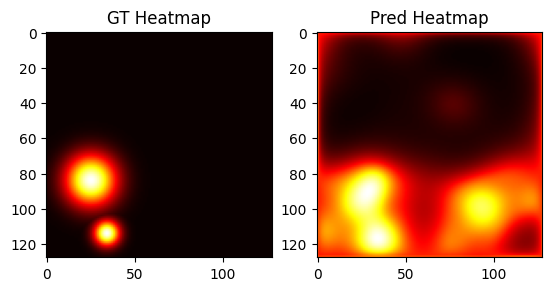


Validation loss      : 2.9082
Validation mask loss : 2.8139
Validation regr loss : 0.0943
Precision:        0.0000
Instance Recall:  0.0000
F1 Score:         0.0000
Normal Region FP: 0.0
FROC Score:       0.0000
Current Learning Rate: 5e-05
No improvement in F1 Score for 5 epoch(s)

Epoch 7/100


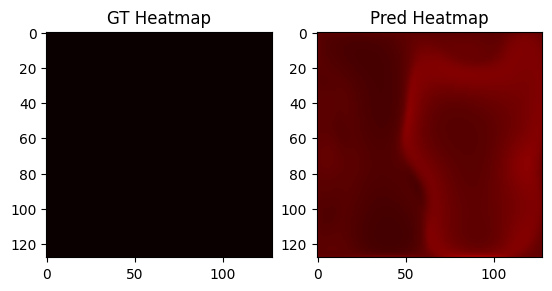


Epoch 7 completed in 217.48 seconds.
Train loss : 1.6813
GT mask loss : 1.3535
GT regr loss : 0.3278

Validation loss      : 1.5257
Validation mask loss : 1.4330
Validation regr loss : 0.0928
Precision:        0.0314
Instance Recall:  0.0015
F1 Score:         0.0029
Normal Region FP: 0.0
FROC Score:       0.0018
Current Learning Rate: 5e-05
F1 Score improved from 0.0025 to 0.0029

Epoch 8/100

Epoch 8 completed in 221.57 seconds.
Train loss : 1.3847
GT mask loss : 1.1099
GT regr loss : 0.2748

Validation loss      : 1.3733
Validation mask loss : 1.2786
Validation regr loss : 0.0947
Precision:        0.0216
Instance Recall:  0.0081
F1 Score:         0.0118
Normal Region FP: 0.009456264775413711
FROC Score:       0.0085
Current Learning Rate: 5e-05
F1 Score improved from 0.0029 to 0.0118

Epoch 9/100


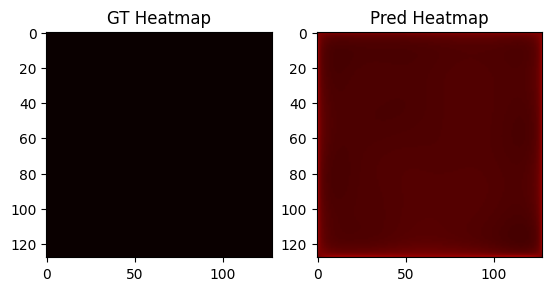


Epoch 9 completed in 222.14 seconds.
Train loss : 1.2232
GT mask loss : 0.9774
GT regr loss : 0.2459

Validation loss      : 1.2917
Validation mask loss : 1.2122
Validation regr loss : 0.0794
Precision:        0.0706
Instance Recall:  0.0313
F1 Score:         0.0434
Normal Region FP: 0.028368794326241134
FROC Score:       0.0314
Current Learning Rate: 5e-05
F1 Score improved from 0.0118 to 0.0434

Epoch 10/100

Epoch 10 completed in 222.35 seconds.
Train loss : 1.0926
GT mask loss : 0.8577
GT regr loss : 0.2349

Validation loss      : 1.2228
Validation mask loss : 1.1446
Validation regr loss : 0.0782
Precision:        0.1548
Instance Recall:  0.1034
F1 Score:         0.1240
Normal Region FP: 0.04846335697399527
FROC Score:       0.1037
Current Learning Rate: 5e-05
F1 Score improved from 0.0434 to 0.1240

Epoch 11/100


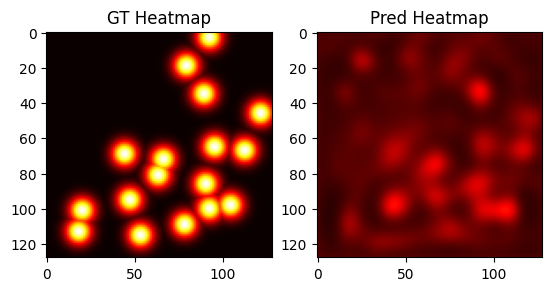


Epoch 11 completed in 221.67 seconds.
Train loss : 1.0288
GT mask loss : 0.8002
GT regr loss : 0.2286


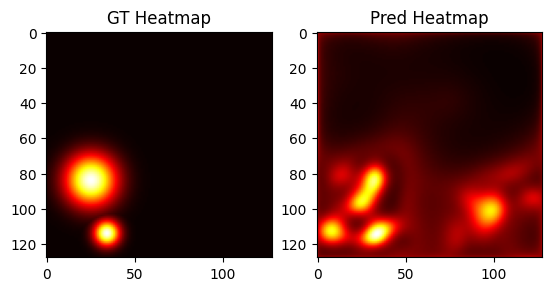


Validation loss      : 1.0629
Validation mask loss : 0.9808
Validation regr loss : 0.0821
Precision:        0.1399
Instance Recall:  0.1040
F1 Score:         0.1193
Normal Region FP: 0.03546099290780142
FROC Score:       0.1043
Current Learning Rate: 5e-05
No improvement in F1 Score for 1 epoch(s)

Epoch 12/100

Epoch 12 completed in 216.84 seconds.
Train loss : 1.0018
GT mask loss : 0.7845
GT regr loss : 0.2173

Validation loss      : 0.8520
Validation mask loss : 0.7690
Validation regr loss : 0.0830
Precision:        0.1243
Instance Recall:  0.0368
F1 Score:         0.0568
Normal Region FP: 0.0035460992907801418
FROC Score:       0.0369
Current Learning Rate: 5e-05
No improvement in F1 Score for 2 epoch(s)

Epoch 13/100


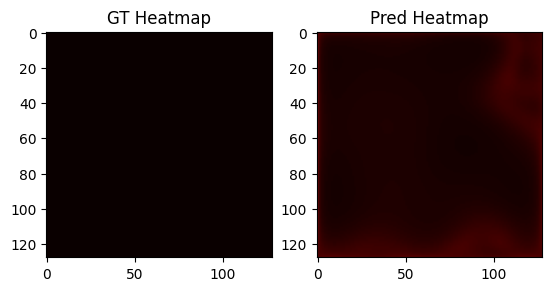


Epoch 13 completed in 217.12 seconds.
Train loss : 0.8898
GT mask loss : 0.6814
GT regr loss : 0.2084

Validation loss      : 0.8706
Validation mask loss : 0.7915
Validation regr loss : 0.0792
Precision:        0.3940
Instance Recall:  0.2944
F1 Score:         0.3370
Normal Region FP: 0.016548463356973995
FROC Score:       0.2952
Current Learning Rate: 5e-05
F1 Score improved from 0.1240 to 0.3370

Epoch 14/100

Epoch 14 completed in 221.73 seconds.
Train loss : 0.7879
GT mask loss : 0.5933
GT regr loss : 0.1946

Validation loss      : 0.8458
Validation mask loss : 0.7640
Validation regr loss : 0.0819
Precision:        0.2815
Instance Recall:  0.2082
F1 Score:         0.2394
Normal Region FP: 0.01773049645390071
FROC Score:       0.2088
Current Learning Rate: 5e-05
No improvement in F1 Score for 1 epoch(s)

Epoch 15/100


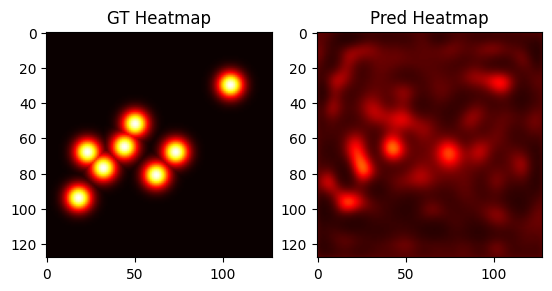


Epoch 15 completed in 217.65 seconds.
Train loss : 0.7310
GT mask loss : 0.5406
GT regr loss : 0.1904

Validation loss      : 0.8419
Validation mask loss : 0.7626
Validation regr loss : 0.0793
Precision:        0.1301
Instance Recall:  0.0954
F1 Score:         0.1101
Normal Region FP: 0.026004728132387706
FROC Score:       0.0954
Current Learning Rate: 5e-05
No improvement in F1 Score for 2 epoch(s)

Epoch 16/100

Epoch 16 completed in 217.08 seconds.
Train loss : 0.6720
GT mask loss : 0.4906
GT regr loss : 0.1814


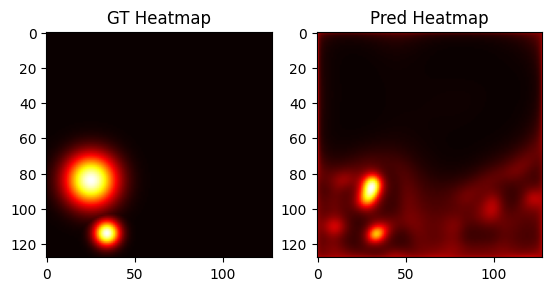


Validation loss      : 0.8247
Validation mask loss : 0.7356
Validation regr loss : 0.0891
Precision:        0.2341
Instance Recall:  0.1425
F1 Score:         0.1771
Normal Region FP: 0.016548463356973995
FROC Score:       0.1426
Current Learning Rate: 5e-05
No improvement in F1 Score for 3 epoch(s)

Epoch 17/100


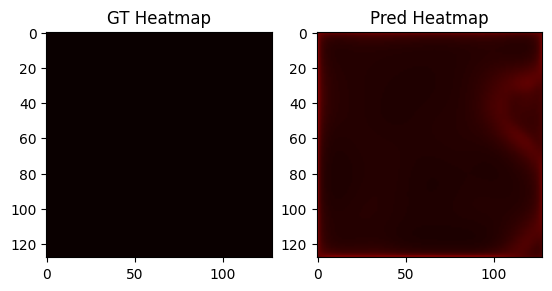


Epoch 17 completed in 217.03 seconds.
Train loss : 0.6967
GT mask loss : 0.5201
GT regr loss : 0.1766

Validation loss      : 0.7947
Validation mask loss : 0.7074
Validation regr loss : 0.0873
Precision:        0.2085
Instance Recall:  0.1373
F1 Score:         0.1655
Normal Region FP: 0.016548463356973995
FROC Score:       0.1373
Current Learning Rate: 5e-05
No improvement in F1 Score for 4 epoch(s)

Epoch 18/100

Epoch 18 completed in 217.31 seconds.
Train loss : 0.6089
GT mask loss : 0.4333
GT regr loss : 0.1756

Validation loss      : 0.8261
Validation mask loss : 0.7416
Validation regr loss : 0.0845
Precision:        0.1306
Instance Recall:  0.0886
F1 Score:         0.1056
Normal Region FP: 0.02009456264775414
FROC Score:       0.0886
Current Learning Rate: 5e-05
No improvement in F1 Score for 5 epoch(s)

Epoch 19/100


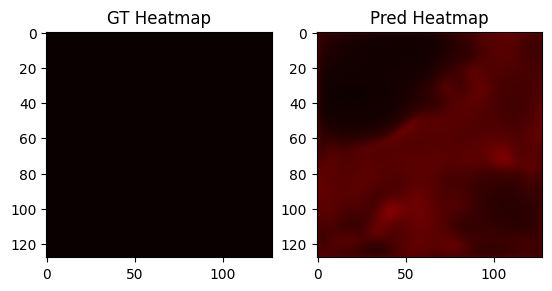


Epoch 19 completed in 217.14 seconds.
Train loss : 0.5908
GT mask loss : 0.4227
GT regr loss : 0.1681

Validation loss      : 0.8554
Validation mask loss : 0.7776
Validation regr loss : 0.0778
Precision:        0.2172
Instance Recall:  0.1726
F1 Score:         0.1924
Normal Region FP: 0.03309692671394799
FROC Score:       0.1727
Current Learning Rate: 5e-05
No improvement in F1 Score for 6 epoch(s)

Epoch 20/100

Epoch 20 completed in 216.70 seconds.
Train loss : 0.5587
GT mask loss : 0.3958
GT regr loss : 0.1629

Validation loss      : 1.0130
Validation mask loss : 0.9335
Validation regr loss : 0.0795
Precision:        0.3390
Instance Recall:  0.2875
F1 Score:         0.3111
Normal Region FP: 0.02009456264775414
FROC Score:       0.2875
Current Learning Rate: 5e-05
No improvement in F1 Score for 7 epoch(s)

Epoch 21/100


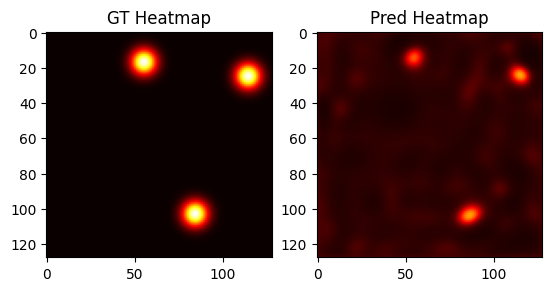


Epoch 21 completed in 217.24 seconds.
Train loss : 0.5119
GT mask loss : 0.3523
GT regr loss : 0.1596


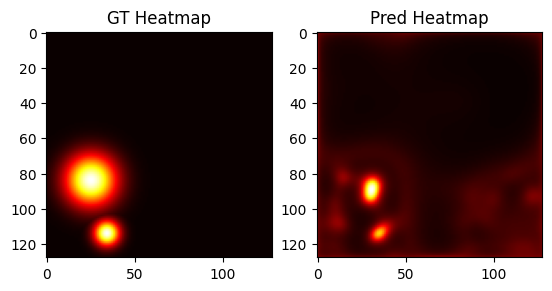


Validation loss      : 0.8158
Validation mask loss : 0.7366
Validation regr loss : 0.0792
Precision:        0.3358
Instance Recall:  0.2172
F1 Score:         0.2638
Normal Region FP: 0.014184397163120567
FROC Score:       0.2176
Current Learning Rate: 5e-05
No improvement in F1 Score for 8 epoch(s)

Epoch 22/100

Epoch 22 completed in 217.07 seconds.
Train loss : 0.4857
GT mask loss : 0.3372
GT regr loss : 0.1485

Validation loss      : 1.0512
Validation mask loss : 0.9766
Validation regr loss : 0.0745
Precision:        0.3338
Instance Recall:  0.2693
F1 Score:         0.2981
Normal Region FP: 0.026004728132387706
FROC Score:       0.2699
Current Learning Rate: 5e-05
No improvement in F1 Score for 9 epoch(s)

Epoch 23/100


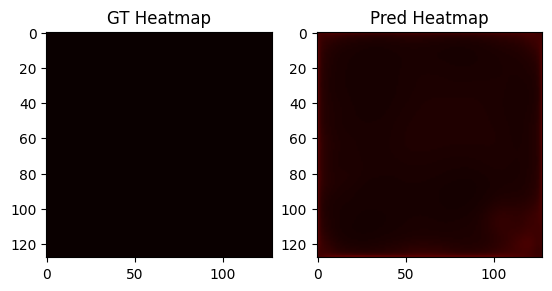


Epoch 23 completed in 217.86 seconds.
Train loss : 0.4655
GT mask loss : 0.3174
GT regr loss : 0.1481

Validation loss      : 0.9555
Validation mask loss : 0.8792
Validation regr loss : 0.0763
Precision:        0.4071
Instance Recall:  0.3114
F1 Score:         0.3528
Normal Region FP: 0.02127659574468085
FROC Score:       0.3128
Current Learning Rate: 2.5e-06
F1 Score improved from 0.3370 to 0.3528

Epoch 24/100

Epoch 24 completed in 221.19 seconds.
Train loss : 0.3961
GT mask loss : 0.2582
GT regr loss : 0.1379

Validation loss      : 0.9257
Validation mask loss : 0.8511
Validation regr loss : 0.0746
Precision:        0.4441
Instance Recall:  0.3386
F1 Score:         0.3842
Normal Region FP: 0.014184397163120567
FROC Score:       0.3409
Current Learning Rate: 2.5e-06
F1 Score improved from 0.3528 to 0.3842

Epoch 25/100


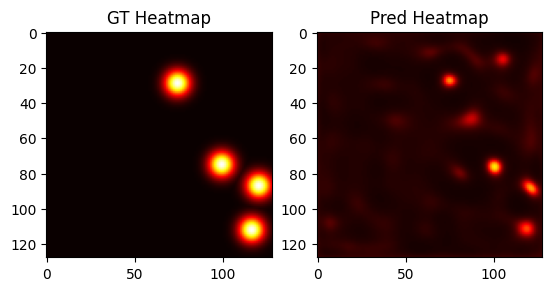


Epoch 25 completed in 221.28 seconds.
Train loss : 0.3845
GT mask loss : 0.2463
GT regr loss : 0.1382

Validation loss      : 0.9195
Validation mask loss : 0.8438
Validation regr loss : 0.0757
Precision:        0.4357
Instance Recall:  0.3236
F1 Score:         0.3714
Normal Region FP: 0.016548463356973995
FROC Score:       0.3255
Current Learning Rate: 2.5e-06
No improvement in F1 Score for 1 epoch(s)

Epoch 26/100

Epoch 26 completed in 216.95 seconds.
Train loss : 0.3808
GT mask loss : 0.2430
GT regr loss : 0.1378


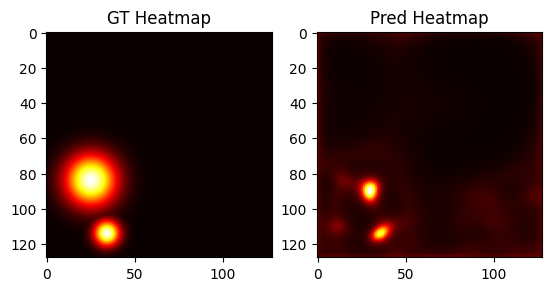


Validation loss      : 0.9094
Validation mask loss : 0.8322
Validation regr loss : 0.0772
Precision:        0.4378
Instance Recall:  0.3100
F1 Score:         0.3630
Normal Region FP: 0.01182033096926714
FROC Score:       0.3120
Current Learning Rate: 2.5e-06
No improvement in F1 Score for 2 epoch(s)

Epoch 27/100


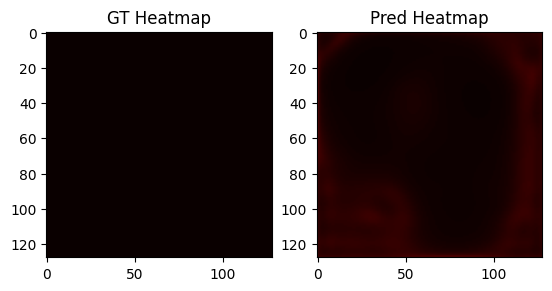


Epoch 27 completed in 217.46 seconds.
Train loss : 0.3694
GT mask loss : 0.2349
GT regr loss : 0.1345

Validation loss      : 0.9808
Validation mask loss : 0.9075
Validation regr loss : 0.0732
Precision:        0.4425
Instance Recall:  0.3453
F1 Score:         0.3879
Normal Region FP: 0.02364066193853428
FROC Score:       0.3495
Current Learning Rate: 2.5e-06
F1 Score improved from 0.3842 to 0.3879

Epoch 28/100

Epoch 28 completed in 221.92 seconds.
Train loss : 0.3810
GT mask loss : 0.2443
GT regr loss : 0.1368

Validation loss      : 0.9292
Validation mask loss : 0.8545
Validation regr loss : 0.0747
Precision:        0.4419
Instance Recall:  0.3225
F1 Score:         0.3728
Normal Region FP: 0.01773049645390071
FROC Score:       0.3255
Current Learning Rate: 2.5e-06
No improvement in F1 Score for 1 epoch(s)

Epoch 29/100


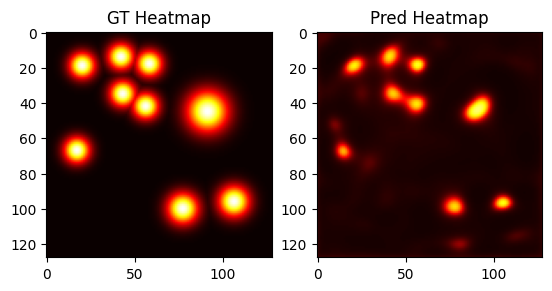


Epoch 29 completed in 217.80 seconds.
Train loss : 0.3604
GT mask loss : 0.2270
GT regr loss : 0.1334

Validation loss      : 0.9106
Validation mask loss : 0.8350
Validation regr loss : 0.0756
Precision:        0.4632
Instance Recall:  0.3263
F1 Score:         0.3829
Normal Region FP: 0.010638297872340425
FROC Score:       0.3290
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 2 epoch(s)

Epoch 30/100

Epoch 30 completed in 216.94 seconds.
Train loss : 0.3625
GT mask loss : 0.2277
GT regr loss : 0.1348

Validation loss      : 0.9815
Validation mask loss : 0.9066
Validation regr loss : 0.0750
Precision:        0.4548
Instance Recall:  0.3384
F1 Score:         0.3881
Normal Region FP: 0.01773049645390071
FROC Score:       0.3416
Current Learning Rate: 1.2500000000000002e-07
F1 Score improved from 0.3879 to 0.3881

Epoch 31/100


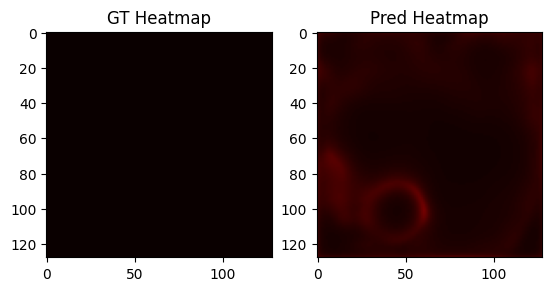


Epoch 31 completed in 221.40 seconds.
Train loss : 0.3567
GT mask loss : 0.2236
GT regr loss : 0.1330


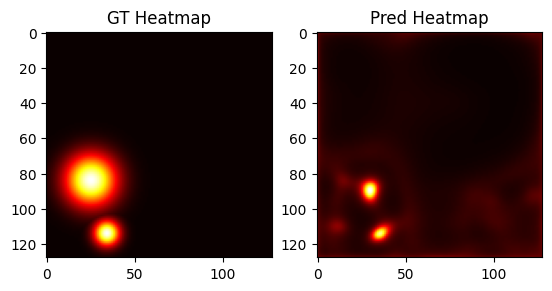


Validation loss      : 0.9005
Validation mask loss : 0.8248
Validation regr loss : 0.0757
Precision:        0.4534
Instance Recall:  0.3120
F1 Score:         0.3697
Normal Region FP: 0.015366430260047281
FROC Score:       0.3149
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 1 epoch(s)

Epoch 32/100

Epoch 32 completed in 217.17 seconds.
Train loss : 0.3590
GT mask loss : 0.2255
GT regr loss : 0.1335

Validation loss      : 0.8901
Validation mask loss : 0.8134
Validation regr loss : 0.0767
Precision:        0.4510
Instance Recall:  0.3140
F1 Score:         0.3703
Normal Region FP: 0.009456264775413711
FROC Score:       0.3169
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 2 epoch(s)

Epoch 33/100


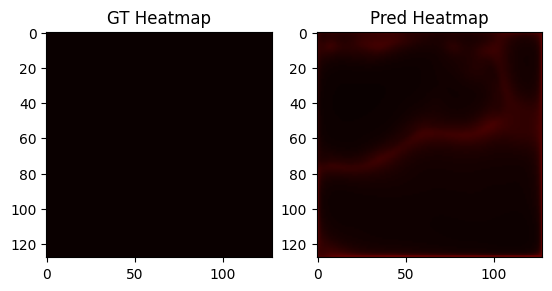


Epoch 33 completed in 217.66 seconds.
Train loss : 0.3737
GT mask loss : 0.2385
GT regr loss : 0.1352

Validation loss      : 0.9365
Validation mask loss : 0.8610
Validation regr loss : 0.0755
Precision:        0.4452
Instance Recall:  0.3287
F1 Score:         0.3782
Normal Region FP: 0.01773049645390071
FROC Score:       0.3315
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 3 epoch(s)

Epoch 34/100

Epoch 34 completed in 217.42 seconds.
Train loss : 0.3563
GT mask loss : 0.2230
GT regr loss : 0.1332

Validation loss      : 0.9288
Validation mask loss : 0.8533
Validation regr loss : 0.0756
Precision:        0.4429
Instance Recall:  0.3245
F1 Score:         0.3746
Normal Region FP: 0.016548463356973995
FROC Score:       0.3267
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 4 epoch(s)

Epoch 35/100


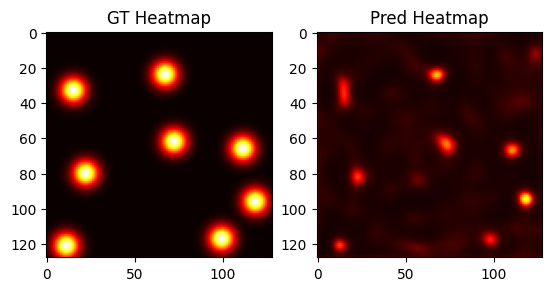


Epoch 35 completed in 217.61 seconds.
Train loss : 0.3606
GT mask loss : 0.2277
GT regr loss : 0.1329

Validation loss      : 0.9810
Validation mask loss : 0.9055
Validation regr loss : 0.0755
Precision:        0.4580
Instance Recall:  0.3438
F1 Score:         0.3928
Normal Region FP: 0.016548463356973995
FROC Score:       0.3480
Current Learning Rate: 1e-07
F1 Score improved from 0.3881 to 0.3928

Epoch 36/100

Epoch 36 completed in 221.46 seconds.
Train loss : 0.3678
GT mask loss : 0.2359
GT regr loss : 0.1319


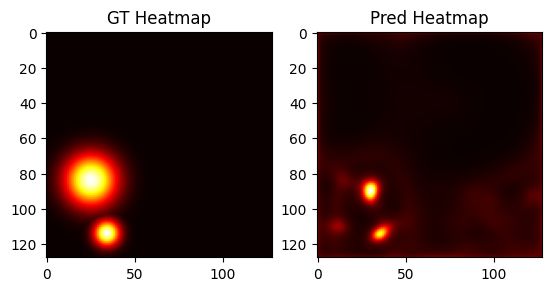


Validation loss      : 0.9483
Validation mask loss : 0.8724
Validation regr loss : 0.0759
Precision:        0.4501
Instance Recall:  0.3329
F1 Score:         0.3827
Normal Region FP: 0.016548463356973995
FROC Score:       0.3362
Current Learning Rate: 1e-07
No improvement in F1 Score for 1 epoch(s)

Epoch 37/100


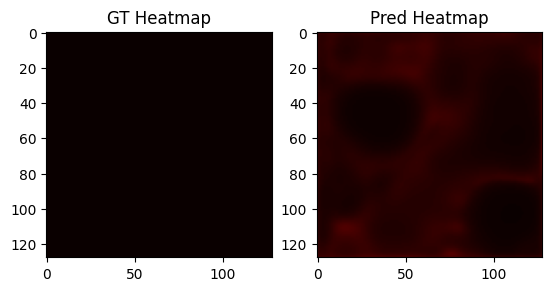


Epoch 37 completed in 217.82 seconds.
Train loss : 0.3464
GT mask loss : 0.2125
GT regr loss : 0.1339

Validation loss      : 0.9479
Validation mask loss : 0.8724
Validation regr loss : 0.0754
Precision:        0.4563
Instance Recall:  0.3248
F1 Score:         0.3795
Normal Region FP: 0.016548463356973995
FROC Score:       0.3280
Current Learning Rate: 1e-07
No improvement in F1 Score for 2 epoch(s)

Epoch 38/100

Epoch 38 completed in 217.49 seconds.
Train loss : 0.3657
GT mask loss : 0.2333
GT regr loss : 0.1325

Validation loss      : 0.9880
Validation mask loss : 0.9129
Validation regr loss : 0.0750
Precision:        0.4520
Instance Recall:  0.3452
F1 Score:         0.3914
Normal Region FP: 0.015366430260047281
FROC Score:       0.3487
Current Learning Rate: 1e-07
No improvement in F1 Score for 3 epoch(s)

Epoch 39/100


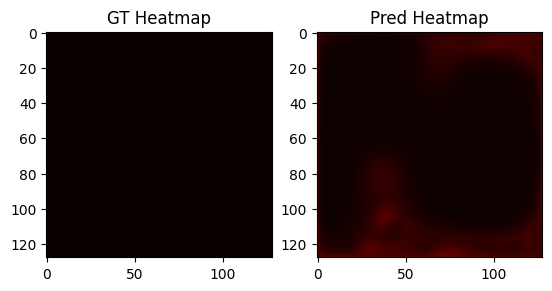


Epoch 39 completed in 218.28 seconds.
Train loss : 0.3654
GT mask loss : 0.2295
GT regr loss : 0.1360

Validation loss      : 0.9920
Validation mask loss : 0.9171
Validation regr loss : 0.0749
Precision:        0.4690
Instance Recall:  0.3470
F1 Score:         0.3989
Normal Region FP: 0.02127659574468085
FROC Score:       0.3511
Current Learning Rate: 1e-07
F1 Score improved from 0.3928 to 0.3989

Epoch 40/100

Epoch 40 completed in 221.23 seconds.
Train loss : 0.3704
GT mask loss : 0.2345
GT regr loss : 0.1359

Validation loss      : 0.9546
Validation mask loss : 0.8792
Validation regr loss : 0.0754
Precision:        0.4558
Instance Recall:  0.3263
F1 Score:         0.3804
Normal Region FP: 0.018912529550827423
FROC Score:       0.3290
Current Learning Rate: 1e-07
No improvement in F1 Score for 1 epoch(s)

Epoch 41/100


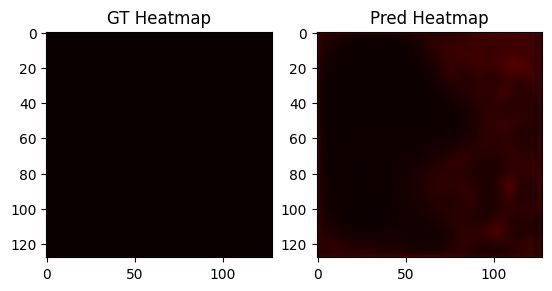


Epoch 41 completed in 217.44 seconds.
Train loss : 0.3623
GT mask loss : 0.2273
GT regr loss : 0.1350


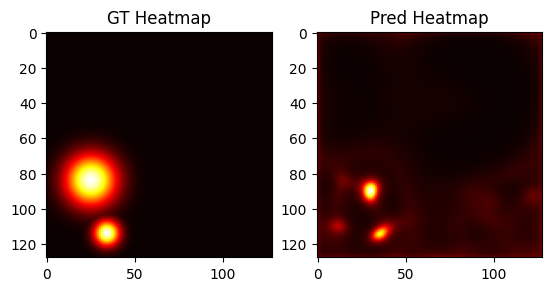


Validation loss      : 0.9711
Validation mask loss : 0.8962
Validation regr loss : 0.0749
Precision:        0.4344
Instance Recall:  0.3339
F1 Score:         0.3776
Normal Region FP: 0.02364066193853428
FROC Score:       0.3378
Current Learning Rate: 1e-07
No improvement in F1 Score for 2 epoch(s)

Epoch 42/100

Epoch 42 completed in 217.35 seconds.
Train loss : 0.3531
GT mask loss : 0.2196
GT regr loss : 0.1335

Validation loss      : 0.9692
Validation mask loss : 0.8933
Validation regr loss : 0.0759
Precision:        0.4563
Instance Recall:  0.3337
F1 Score:         0.3855
Normal Region FP: 0.016548463356973995
FROC Score:       0.3368
Current Learning Rate: 1e-07
No improvement in F1 Score for 3 epoch(s)

Epoch 43/100


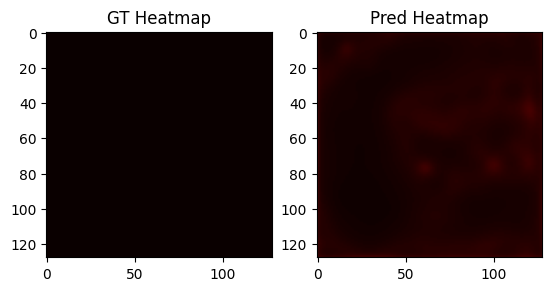


Epoch 43 completed in 217.08 seconds.
Train loss : 0.3589
GT mask loss : 0.2266
GT regr loss : 0.1323

Validation loss      : 0.9718
Validation mask loss : 0.8960
Validation regr loss : 0.0759
Precision:        0.4589
Instance Recall:  0.3359
F1 Score:         0.3879
Normal Region FP: 0.01773049645390071
FROC Score:       0.3386
Current Learning Rate: 1e-07
No improvement in F1 Score for 4 epoch(s)

Epoch 44/100

Epoch 44 completed in 217.79 seconds.
Train loss : 0.3462
GT mask loss : 0.2147
GT regr loss : 0.1315

Validation loss      : 0.9168
Validation mask loss : 0.8414
Validation regr loss : 0.0754
Precision:        0.4426
Instance Recall:  0.3294
F1 Score:         0.3777
Normal Region FP: 0.014184397163120567
FROC Score:       0.3320
Current Learning Rate: 1e-07
No improvement in F1 Score for 5 epoch(s)

Epoch 45/100


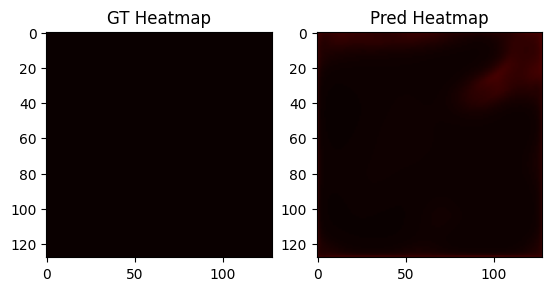


Epoch 45 completed in 217.87 seconds.
Train loss : 0.3567
GT mask loss : 0.2217
GT regr loss : 0.1350

Validation loss      : 0.9425
Validation mask loss : 0.8675
Validation regr loss : 0.0750
Precision:        0.4744
Instance Recall:  0.3482
F1 Score:         0.4016
Normal Region FP: 0.016548463356973995
FROC Score:       0.3529
Current Learning Rate: 1e-07
F1 Score improved from 0.3989 to 0.4016

Epoch 46/100

Epoch 46 completed in 221.80 seconds.
Train loss : 0.3508
GT mask loss : 0.2194
GT regr loss : 0.1314


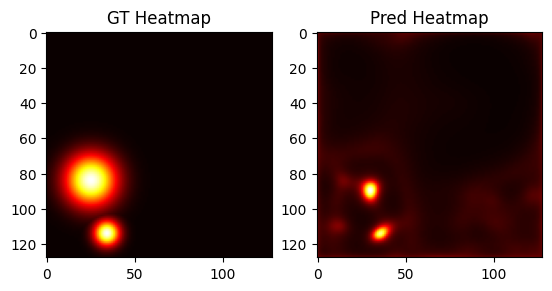


Validation loss      : 0.9195
Validation mask loss : 0.8437
Validation regr loss : 0.0759
Precision:        0.4604
Instance Recall:  0.3258
F1 Score:         0.3816
Normal Region FP: 0.014184397163120567
FROC Score:       0.3290
Current Learning Rate: 1e-07
No improvement in F1 Score for 1 epoch(s)

Epoch 47/100


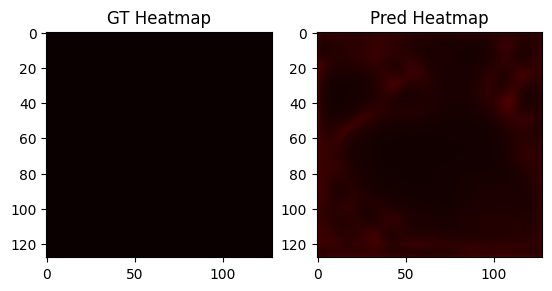


Epoch 47 completed in 217.55 seconds.
Train loss : 0.3431
GT mask loss : 0.2121
GT regr loss : 0.1311

Validation loss      : 0.9227
Validation mask loss : 0.8469
Validation regr loss : 0.0758
Precision:        0.4638
Instance Recall:  0.3403
F1 Score:         0.3925
Normal Region FP: 0.013002364066193853
FROC Score:       0.3437
Current Learning Rate: 1e-07
No improvement in F1 Score for 2 epoch(s)

Epoch 48/100

Epoch 48 completed in 217.11 seconds.
Train loss : 0.3600
GT mask loss : 0.2259
GT regr loss : 0.1341

Validation loss      : 0.9822
Validation mask loss : 0.9068
Validation regr loss : 0.0754
Precision:        0.4552
Instance Recall:  0.3455
F1 Score:         0.3928
Normal Region FP: 0.01773049645390071
FROC Score:       0.3487
Current Learning Rate: 1e-07
No improvement in F1 Score for 3 epoch(s)

Epoch 49/100


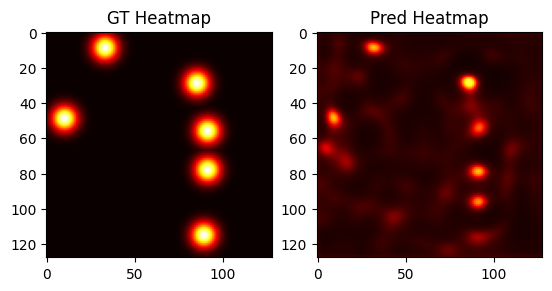


Epoch 49 completed in 219.50 seconds.
Train loss : 0.3683
GT mask loss : 0.2316
GT regr loss : 0.1367

Validation loss      : 0.9610
Validation mask loss : 0.8863
Validation regr loss : 0.0747
Precision:        0.4573
Instance Recall:  0.3440
F1 Score:         0.3926
Normal Region FP: 0.01773049645390071
FROC Score:       0.3475
Current Learning Rate: 1e-07
No improvement in F1 Score for 4 epoch(s)

Epoch 50/100

Epoch 50 completed in 217.34 seconds.
Train loss : 0.3626
GT mask loss : 0.2307
GT regr loss : 0.1319

Validation loss      : 0.9083
Validation mask loss : 0.8326
Validation regr loss : 0.0757
Precision:        0.4660
Instance Recall:  0.3373
F1 Score:         0.3913
Normal Region FP: 0.014184397163120567
FROC Score:       0.3420
Current Learning Rate: 1e-07
No improvement in F1 Score for 5 epoch(s)

Epoch 51/100


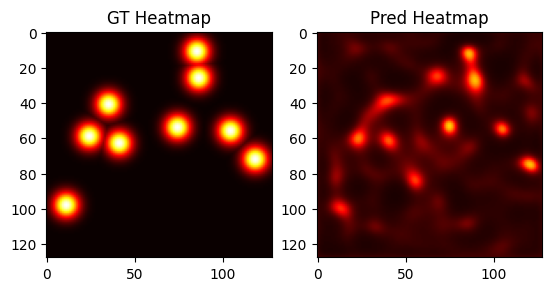


Epoch 51 completed in 217.88 seconds.
Train loss : 0.3642
GT mask loss : 0.2314
GT regr loss : 0.1328


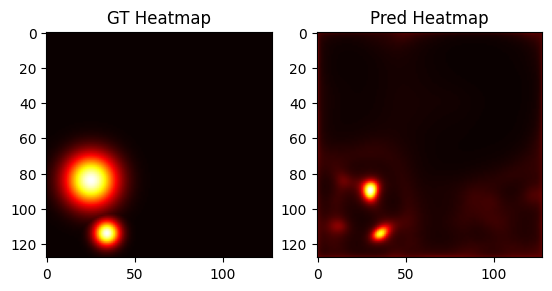


Validation loss      : 0.9567
Validation mask loss : 0.8807
Validation regr loss : 0.0760
Precision:        0.4582
Instance Recall:  0.3361
F1 Score:         0.3877
Normal Region FP: 0.015366430260047281
FROC Score:       0.3399
Current Learning Rate: 1e-07
No improvement in F1 Score for 6 epoch(s)

Epoch 52/100

Epoch 52 completed in 217.54 seconds.
Train loss : 0.3529
GT mask loss : 0.2222
GT regr loss : 0.1307

Validation loss      : 1.0043
Validation mask loss : 0.9301
Validation regr loss : 0.0743
Precision:        0.4438
Instance Recall:  0.3650
F1 Score:         0.4006
Normal Region FP: 0.022458628841607566
FROC Score:       0.3694
Current Learning Rate: 1e-07
No improvement in F1 Score for 7 epoch(s)

Epoch 53/100


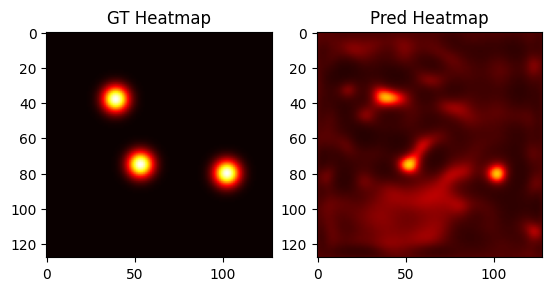


Epoch 53 completed in 217.57 seconds.
Train loss : 0.3553
GT mask loss : 0.2206
GT regr loss : 0.1346

Validation loss      : 0.9118
Validation mask loss : 0.8371
Validation regr loss : 0.0747
Precision:        0.4598
Instance Recall:  0.3465
F1 Score:         0.3952
Normal Region FP: 0.015366430260047281
FROC Score:       0.3509
Current Learning Rate: 1e-07
No improvement in F1 Score for 8 epoch(s)

Epoch 54/100

Epoch 54 completed in 217.49 seconds.
Train loss : 0.3578
GT mask loss : 0.2245
GT regr loss : 0.1333

Validation loss      : 0.9082
Validation mask loss : 0.8328
Validation regr loss : 0.0755
Precision:        0.4504
Instance Recall:  0.3241
F1 Score:         0.3770
Normal Region FP: 0.014184397163120567
FROC Score:       0.3278
Current Learning Rate: 1e-07
No improvement in F1 Score for 9 epoch(s)

Epoch 55/100


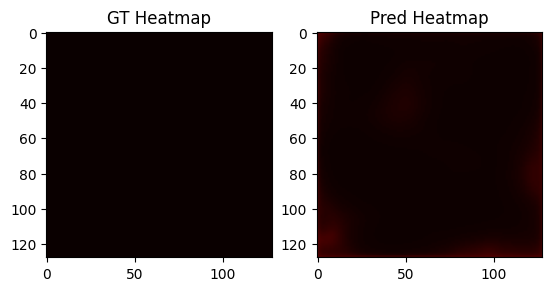


Epoch 55 completed in 217.50 seconds.
Train loss : 0.3544
GT mask loss : 0.2228
GT regr loss : 0.1315

Validation loss      : 0.9718
Validation mask loss : 0.8963
Validation regr loss : 0.0756
Precision:        0.4456
Instance Recall:  0.3440
F1 Score:         0.3883
Normal Region FP: 0.016548463356973995
FROC Score:       0.3468
Current Learning Rate: 1e-07
No improvement in F1 Score for 10 epoch(s)
Early stopping triggered after 10 epochs without improvement.
Early stopping at epoch 55


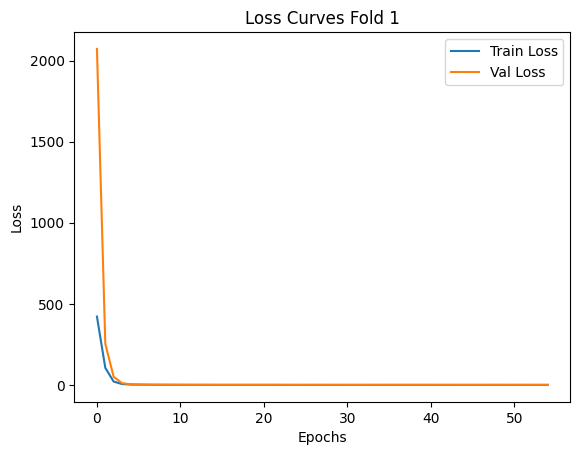


 Test Result
Precision: 0.4425
Instance Recall: 0.3917
F1 Score:  0.4156
FPs:       99.9696
FROC Score: 0.3952
Saved results to: /content/drive/MyDrive/Dissertation_Chatwipa/model_checkpoint/student_pseudolabel/adamw18_checkpoints_20250722_105039/fold1/test_results.csv
==== Test Fold: fold2, Val Fold: fold3, Train Folds: ['fold1', 'fold4'] ====

Epoch 1/100


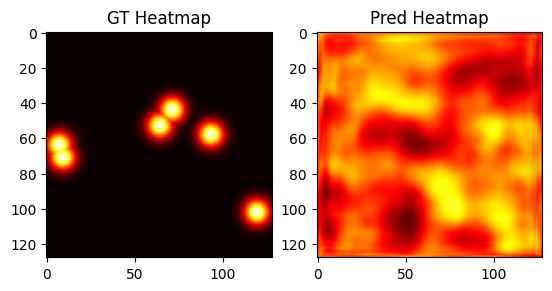


Epoch 1 completed in 226.11 seconds.
Train loss : 247.8709
GT mask loss : 240.3528
GT regr loss : 7.5181


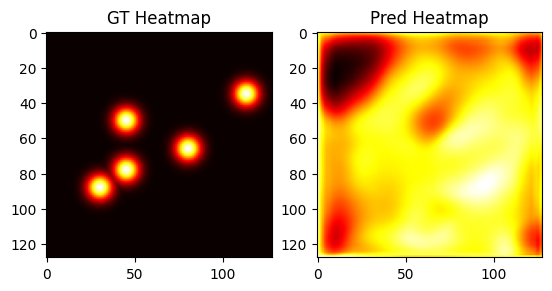


Validation loss      : 1513.8007
Validation mask loss : 1513.3671
Validation regr loss : 0.4336
Precision:        0.0036
Instance Recall:  0.0212
F1 Score:         0.0062
Normal Region FP: 39.680701754385964
FROC Score:       0.0056
Current Learning Rate: 5e-05
F1 Score improved from -inf to 0.0062

Epoch 2/100

Epoch 2 completed in 226.03 seconds.
Train loss : 75.7565
GT mask loss : 72.3620
GT regr loss : 3.3945

Validation loss      : 137.3878
Validation mask loss : 137.2198
Validation regr loss : 0.1680
Precision:        0.0244
Instance Recall:  0.0574
F1 Score:         0.0342
Normal Region FP: 9.846783625730994
FROC Score:       0.0358
Current Learning Rate: 5e-05
F1 Score improved from 0.0062 to 0.0342

Epoch 3/100


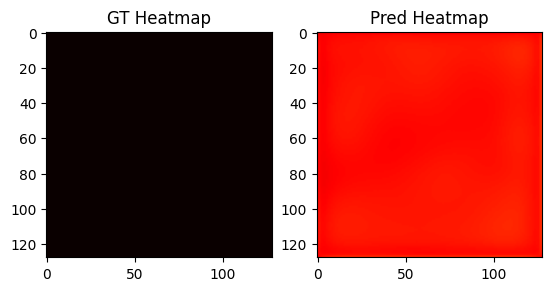


Epoch 3 completed in 229.69 seconds.
Train loss : 12.4770
GT mask loss : 11.3451
GT regr loss : 1.1320

Validation loss      : 29.3827
Validation mask loss : 29.2810
Validation regr loss : 0.1017
Precision:        0.0000
Instance Recall:  0.0000
F1 Score:         0.0000
Normal Region FP: 0.0
FROC Score:       0.0006
Current Learning Rate: 5e-05
No improvement in F1 Score for 1 epoch(s)

Epoch 4/100

Epoch 4 completed in 225.64 seconds.
Train loss : 4.6376
GT mask loss : 4.0595
GT regr loss : 0.5781

Validation loss      : 7.6798
Validation mask loss : 7.5797
Validation regr loss : 0.1000
Precision:        0.0000
Instance Recall:  0.0000
F1 Score:         0.0000
Normal Region FP: 0.0
FROC Score:       0.0000
Current Learning Rate: 5e-05
No improvement in F1 Score for 2 epoch(s)

Epoch 5/100


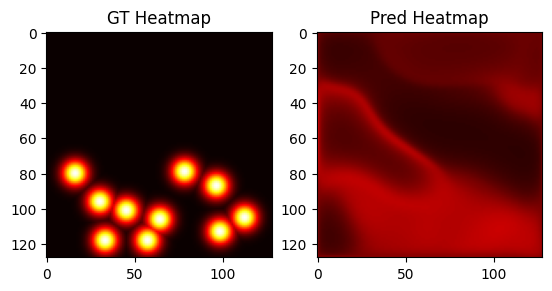


Epoch 5 completed in 225.92 seconds.
Train loss : 2.1527
GT mask loss : 1.6998
GT regr loss : 0.4529

Validation loss      : 4.0846
Validation mask loss : 3.9873
Validation regr loss : 0.0973
Precision:        0.0000
Instance Recall:  0.0000
F1 Score:         0.0000
Normal Region FP: 0.0
FROC Score:       0.0001
Current Learning Rate: 5e-05
No improvement in F1 Score for 3 epoch(s)

Epoch 6/100

Epoch 6 completed in 225.64 seconds.
Train loss : 1.5901
GT mask loss : 1.2414
GT regr loss : 0.3486


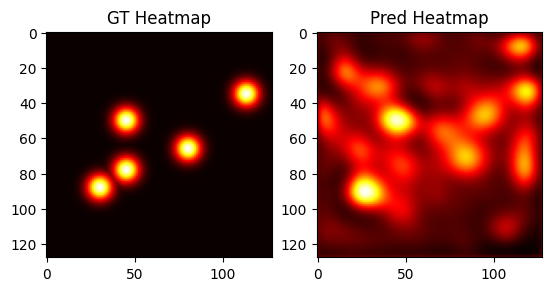


Validation loss      : 2.4148
Validation mask loss : 2.3317
Validation regr loss : 0.0832
Precision:        0.0342
Instance Recall:  0.0173
F1 Score:         0.0229
Normal Region FP: 0.0456140350877193
FROC Score:       0.0175
Current Learning Rate: 5e-05
No improvement in F1 Score for 4 epoch(s)

Epoch 7/100


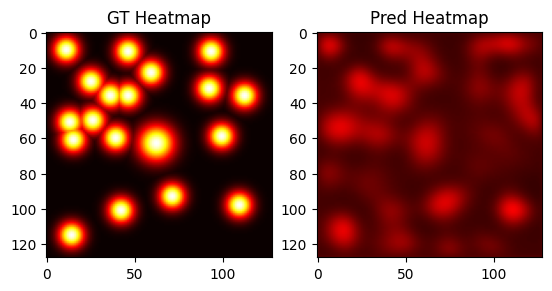


Epoch 7 completed in 225.37 seconds.
Train loss : 1.3403
GT mask loss : 1.0436
GT regr loss : 0.2968

Validation loss      : 1.2896
Validation mask loss : 1.2076
Validation regr loss : 0.0819
Precision:        0.1609
Instance Recall:  0.0971
F1 Score:         0.1211
Normal Region FP: 0.0304093567251462
FROC Score:       0.0992
Current Learning Rate: 5e-05
F1 Score improved from 0.0342 to 0.1211

Epoch 8/100

Epoch 8 completed in 229.61 seconds.
Train loss : 1.3141
GT mask loss : 1.0497
GT regr loss : 0.2644

Validation loss      : 1.4577
Validation mask loss : 1.3750
Validation regr loss : 0.0826
Precision:        0.0627
Instance Recall:  0.0408
F1 Score:         0.0494
Normal Region FP: 0.042105263157894736
FROC Score:       0.0409
Current Learning Rate: 5e-05
No improvement in F1 Score for 1 epoch(s)

Epoch 9/100


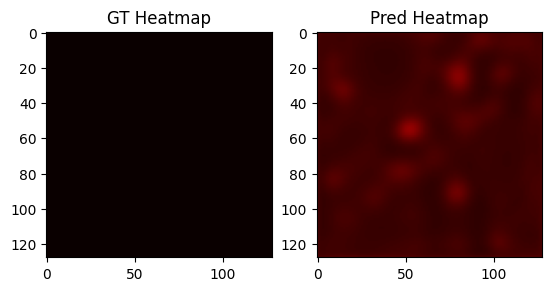


Epoch 9 completed in 225.28 seconds.
Train loss : 1.1499
GT mask loss : 0.8963
GT regr loss : 0.2536

Validation loss      : 1.3679
Validation mask loss : 1.2869
Validation regr loss : 0.0810
Precision:        0.1254
Instance Recall:  0.1056
F1 Score:         0.1147
Normal Region FP: 0.08070175438596491
FROC Score:       0.1074
Current Learning Rate: 5e-05
No improvement in F1 Score for 2 epoch(s)

Epoch 10/100

Epoch 10 completed in 225.28 seconds.
Train loss : 1.0646
GT mask loss : 0.8345
GT regr loss : 0.2302

Validation loss      : 0.7936
Validation mask loss : 0.7145
Validation regr loss : 0.0791
Precision:        0.2799
Instance Recall:  0.2050
F1 Score:         0.2367
Normal Region FP: 0.012865497076023392
FROC Score:       0.2086
Current Learning Rate: 5e-05
F1 Score improved from 0.1211 to 0.2367

Epoch 11/100


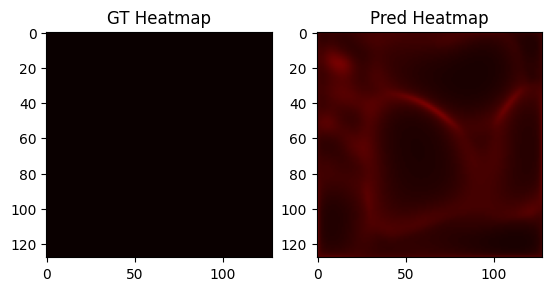


Epoch 11 completed in 229.71 seconds.
Train loss : 0.9834
GT mask loss : 0.7637
GT regr loss : 0.2198


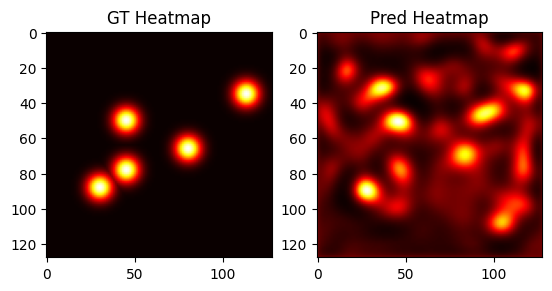


Validation loss      : 0.8532
Validation mask loss : 0.7735
Validation regr loss : 0.0797
Precision:        0.2831
Instance Recall:  0.2194
F1 Score:         0.2472
Normal Region FP: 0.028070175438596492
FROC Score:       0.2205
Current Learning Rate: 5e-05
F1 Score improved from 0.2367 to 0.2472

Epoch 12/100

Epoch 12 completed in 230.15 seconds.
Train loss : 0.8542
GT mask loss : 0.6401
GT regr loss : 0.2141

Validation loss      : 1.0273
Validation mask loss : 0.9503
Validation regr loss : 0.0769
Precision:        0.2498
Instance Recall:  0.3140
F1 Score:         0.2782
Normal Region FP: 0.0783625730994152
FROC Score:       0.3149
Current Learning Rate: 5e-05
F1 Score improved from 0.2472 to 0.2782

Epoch 13/100


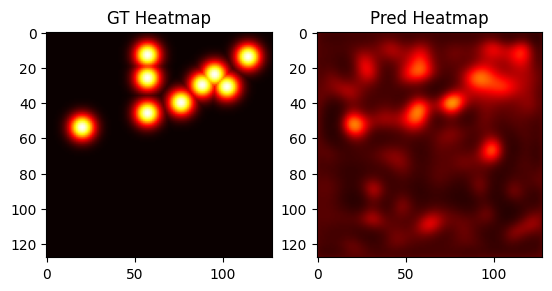


Epoch 13 completed in 231.23 seconds.
Train loss : 0.7683
GT mask loss : 0.5681
GT regr loss : 0.2002

Validation loss      : 1.0983
Validation mask loss : 1.0237
Validation regr loss : 0.0746
Precision:        0.3630
Instance Recall:  0.4144
F1 Score:         0.3870
Normal Region FP: 0.10292397660818714
FROC Score:       0.4191
Current Learning Rate: 5e-05
F1 Score improved from 0.2782 to 0.3870

Epoch 14/100

Epoch 14 completed in 231.32 seconds.
Train loss : 0.7126
GT mask loss : 0.5195
GT regr loss : 0.1930

Validation loss      : 1.3677
Validation mask loss : 1.2910
Validation regr loss : 0.0767
Precision:        0.3264
Instance Recall:  0.4444
F1 Score:         0.3763
Normal Region FP: 0.14853801169590644
FROC Score:       0.4461
Current Learning Rate: 5e-05
No improvement in F1 Score for 1 epoch(s)

Epoch 15/100


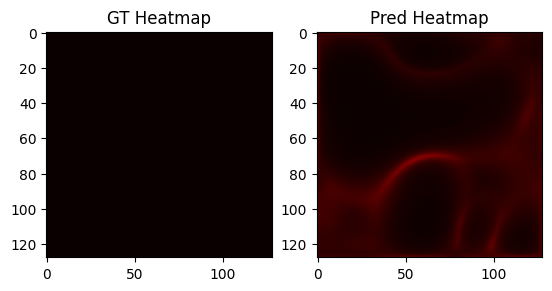


Epoch 15 completed in 230.70 seconds.
Train loss : 0.6714
GT mask loss : 0.4883
GT regr loss : 0.1832

Validation loss      : 0.8075
Validation mask loss : 0.7335
Validation regr loss : 0.0741
Precision:        0.3131
Instance Recall:  0.3073
F1 Score:         0.3102
Normal Region FP: 0.06549707602339182
FROC Score:       0.3092
Current Learning Rate: 5e-05
No improvement in F1 Score for 2 epoch(s)

Epoch 16/100

Epoch 16 completed in 226.44 seconds.
Train loss : 0.5910
GT mask loss : 0.4159
GT regr loss : 0.1751


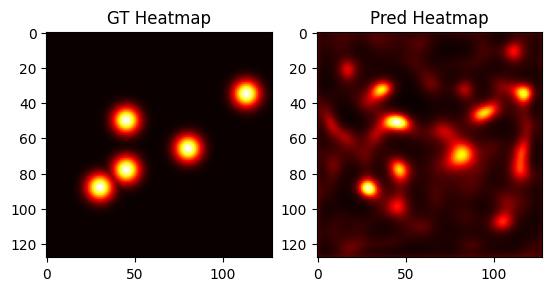


Validation loss      : 0.8700
Validation mask loss : 0.7960
Validation regr loss : 0.0740
Precision:        0.3606
Instance Recall:  0.4257
F1 Score:         0.3905
Normal Region FP: 0.06315789473684211
FROC Score:       0.4291
Current Learning Rate: 2.5e-06
F1 Score improved from 0.3870 to 0.3905

Epoch 17/100


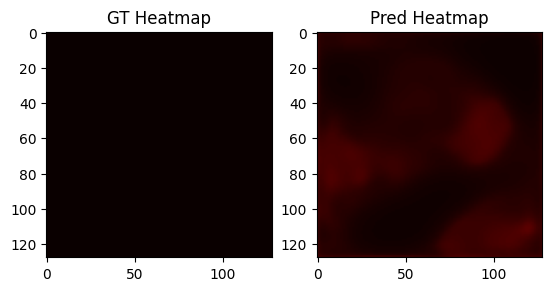


Epoch 17 completed in 231.65 seconds.
Train loss : 0.5495
GT mask loss : 0.3812
GT regr loss : 0.1684

Validation loss      : 0.7050
Validation mask loss : 0.6312
Validation regr loss : 0.0738
Precision:        0.4041
Instance Recall:  0.4415
F1 Score:         0.4219
Normal Region FP: 0.03859649122807018
FROC Score:       0.4469
Current Learning Rate: 2.5e-06
F1 Score improved from 0.3905 to 0.4219

Epoch 18/100

Epoch 18 completed in 230.94 seconds.
Train loss : 0.5265
GT mask loss : 0.3603
GT regr loss : 0.1662

Validation loss      : 0.7706
Validation mask loss : 0.6975
Validation regr loss : 0.0731
Precision:        0.3642
Instance Recall:  0.4230
F1 Score:         0.3914
Normal Region FP: 0.03859649122807018
FROC Score:       0.4269
Current Learning Rate: 2.5e-06
No improvement in F1 Score for 1 epoch(s)

Epoch 19/100


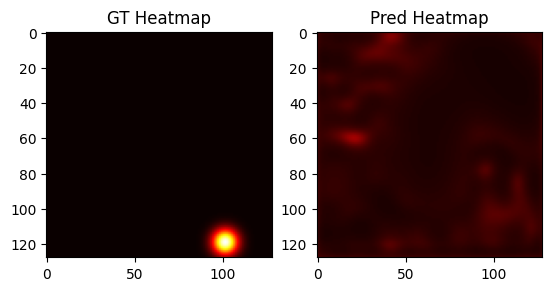


Epoch 19 completed in 226.62 seconds.
Train loss : 0.5297
GT mask loss : 0.3657
GT regr loss : 0.1640

Validation loss      : 0.7840
Validation mask loss : 0.7109
Validation regr loss : 0.0731
Precision:        0.3958
Instance Recall:  0.4496
F1 Score:         0.4210
Normal Region FP: 0.05380116959064327
FROC Score:       0.4550
Current Learning Rate: 2.5e-06
No improvement in F1 Score for 2 epoch(s)

Epoch 20/100

Epoch 20 completed in 226.59 seconds.
Train loss : 0.5074
GT mask loss : 0.3466
GT regr loss : 0.1608

Validation loss      : 0.7795
Validation mask loss : 0.7064
Validation regr loss : 0.0731
Precision:        0.3809
Instance Recall:  0.4404
F1 Score:         0.4085
Normal Region FP: 0.05497076023391813
FROC Score:       0.4450
Current Learning Rate: 2.5e-06
No improvement in F1 Score for 3 epoch(s)

Epoch 21/100


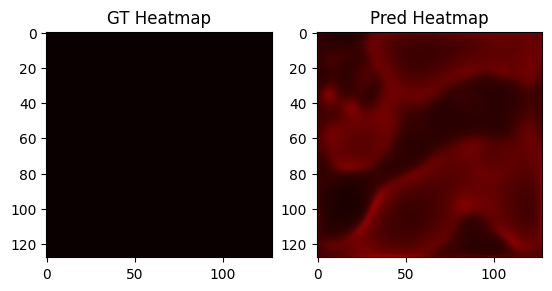


Epoch 21 completed in 226.10 seconds.
Train loss : 0.5075
GT mask loss : 0.3478
GT regr loss : 0.1598


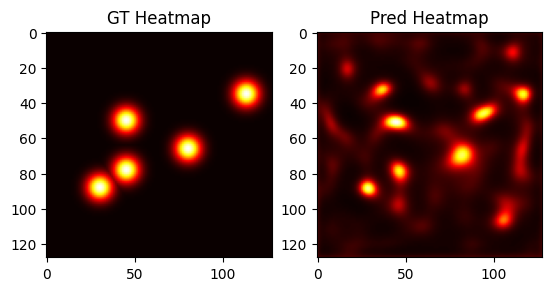


Validation loss      : 0.8321
Validation mask loss : 0.7598
Validation regr loss : 0.0723
Precision:        0.4189
Instance Recall:  0.5020
F1 Score:         0.4567
Normal Region FP: 0.05497076023391813
FROC Score:       0.5081
Current Learning Rate: 2.5e-06
F1 Score improved from 0.4219 to 0.4567

Epoch 22/100

Epoch 22 completed in 231.53 seconds.
Train loss : 0.4982
GT mask loss : 0.3360
GT regr loss : 0.1623

Validation loss      : 0.7822
Validation mask loss : 0.7100
Validation regr loss : 0.0723
Precision:        0.4122
Instance Recall:  0.4806
F1 Score:         0.4437
Normal Region FP: 0.047953216374269005
FROC Score:       0.4869
Current Learning Rate: 2.5e-06
No improvement in F1 Score for 1 epoch(s)

Epoch 23/100


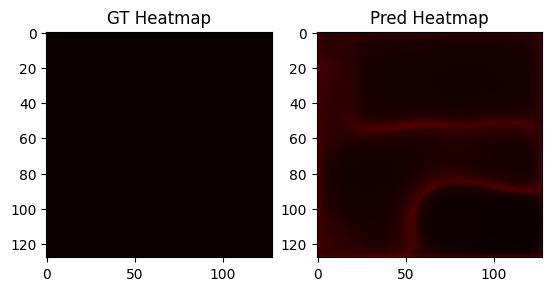


Epoch 23 completed in 228.35 seconds.
Train loss : 0.5031
GT mask loss : 0.3438
GT regr loss : 0.1593

Validation loss      : 0.7549
Validation mask loss : 0.6829
Validation regr loss : 0.0720
Precision:        0.4060
Instance Recall:  0.4652
F1 Score:         0.4336
Normal Region FP: 0.042105263157894736
FROC Score:       0.4721
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 2 epoch(s)

Epoch 24/100

Epoch 24 completed in 226.67 seconds.
Train loss : 0.4778
GT mask loss : 0.3167
GT regr loss : 0.1611

Validation loss      : 0.7609
Validation mask loss : 0.6886
Validation regr loss : 0.0723
Precision:        0.4033
Instance Recall:  0.4627
F1 Score:         0.4310
Normal Region FP: 0.04678362573099415
FROC Score:       0.4681
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 3 epoch(s)

Epoch 25/100


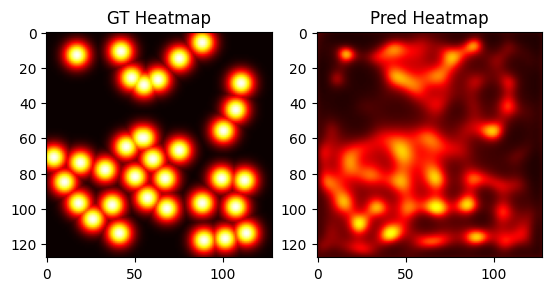


Epoch 25 completed in 226.95 seconds.
Train loss : 0.5223
GT mask loss : 0.3623
GT regr loss : 0.1600

Validation loss      : 0.7929
Validation mask loss : 0.7207
Validation regr loss : 0.0721
Precision:        0.3959
Instance Recall:  0.4585
F1 Score:         0.4249
Normal Region FP: 0.056140350877192984
FROC Score:       0.4653
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 4 epoch(s)

Epoch 26/100

Epoch 26 completed in 227.44 seconds.
Train loss : 0.4953
GT mask loss : 0.3354
GT regr loss : 0.1599


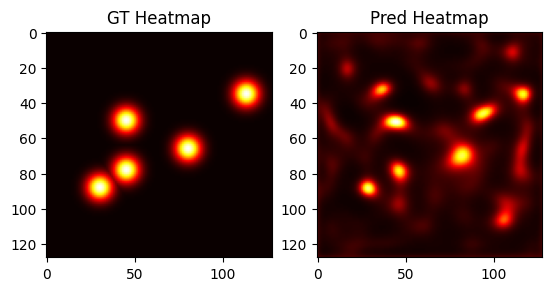


Validation loss      : 0.7595
Validation mask loss : 0.6871
Validation regr loss : 0.0724
Precision:        0.4080
Instance Recall:  0.4587
F1 Score:         0.4319
Normal Region FP: 0.04678362573099415
FROC Score:       0.4659
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 5 epoch(s)

Epoch 27/100


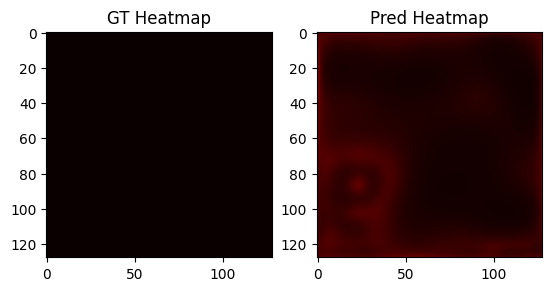


Epoch 27 completed in 227.52 seconds.
Train loss : 0.4909
GT mask loss : 0.3321
GT regr loss : 0.1588

Validation loss      : 0.8441
Validation mask loss : 0.7720
Validation regr loss : 0.0720
Precision:        0.4035
Instance Recall:  0.4835
F1 Score:         0.4399
Normal Region FP: 0.050292397660818715
FROC Score:       0.4892
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 6 epoch(s)

Epoch 28/100

Epoch 28 completed in 227.52 seconds.
Train loss : 0.5062
GT mask loss : 0.3447
GT regr loss : 0.1615

Validation loss      : 0.7343
Validation mask loss : 0.6625
Validation regr loss : 0.0718
Precision:        0.4241
Instance Recall:  0.4839
F1 Score:         0.4520
Normal Region FP: 0.04093567251461988
FROC Score:       0.4925
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 7 epoch(s)

Epoch 29/100


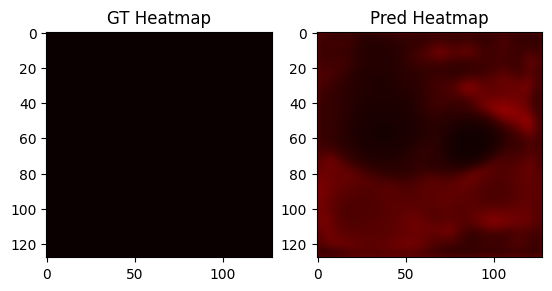


Epoch 29 completed in 226.85 seconds.
Train loss : 0.4933
GT mask loss : 0.3353
GT regr loss : 0.1580

Validation loss      : 0.7468
Validation mask loss : 0.6740
Validation regr loss : 0.0728
Precision:        0.4105
Instance Recall:  0.4627
F1 Score:         0.4350
Normal Region FP: 0.03859649122807018
FROC Score:       0.4694
Current Learning Rate: 1e-07
No improvement in F1 Score for 8 epoch(s)

Epoch 30/100

Epoch 30 completed in 226.87 seconds.
Train loss : 0.4855
GT mask loss : 0.3275
GT regr loss : 0.1580

Validation loss      : 0.6883
Validation mask loss : 0.6161
Validation regr loss : 0.0721
Precision:        0.4271
Instance Recall:  0.4645
F1 Score:         0.4450
Normal Region FP: 0.03391812865497076
FROC Score:       0.4762
Current Learning Rate: 1e-07
No improvement in F1 Score for 9 epoch(s)

Epoch 31/100


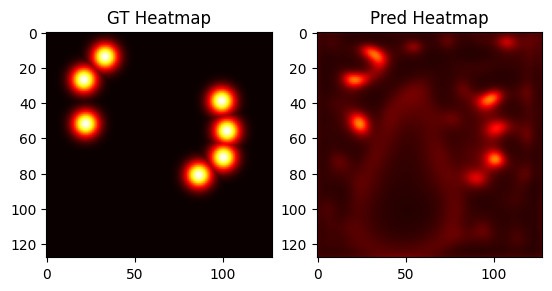


Epoch 31 completed in 227.21 seconds.
Train loss : 0.4870
GT mask loss : 0.3285
GT regr loss : 0.1584


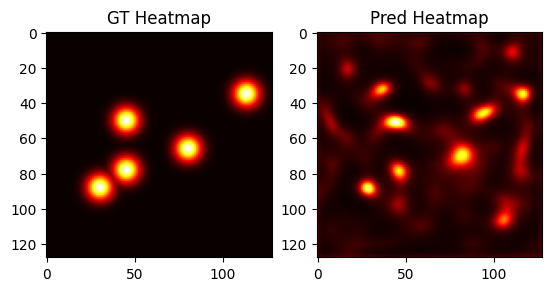


Validation loss      : 0.7236
Validation mask loss : 0.6508
Validation regr loss : 0.0728
Precision:        0.4104
Instance Recall:  0.4562
F1 Score:         0.4321
Normal Region FP: 0.04327485380116959
FROC Score:       0.4648
Current Learning Rate: 1e-07
No improvement in F1 Score for 10 epoch(s)
Early stopping triggered after 10 epochs without improvement.
Early stopping at epoch 31


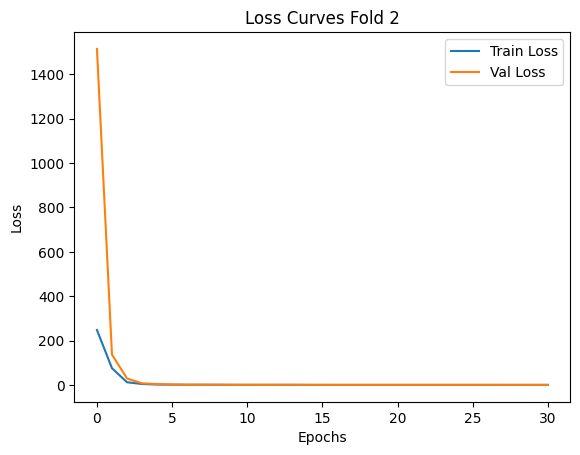


 Test Result
Precision: 0.4291
Instance Recall: 0.4387
F1 Score:  0.4338
FPs:       99.9397
FROC Score: 0.4421
Saved results to: /content/drive/MyDrive/Dissertation_Chatwipa/model_checkpoint/student_pseudolabel/adamw18_checkpoints_20250722_105039/fold2/test_results.csv
==== Test Fold: fold3, Val Fold: fold4, Train Folds: ['fold1', 'fold2'] ====

Epoch 1/100


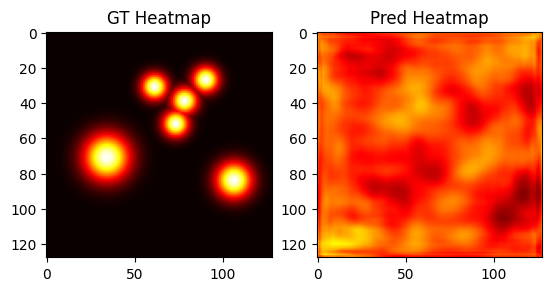


Epoch 1 completed in 234.71 seconds.
Train loss : 121.7548
GT mask loss : 115.0611
GT regr loss : 6.6937


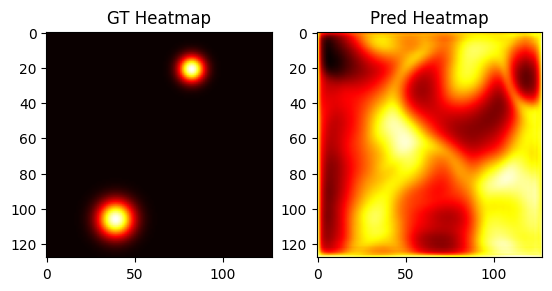


Validation loss      : 1038.1448
Validation mask loss : 1037.8952
Validation regr loss : 0.2496
Precision:        0.0029
Instance Recall:  0.0148
F1 Score:         0.0048
Normal Region FP: 41.86997635933806
FROC Score:       0.0038
Current Learning Rate: 5e-05
F1 Score improved from -inf to 0.0048

Epoch 2/100

Epoch 2 completed in 235.41 seconds.
Train loss : 24.7282
GT mask loss : 22.8232
GT regr loss : 1.9050

Validation loss      : 74.8501
Validation mask loss : 74.6799
Validation regr loss : 0.1702
Precision:        0.0000
Instance Recall:  0.0000
F1 Score:         0.0000
Normal Region FP: 2.16193853427896
FROC Score:       0.0007
Current Learning Rate: 5e-05
No improvement in F1 Score for 1 epoch(s)

Epoch 3/100


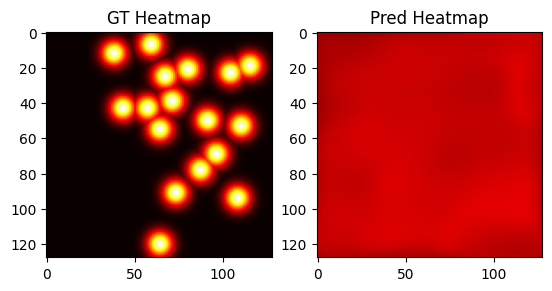


Epoch 3 completed in 233.86 seconds.
Train loss : 6.1742
GT mask loss : 5.5448
GT regr loss : 0.6294

Validation loss      : 16.3106
Validation mask loss : 16.2145
Validation regr loss : 0.0961
Precision:        0.0000
Instance Recall:  0.0000
F1 Score:         0.0000
Normal Region FP: 0.0
FROC Score:       0.0000
Current Learning Rate: 5e-05
No improvement in F1 Score for 2 epoch(s)

Epoch 4/100

Epoch 4 completed in 234.34 seconds.
Train loss : 2.3636
GT mask loss : 1.9319
GT regr loss : 0.4318

Validation loss      : 5.5810
Validation mask loss : 5.4941
Validation regr loss : 0.0869
Precision:        0.0000
Instance Recall:  0.0000
F1 Score:         0.0000
Normal Region FP: 0.0070921985815602835
FROC Score:       0.0000
Current Learning Rate: 5e-05
No improvement in F1 Score for 3 epoch(s)

Epoch 5/100


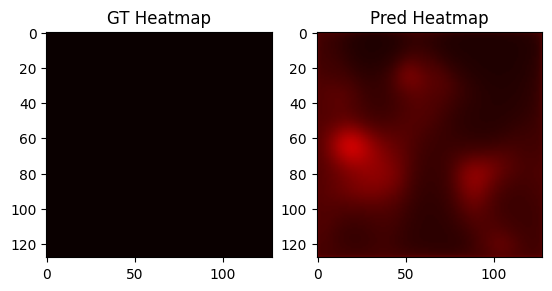


Epoch 5 completed in 234.28 seconds.
Train loss : 1.7025
GT mask loss : 1.3612
GT regr loss : 0.3413

Validation loss      : 2.7154
Validation mask loss : 2.6293
Validation regr loss : 0.0861
Precision:        0.0064
Instance Recall:  0.0012
F1 Score:         0.0021
Normal Region FP: 0.004728132387706856
FROC Score:       0.0012
Current Learning Rate: 5e-05
No improvement in F1 Score for 4 epoch(s)

Epoch 6/100

Epoch 6 completed in 233.72 seconds.
Train loss : 1.3299
GT mask loss : 1.0482
GT regr loss : 0.2817


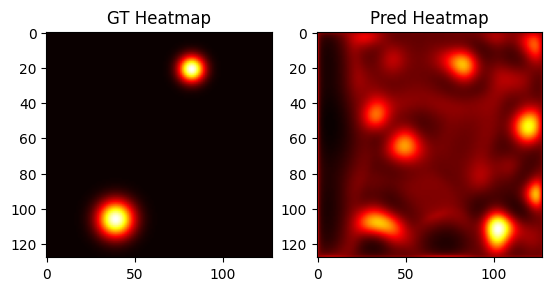


Validation loss      : 1.6774
Validation mask loss : 1.5947
Validation regr loss : 0.0827
Precision:        0.0029
Instance Recall:  0.0010
F1 Score:         0.0015
Normal Region FP: 0.01773049645390071
FROC Score:       0.0012
Current Learning Rate: 5e-05
No improvement in F1 Score for 5 epoch(s)

Epoch 7/100


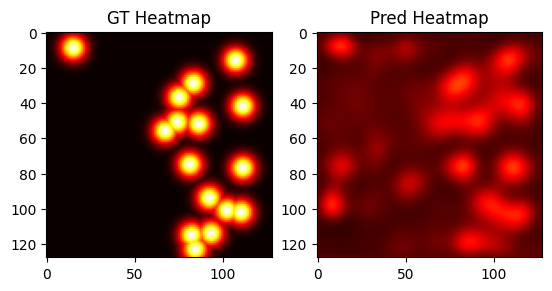


Epoch 7 completed in 234.39 seconds.
Train loss : 1.3285
GT mask loss : 1.0740
GT regr loss : 0.2544

Validation loss      : 1.3500
Validation mask loss : 1.2645
Validation regr loss : 0.0854
Precision:        0.0231
Instance Recall:  0.0012
F1 Score:         0.0023
Normal Region FP: 0.002364066193853428
FROC Score:       0.0015
Current Learning Rate: 5e-05
No improvement in F1 Score for 6 epoch(s)

Epoch 8/100

Epoch 8 completed in 233.70 seconds.
Train loss : 1.0794
GT mask loss : 0.8450
GT regr loss : 0.2344

Validation loss      : 1.6536
Validation mask loss : 1.5731
Validation regr loss : 0.0805
Precision:        0.0204
Instance Recall:  0.0156
F1 Score:         0.0177
Normal Region FP: 0.08156028368794327
FROC Score:       0.0157
Current Learning Rate: 5e-05
F1 Score improved from 0.0048 to 0.0177

Epoch 9/100


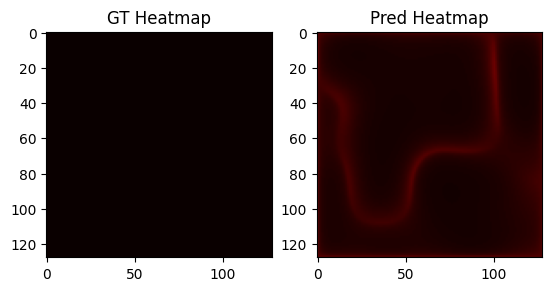


Epoch 9 completed in 237.50 seconds.
Train loss : 0.9599
GT mask loss : 0.7425
GT regr loss : 0.2174

Validation loss      : 2.2050
Validation mask loss : 2.1261
Validation regr loss : 0.0789
Precision:        0.1478
Instance Recall:  0.1707
F1 Score:         0.1584
Normal Region FP: 0.14420803782505912
FROC Score:       0.1707
Current Learning Rate: 5e-05
F1 Score improved from 0.0177 to 0.1584

Epoch 10/100

Epoch 10 completed in 237.51 seconds.
Train loss : 0.8377
GT mask loss : 0.6292
GT regr loss : 0.2085

Validation loss      : 1.0025
Validation mask loss : 0.9224
Validation regr loss : 0.0801
Precision:        0.0728
Instance Recall:  0.0599
F1 Score:         0.0657
Normal Region FP: 0.03309692671394799
FROC Score:       0.0599
Current Learning Rate: 5e-05
No improvement in F1 Score for 1 epoch(s)

Epoch 11/100


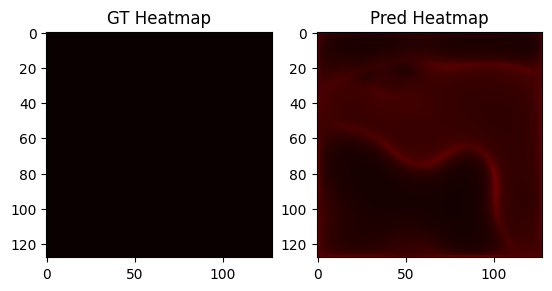


Epoch 11 completed in 233.50 seconds.
Train loss : 0.8100
GT mask loss : 0.6124
GT regr loss : 0.1976


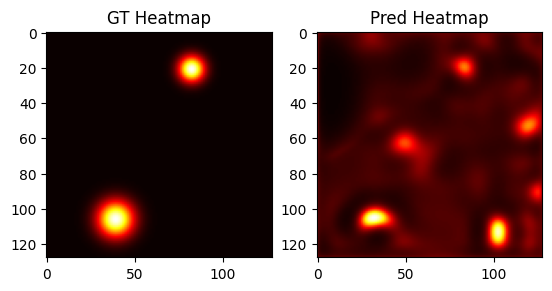


Validation loss      : 1.2036
Validation mask loss : 1.1246
Validation regr loss : 0.0791
Precision:        0.1455
Instance Recall:  0.1494
F1 Score:         0.1474
Normal Region FP: 0.06382978723404255
FROC Score:       0.1494
Current Learning Rate: 5e-05
No improvement in F1 Score for 2 epoch(s)

Epoch 12/100

Epoch 12 completed in 233.57 seconds.
Train loss : 0.7126
GT mask loss : 0.5292
GT regr loss : 0.1833

Validation loss      : 1.5500
Validation mask loss : 1.4738
Validation regr loss : 0.0763
Precision:        0.2119
Instance Recall:  0.2532
F1 Score:         0.2307
Normal Region FP: 0.1182033096926714
FROC Score:       0.2532
Current Learning Rate: 5e-05
F1 Score improved from 0.1584 to 0.2307

Epoch 13/100


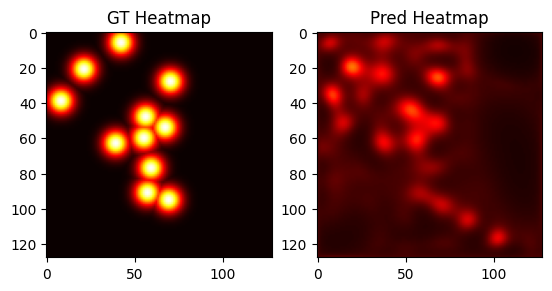


Epoch 13 completed in 238.53 seconds.
Train loss : 0.6621
GT mask loss : 0.4823
GT regr loss : 0.1798

Validation loss      : 0.9909
Validation mask loss : 0.9146
Validation regr loss : 0.0764
Precision:        0.2508
Instance Recall:  0.2456
F1 Score:         0.2482
Normal Region FP: 0.05319148936170213
FROC Score:       0.2456
Current Learning Rate: 5e-05
F1 Score improved from 0.2307 to 0.2482

Epoch 14/100

Epoch 14 completed in 237.79 seconds.
Train loss : 0.6232
GT mask loss : 0.4560
GT regr loss : 0.1672

Validation loss      : 0.8305
Validation mask loss : 0.7528
Validation regr loss : 0.0777
Precision:        0.3190
Instance Recall:  0.2879
F1 Score:         0.3026
Normal Region FP: 0.026004728132387706
FROC Score:       0.2887
Current Learning Rate: 5e-05
F1 Score improved from 0.2482 to 0.3026

Epoch 15/100


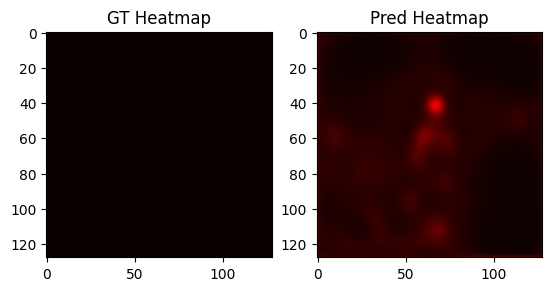


Epoch 15 completed in 237.82 seconds.
Train loss : 0.6333
GT mask loss : 0.4686
GT regr loss : 0.1647

Validation loss      : 1.0218
Validation mask loss : 0.9498
Validation regr loss : 0.0720
Precision:        0.2931
Instance Recall:  0.2915
F1 Score:         0.2923
Normal Region FP: 0.08274231678486997
FROC Score:       0.2931
Current Learning Rate: 5e-05
No improvement in F1 Score for 1 epoch(s)

Epoch 16/100

Epoch 16 completed in 233.34 seconds.
Train loss : 0.5580
GT mask loss : 0.4037
GT regr loss : 0.1543


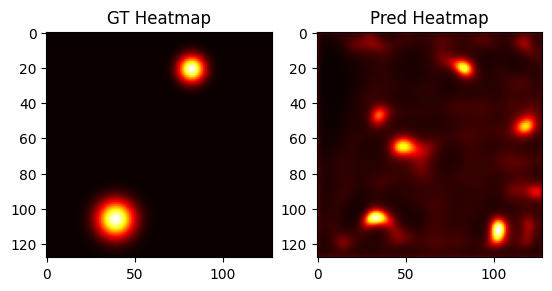


Validation loss      : 1.7338
Validation mask loss : 1.6627
Validation regr loss : 0.0711
Precision:        0.3331
Instance Recall:  0.4454
F1 Score:         0.3812
Normal Region FP: 0.11229314420803782
FROC Score:       0.4468
Current Learning Rate: 5e-05
F1 Score improved from 0.3026 to 0.3812

Epoch 17/100


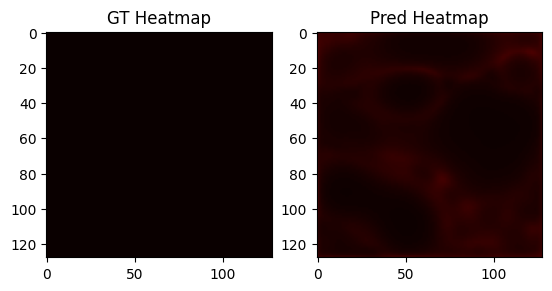


Epoch 17 completed in 238.34 seconds.
Train loss : 0.5447
GT mask loss : 0.3945
GT regr loss : 0.1502

Validation loss      : 0.9933
Validation mask loss : 0.9189
Validation regr loss : 0.0744
Precision:        0.4054
Instance Recall:  0.3746
F1 Score:         0.3894
Normal Region FP: 0.03664302600472813
FROC Score:       0.3809
Current Learning Rate: 5e-05
F1 Score improved from 0.3812 to 0.3894

Epoch 18/100

Epoch 18 completed in 239.22 seconds.
Train loss : 0.4951
GT mask loss : 0.3494
GT regr loss : 0.1457

Validation loss      : 1.2374
Validation mask loss : 1.1607
Validation regr loss : 0.0767
Precision:        0.4117
Instance Recall:  0.4440
F1 Score:         0.4272
Normal Region FP: 0.06501182033096926
FROC Score:       0.4495
Current Learning Rate: 5e-05
F1 Score improved from 0.3894 to 0.4272

Epoch 19/100


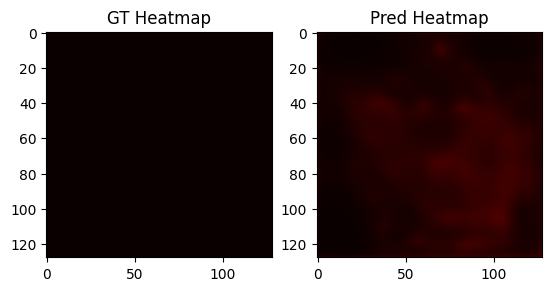


Epoch 19 completed in 238.54 seconds.
Train loss : 0.4683
GT mask loss : 0.3276
GT regr loss : 0.1406

Validation loss      : 1.0680
Validation mask loss : 0.9944
Validation regr loss : 0.0736
Precision:        0.4614
Instance Recall:  0.4858
F1 Score:         0.4733
Normal Region FP: 0.04964539007092199
FROC Score:       0.4964
Current Learning Rate: 5e-05
F1 Score improved from 0.4272 to 0.4733

Epoch 20/100

Epoch 20 completed in 237.81 seconds.
Train loss : 0.4695
GT mask loss : 0.3315
GT regr loss : 0.1379

Validation loss      : 1.2590
Validation mask loss : 1.1867
Validation regr loss : 0.0723
Precision:        0.4164
Instance Recall:  0.4844
F1 Score:         0.4478
Normal Region FP: 0.061465721040189124
FROC Score:       0.4902
Current Learning Rate: 2.5e-06
No improvement in F1 Score for 1 epoch(s)

Epoch 21/100


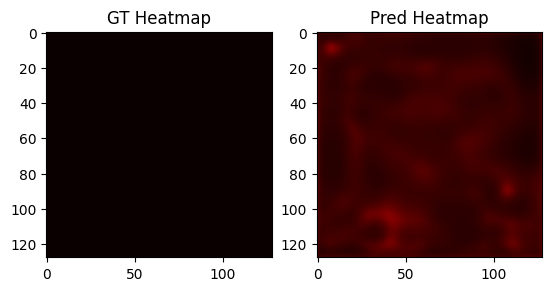


Epoch 21 completed in 233.98 seconds.
Train loss : 0.4259
GT mask loss : 0.2976
GT regr loss : 0.1283


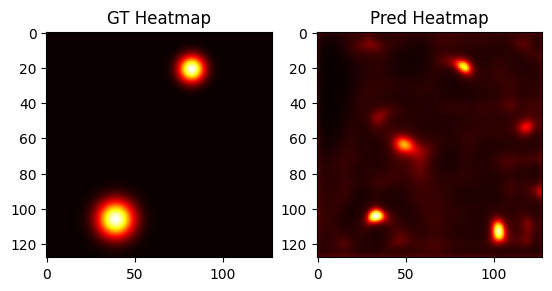


Validation loss      : 1.2264
Validation mask loss : 1.1552
Validation regr loss : 0.0712
Precision:        0.4396
Instance Recall:  0.4768
F1 Score:         0.4574
Normal Region FP: 0.06382978723404255
FROC Score:       0.4876
Current Learning Rate: 2.5e-06
No improvement in F1 Score for 2 epoch(s)

Epoch 22/100

Epoch 22 completed in 233.80 seconds.
Train loss : 0.3945
GT mask loss : 0.2655
GT regr loss : 0.1290

Validation loss      : 1.3491
Validation mask loss : 1.2786
Validation regr loss : 0.0705
Precision:        0.4343
Instance Recall:  0.4979
F1 Score:         0.4640
Normal Region FP: 0.06619385342789598
FROC Score:       0.5091
Current Learning Rate: 2.5e-06
No improvement in F1 Score for 3 epoch(s)

Epoch 23/100


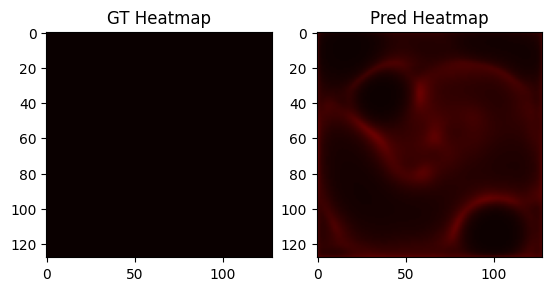


Epoch 23 completed in 233.62 seconds.
Train loss : 0.3880
GT mask loss : 0.2598
GT regr loss : 0.1282

Validation loss      : 1.2025
Validation mask loss : 1.1317
Validation regr loss : 0.0708
Precision:        0.4497
Instance Recall:  0.4620
F1 Score:         0.4558
Normal Region FP: 0.0425531914893617
FROC Score:       0.4793
Current Learning Rate: 2.5e-06
No improvement in F1 Score for 4 epoch(s)

Epoch 24/100

Epoch 24 completed in 233.62 seconds.
Train loss : 0.3926
GT mask loss : 0.2651
GT regr loss : 0.1274

Validation loss      : 1.3274
Validation mask loss : 1.2572
Validation regr loss : 0.0702
Precision:        0.4550
Instance Recall:  0.5047
F1 Score:         0.4786
Normal Region FP: 0.06264775413711583
FROC Score:       0.5203
Current Learning Rate: 2.5e-06
F1 Score improved from 0.4733 to 0.4786

Epoch 25/100


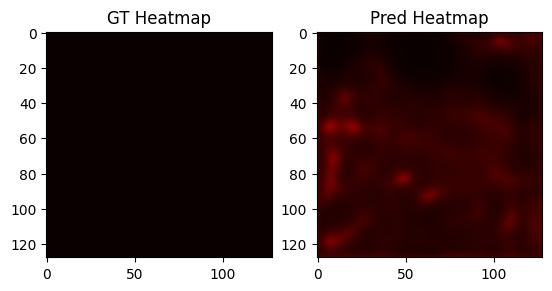


Epoch 25 completed in 237.96 seconds.
Train loss : 0.3870
GT mask loss : 0.2599
GT regr loss : 0.1271

Validation loss      : 1.1540
Validation mask loss : 1.0826
Validation regr loss : 0.0714
Precision:        0.4653
Instance Recall:  0.4842
F1 Score:         0.4746
Normal Region FP: 0.04491725768321513
FROC Score:       0.5026
Current Learning Rate: 2.5e-06
No improvement in F1 Score for 1 epoch(s)

Epoch 26/100

Epoch 26 completed in 233.86 seconds.
Train loss : 0.3705
GT mask loss : 0.2460
GT regr loss : 0.1246


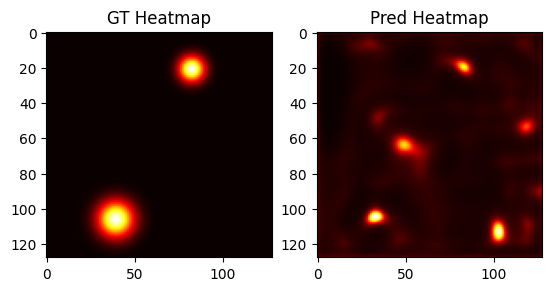


Validation loss      : 1.5550
Validation mask loss : 1.4844
Validation regr loss : 0.0706
Precision:        0.4521
Instance Recall:  0.5115
F1 Score:         0.4800
Normal Region FP: 0.06264775413711583
FROC Score:       0.5258
Current Learning Rate: 1.2500000000000002e-07
F1 Score improved from 0.4786 to 0.4800

Epoch 27/100


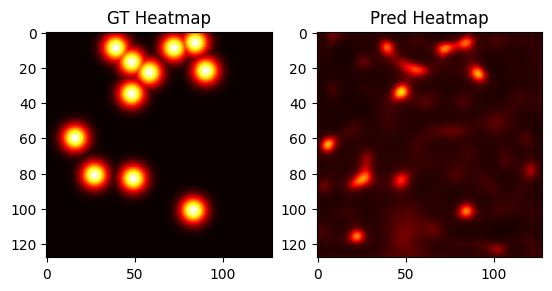


Epoch 27 completed in 238.11 seconds.
Train loss : 0.3694
GT mask loss : 0.2434
GT regr loss : 0.1260

Validation loss      : 1.3230
Validation mask loss : 1.2522
Validation regr loss : 0.0709
Precision:        0.4620
Instance Recall:  0.4889
F1 Score:         0.4751
Normal Region FP: 0.041371158392434985
FROC Score:       0.5064
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 1 epoch(s)

Epoch 28/100

Epoch 28 completed in 233.68 seconds.
Train loss : 0.3709
GT mask loss : 0.2458
GT regr loss : 0.1251

Validation loss      : 1.4488
Validation mask loss : 1.3786
Validation regr loss : 0.0702
Precision:        0.4501
Instance Recall:  0.5205
F1 Score:         0.4828
Normal Region FP: 0.08037825059101655
FROC Score:       0.5353
Current Learning Rate: 1.2500000000000002e-07
F1 Score improved from 0.4800 to 0.4828

Epoch 29/100


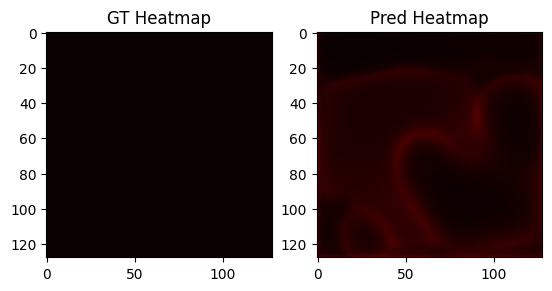


Epoch 29 completed in 237.52 seconds.
Train loss : 0.3731
GT mask loss : 0.2477
GT regr loss : 0.1253

Validation loss      : 1.3336
Validation mask loss : 1.2634
Validation regr loss : 0.0702
Precision:        0.4590
Instance Recall:  0.5025
F1 Score:         0.4798
Normal Region FP: 0.061465721040189124
FROC Score:       0.5212
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 1 epoch(s)

Epoch 30/100

Epoch 30 completed in 233.63 seconds.
Train loss : 0.3809
GT mask loss : 0.2528
GT regr loss : 0.1281

Validation loss      : 1.2228
Validation mask loss : 1.1520
Validation regr loss : 0.0708
Precision:        0.4603
Instance Recall:  0.4875
F1 Score:         0.4735
Normal Region FP: 0.0425531914893617
FROC Score:       0.5030
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 2 epoch(s)

Epoch 31/100


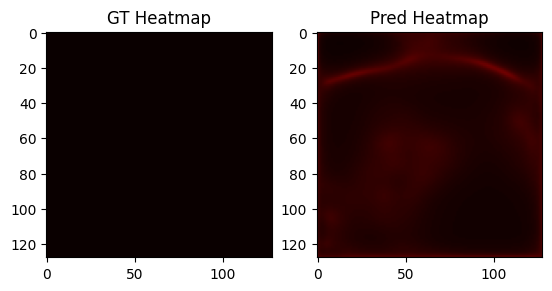


Epoch 31 completed in 233.47 seconds.
Train loss : 0.3661
GT mask loss : 0.2422
GT regr loss : 0.1239


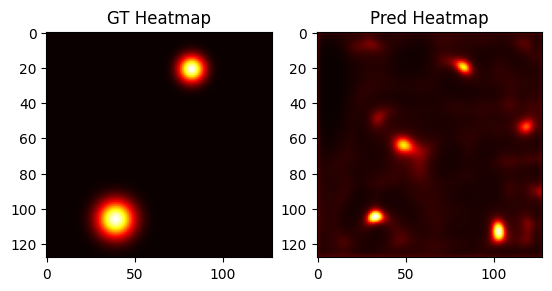


Validation loss      : 1.2690
Validation mask loss : 1.1986
Validation regr loss : 0.0704
Precision:        0.4571
Instance Recall:  0.4916
F1 Score:         0.4737
Normal Region FP: 0.0508274231678487
FROC Score:       0.5085
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 3 epoch(s)

Epoch 32/100

Epoch 32 completed in 233.66 seconds.
Train loss : 0.3584
GT mask loss : 0.2354
GT regr loss : 0.1229

Validation loss      : 1.2217
Validation mask loss : 1.1514
Validation regr loss : 0.0703
Precision:        0.4601
Instance Recall:  0.4982
F1 Score:         0.4784
Normal Region FP: 0.05555555555555555
FROC Score:       0.5154
Current Learning Rate: 1e-07
No improvement in F1 Score for 4 epoch(s)

Epoch 33/100


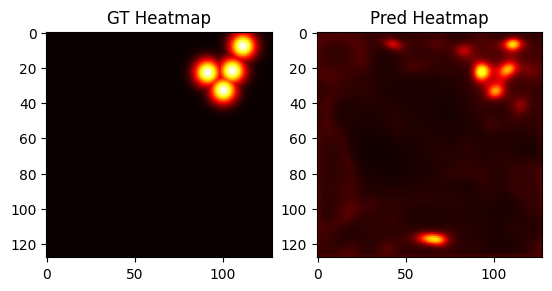


Epoch 33 completed in 233.63 seconds.
Train loss : 0.3709
GT mask loss : 0.2472
GT regr loss : 0.1237

Validation loss      : 1.4109
Validation mask loss : 1.3406
Validation regr loss : 0.0702
Precision:        0.4554
Instance Recall:  0.5111
F1 Score:         0.4816
Normal Region FP: 0.06382978723404255
FROC Score:       0.5272
Current Learning Rate: 1e-07
No improvement in F1 Score for 5 epoch(s)

Epoch 34/100

Epoch 34 completed in 233.68 seconds.
Train loss : 0.3696
GT mask loss : 0.2440
GT regr loss : 0.1255

Validation loss      : 1.3058
Validation mask loss : 1.2346
Validation regr loss : 0.0712
Precision:        0.4439
Instance Recall:  0.4858
F1 Score:         0.4639
Normal Region FP: 0.041371158392434985
FROC Score:       0.4969
Current Learning Rate: 1e-07
No improvement in F1 Score for 6 epoch(s)

Epoch 35/100


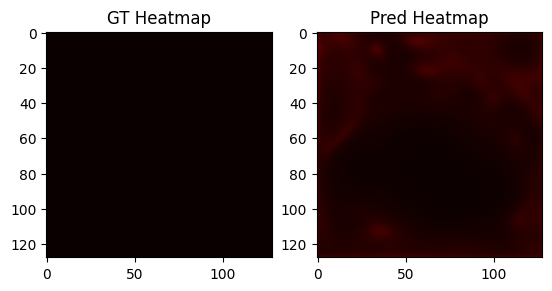


Epoch 35 completed in 233.92 seconds.
Train loss : 0.3601
GT mask loss : 0.2352
GT regr loss : 0.1249

Validation loss      : 1.2290
Validation mask loss : 1.1583
Validation regr loss : 0.0706
Precision:        0.4591
Instance Recall:  0.4863
F1 Score:         0.4723
Normal Region FP: 0.04609929078014184
FROC Score:       0.5032
Current Learning Rate: 1e-07
No improvement in F1 Score for 7 epoch(s)

Epoch 36/100

Epoch 36 completed in 234.03 seconds.
Train loss : 0.3801
GT mask loss : 0.2554
GT regr loss : 0.1247


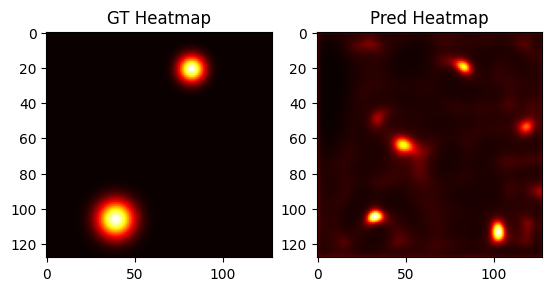


Validation loss      : 1.4600
Validation mask loss : 1.3897
Validation regr loss : 0.0703
Precision:        0.4485
Instance Recall:  0.5115
F1 Score:         0.4779
Normal Region FP: 0.06855791962174941
FROC Score:       0.5253
Current Learning Rate: 1e-07
No improvement in F1 Score for 8 epoch(s)

Epoch 37/100


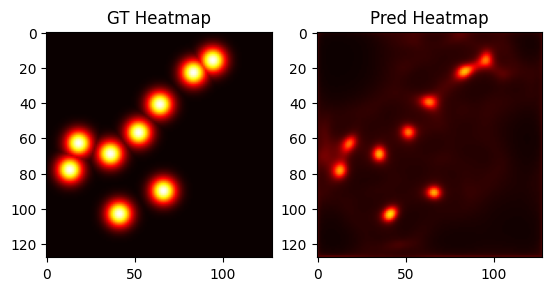


Epoch 37 completed in 233.76 seconds.
Train loss : 0.3733
GT mask loss : 0.2480
GT regr loss : 0.1253

Validation loss      : 1.1903
Validation mask loss : 1.1197
Validation regr loss : 0.0706
Precision:        0.4655
Instance Recall:  0.4840
F1 Score:         0.4746
Normal Region FP: 0.04491725768321513
FROC Score:       0.5015
Current Learning Rate: 1e-07
No improvement in F1 Score for 9 epoch(s)

Epoch 38/100

Epoch 38 completed in 233.60 seconds.
Train loss : 0.3674
GT mask loss : 0.2448
GT regr loss : 0.1226

Validation loss      : 1.2682
Validation mask loss : 1.1976
Validation regr loss : 0.0706
Precision:        0.4590
Instance Recall:  0.4969
F1 Score:         0.4772
Normal Region FP: 0.0508274231678487
FROC Score:       0.5134
Current Learning Rate: 1e-07
No improvement in F1 Score for 10 epoch(s)
Early stopping triggered after 10 epochs without improvement.
Early stopping at epoch 38


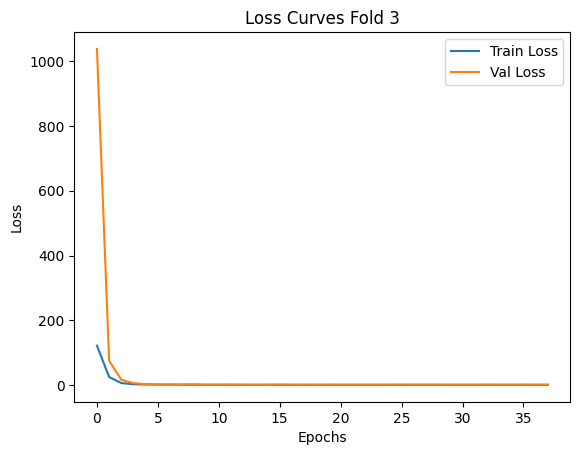


 Test Result
Precision: 0.4836
Instance Recall: 0.6284
F1 Score:  0.5466
FPs:       99.9076
FROC Score: 0.6490
Saved results to: /content/drive/MyDrive/Dissertation_Chatwipa/model_checkpoint/student_pseudolabel/adamw18_checkpoints_20250722_105039/fold3/test_results.csv
==== Test Fold: fold4, Val Fold: fold1, Train Folds: ['fold2', 'fold3'] ====

Epoch 1/100


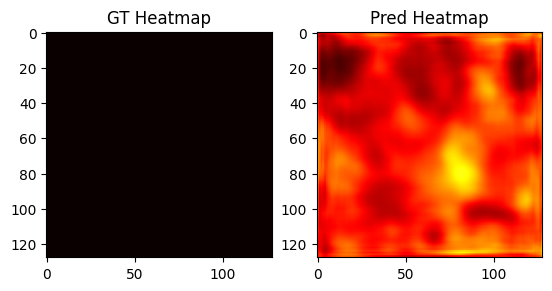


Epoch 1 completed in 225.42 seconds.
Train loss : 237.5542
GT mask loss : 229.7534
GT regr loss : 7.8009


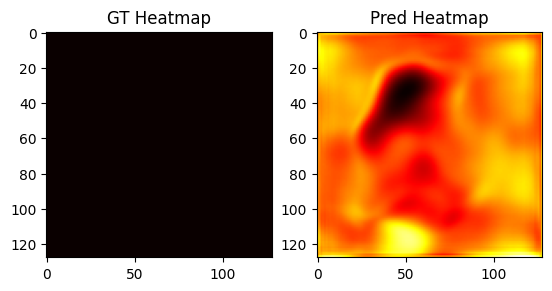


Validation loss      : 881.6201
Validation mask loss : 881.1812
Validation regr loss : 0.4389
Precision:        0.0010
Instance Recall:  0.0076
F1 Score:         0.0018
Normal Region FP: 51.02807017543859
FROC Score:       0.0017
Current Learning Rate: 5e-05
F1 Score improved from -inf to 0.0018

Epoch 2/100

Epoch 2 completed in 225.17 seconds.
Train loss : 43.0852
GT mask loss : 40.2588
GT regr loss : 2.8263

Validation loss      : 93.2135
Validation mask loss : 93.1016
Validation regr loss : 0.1119
Precision:        0.0000
Instance Recall:  0.0000
F1 Score:         0.0000
Normal Region FP: 4.301754385964912
FROC Score:       0.0005
Current Learning Rate: 5e-05
No improvement in F1 Score for 1 epoch(s)

Epoch 3/100


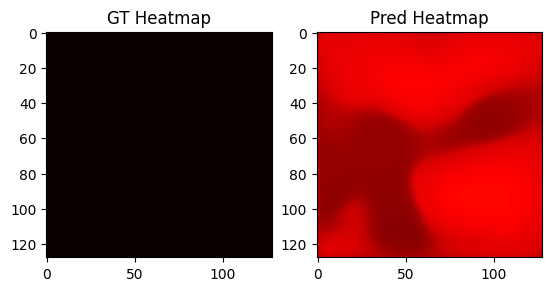


Epoch 3 completed in 225.04 seconds.
Train loss : 8.3774
GT mask loss : 7.6198
GT regr loss : 0.7576

Validation loss      : 23.7612
Validation mask loss : 23.6401
Validation regr loss : 0.1212
Precision:        0.0000
Instance Recall:  0.0000
F1 Score:         0.0000
Normal Region FP: 0.0
FROC Score:       0.0000
Current Learning Rate: 5e-05
No improvement in F1 Score for 2 epoch(s)

Epoch 4/100

Epoch 4 completed in 224.19 seconds.
Train loss : 3.3501
GT mask loss : 2.8538
GT regr loss : 0.4963

Validation loss      : 6.3124
Validation mask loss : 6.2139
Validation regr loss : 0.0985
Precision:        0.0017
Instance Recall:  0.0002
F1 Score:         0.0003
Normal Region FP: 0.0011695906432748538
FROC Score:       0.0011
Current Learning Rate: 5e-05
No improvement in F1 Score for 3 epoch(s)

Epoch 5/100


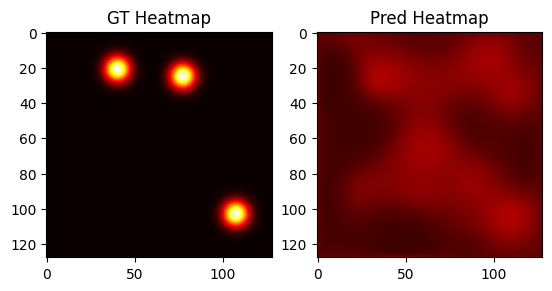


Epoch 5 completed in 225.51 seconds.
Train loss : 2.0102
GT mask loss : 1.6649
GT regr loss : 0.3454

Validation loss      : 2.7760
Validation mask loss : 2.6828
Validation regr loss : 0.0932
Precision:        0.0000
Instance Recall:  0.0000
F1 Score:         0.0000
Normal Region FP: 0.0
FROC Score:       0.0002
Current Learning Rate: 5e-05
No improvement in F1 Score for 4 epoch(s)

Epoch 6/100

Epoch 6 completed in 225.41 seconds.
Train loss : 1.5918
GT mask loss : 1.2999
GT regr loss : 0.2919


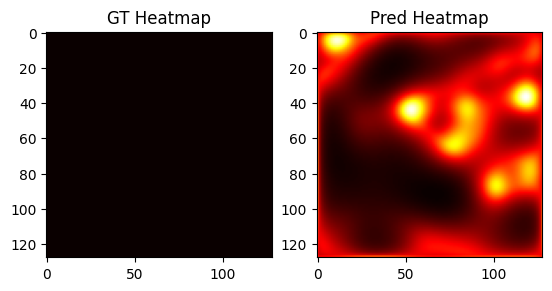


Validation loss      : 1.8974
Validation mask loss : 1.8061
Validation regr loss : 0.0914
Precision:        0.0300
Instance Recall:  0.0180
F1 Score:         0.0225
Normal Region FP: 0.025730994152046785
FROC Score:       0.0189
Current Learning Rate: 5e-05
F1 Score improved from 0.0018 to 0.0225

Epoch 7/100


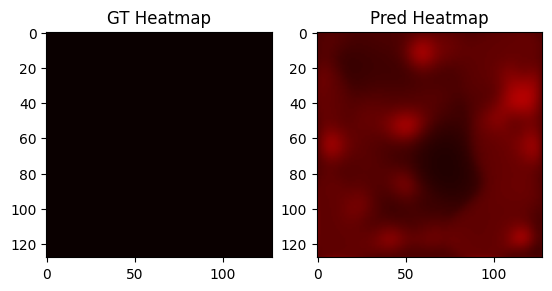


Epoch 7 completed in 232.21 seconds.
Train loss : 1.3402
GT mask loss : 1.0764
GT regr loss : 0.2638

Validation loss      : 1.6399
Validation mask loss : 1.5509
Validation regr loss : 0.0890
Precision:        0.0198
Instance Recall:  0.0146
F1 Score:         0.0168
Normal Region FP: 0.03976608187134503
FROC Score:       0.0147
Current Learning Rate: 5e-05
No improvement in F1 Score for 1 epoch(s)

Epoch 8/100

Epoch 8 completed in 224.20 seconds.
Train loss : 1.1993
GT mask loss : 0.9569
GT regr loss : 0.2424

Validation loss      : 0.9510
Validation mask loss : 0.8583
Validation regr loss : 0.0927
Precision:        0.0401
Instance Recall:  0.0206
F1 Score:         0.0273
Normal Region FP: 0.007017543859649123
FROC Score:       0.0206
Current Learning Rate: 5e-05
F1 Score improved from 0.0225 to 0.0273

Epoch 9/100


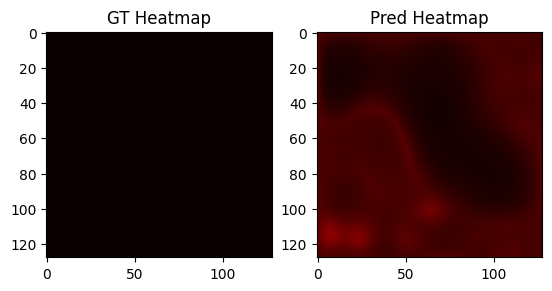


Epoch 9 completed in 229.33 seconds.
Train loss : 1.0655
GT mask loss : 0.8471
GT regr loss : 0.2184

Validation loss      : 1.1208
Validation mask loss : 1.0306
Validation regr loss : 0.0902
Precision:        0.0248
Instance Recall:  0.0189
F1 Score:         0.0215
Normal Region FP: 0.03391812865497076
FROC Score:       0.0189
Current Learning Rate: 5e-05
No improvement in F1 Score for 1 epoch(s)

Epoch 10/100

Epoch 10 completed in 224.50 seconds.
Train loss : 0.9564
GT mask loss : 0.7496
GT regr loss : 0.2068

Validation loss      : 0.8823
Validation mask loss : 0.7933
Validation regr loss : 0.0890
Precision:        0.1181
Instance Recall:  0.1069
F1 Score:         0.1122
Normal Region FP: 0.03274853801169591
FROC Score:       0.1069
Current Learning Rate: 5e-05
F1 Score improved from 0.0273 to 0.1122

Epoch 11/100


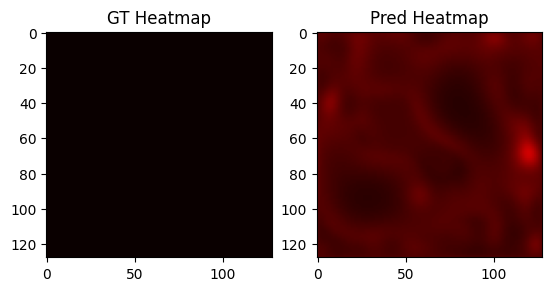


Epoch 11 completed in 228.81 seconds.
Train loss : 0.8668
GT mask loss : 0.6713
GT regr loss : 0.1955


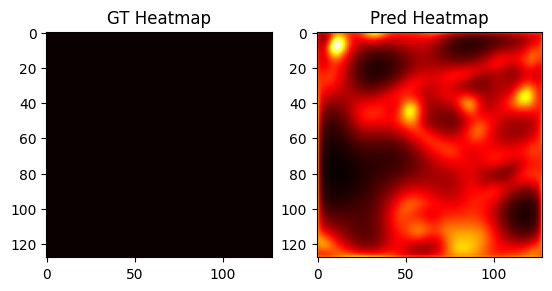


Validation loss      : 0.8444
Validation mask loss : 0.7559
Validation regr loss : 0.0885
Precision:        0.0823
Instance Recall:  0.0619
F1 Score:         0.0707
Normal Region FP: 0.016374269005847954
FROC Score:       0.0619
Current Learning Rate: 5e-05
No improvement in F1 Score for 1 epoch(s)

Epoch 12/100

Epoch 12 completed in 224.59 seconds.
Train loss : 0.7869
GT mask loss : 0.6033
GT regr loss : 0.1837

Validation loss      : 0.8814
Validation mask loss : 0.7946
Validation regr loss : 0.0868
Precision:        0.1734
Instance Recall:  0.1603
F1 Score:         0.1666
Normal Region FP: 0.04912280701754386
FROC Score:       0.1604
Current Learning Rate: 5e-05
F1 Score improved from 0.1122 to 0.1666

Epoch 13/100


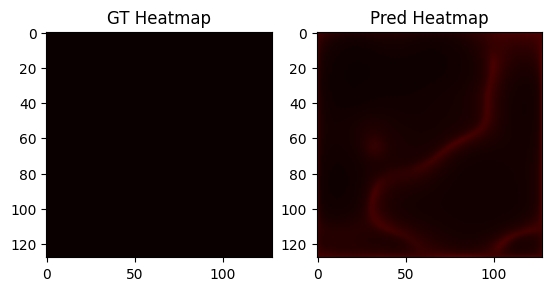


Epoch 13 completed in 229.18 seconds.
Train loss : 0.7524
GT mask loss : 0.5752
GT regr loss : 0.1772

Validation loss      : 0.6964
Validation mask loss : 0.6100
Validation regr loss : 0.0864
Precision:        0.1403
Instance Recall:  0.1063
F1 Score:         0.1210
Normal Region FP: 0.022222222222222223
FROC Score:       0.1064
Current Learning Rate: 5e-05
No improvement in F1 Score for 1 epoch(s)

Epoch 14/100

Epoch 14 completed in 224.63 seconds.
Train loss : 0.6896
GT mask loss : 0.5138
GT regr loss : 0.1757

Validation loss      : 0.8429
Validation mask loss : 0.7617
Validation regr loss : 0.0812
Precision:        0.1999
Instance Recall:  0.2191
F1 Score:         0.2091
Normal Region FP: 0.05964912280701754
FROC Score:       0.2192
Current Learning Rate: 5e-05
F1 Score improved from 0.1666 to 0.2091

Epoch 15/100


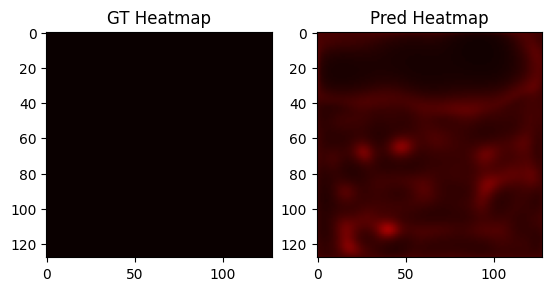


Epoch 15 completed in 229.12 seconds.
Train loss : 0.6312
GT mask loss : 0.4612
GT regr loss : 0.1701

Validation loss      : 0.9173
Validation mask loss : 0.8290
Validation regr loss : 0.0883
Precision:        0.0667
Instance Recall:  0.0713
F1 Score:         0.0689
Normal Region FP: 0.06900584795321638
FROC Score:       0.0713
Current Learning Rate: 5e-05
No improvement in F1 Score for 1 epoch(s)

Epoch 16/100

Epoch 16 completed in 225.26 seconds.
Train loss : 0.6174
GT mask loss : 0.4553
GT regr loss : 0.1621


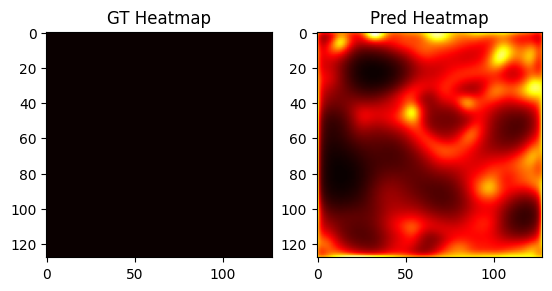


Validation loss      : 0.8310
Validation mask loss : 0.7428
Validation regr loss : 0.0882
Precision:        0.3604
Instance Recall:  0.3355
F1 Score:         0.3475
Normal Region FP: 0.03391812865497076
FROC Score:       0.3355
Current Learning Rate: 5e-05
F1 Score improved from 0.2091 to 0.3475

Epoch 17/100


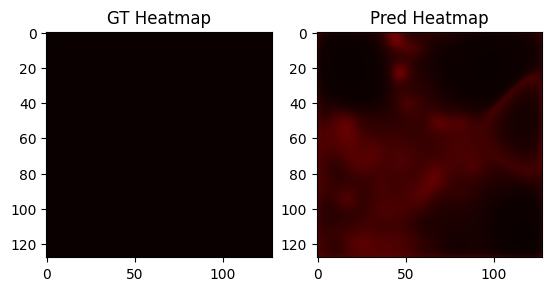


Epoch 17 completed in 229.67 seconds.
Train loss : 0.5402
GT mask loss : 0.3869
GT regr loss : 0.1533

Validation loss      : 0.7470
Validation mask loss : 0.6675
Validation regr loss : 0.0795
Precision:        0.3805
Instance Recall:  0.3522
F1 Score:         0.3658
Normal Region FP: 0.04912280701754386
FROC Score:       0.3559
Current Learning Rate: 5e-05
F1 Score improved from 0.3475 to 0.3658

Epoch 18/100

Epoch 18 completed in 230.27 seconds.
Train loss : 0.5469
GT mask loss : 0.3964
GT regr loss : 0.1505

Validation loss      : 0.7511
Validation mask loss : 0.6711
Validation regr loss : 0.0800
Precision:        0.3848
Instance Recall:  0.3702
F1 Score:         0.3774
Normal Region FP: 0.03742690058479532
FROC Score:       0.3719
Current Learning Rate: 5e-05
F1 Score improved from 0.3658 to 0.3774

Epoch 19/100


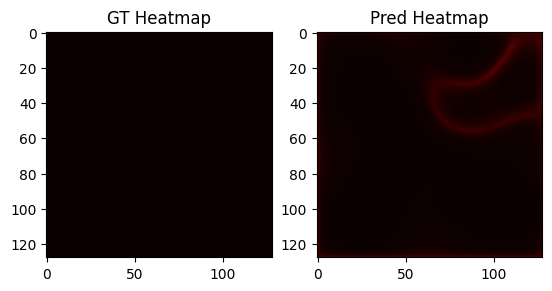


Epoch 19 completed in 230.24 seconds.
Train loss : 0.4729
GT mask loss : 0.3317
GT regr loss : 0.1412

Validation loss      : 0.8164
Validation mask loss : 0.7371
Validation regr loss : 0.0794
Precision:        0.3947
Instance Recall:  0.4310
F1 Score:         0.4120
Normal Region FP: 0.0456140350877193
FROC Score:       0.4333
Current Learning Rate: 2.5e-06
F1 Score improved from 0.3774 to 0.4120

Epoch 20/100

Epoch 20 completed in 229.84 seconds.
Train loss : 0.4401
GT mask loss : 0.3018
GT regr loss : 0.1383

Validation loss      : 0.7407
Validation mask loss : 0.6614
Validation regr loss : 0.0793
Precision:        0.4052
Instance Recall:  0.4139
F1 Score:         0.4095
Normal Region FP: 0.031578947368421054
FROC Score:       0.4162
Current Learning Rate: 2.5e-06
No improvement in F1 Score for 1 epoch(s)

Epoch 21/100


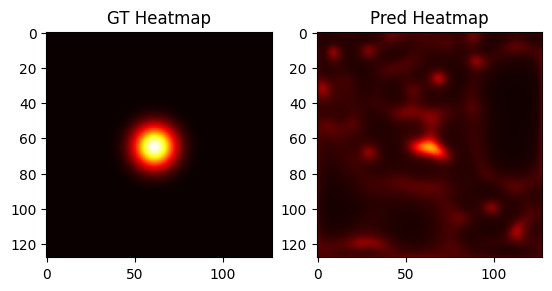


Epoch 21 completed in 224.47 seconds.
Train loss : 0.4222
GT mask loss : 0.2852
GT regr loss : 0.1371


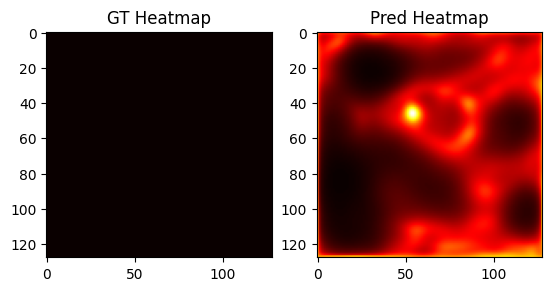


Validation loss      : 0.8244
Validation mask loss : 0.7464
Validation regr loss : 0.0780
Precision:        0.4143
Instance Recall:  0.4526
F1 Score:         0.4326
Normal Region FP: 0.03742690058479532
FROC Score:       0.4558
Current Learning Rate: 2.5e-06
F1 Score improved from 0.4120 to 0.4326

Epoch 22/100

Epoch 22 completed in 227.78 seconds.
Train loss : 0.4072
GT mask loss : 0.2725
GT regr loss : 0.1347

Validation loss      : 0.8002
Validation mask loss : 0.7220
Validation regr loss : 0.0783
Precision:        0.4005
Instance Recall:  0.4285
F1 Score:         0.4140
Normal Region FP: 0.03274853801169591
FROC Score:       0.4310
Current Learning Rate: 2.5e-06
No improvement in F1 Score for 1 epoch(s)

Epoch 23/100


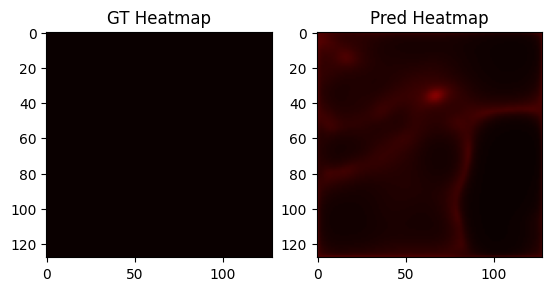


Epoch 23 completed in 224.60 seconds.
Train loss : 0.4070
GT mask loss : 0.2754
GT regr loss : 0.1315

Validation loss      : 0.7837
Validation mask loss : 0.7051
Validation regr loss : 0.0786
Precision:        0.4129
Instance Recall:  0.4329
F1 Score:         0.4227
Normal Region FP: 0.03391812865497076
FROC Score:       0.4354
Current Learning Rate: 2.5e-06
No improvement in F1 Score for 2 epoch(s)

Epoch 24/100

Epoch 24 completed in 224.48 seconds.
Train loss : 0.4095
GT mask loss : 0.2769
GT regr loss : 0.1326

Validation loss      : 0.7384
Validation mask loss : 0.6590
Validation regr loss : 0.0794
Precision:        0.4160
Instance Recall:  0.4110
F1 Score:         0.4135
Normal Region FP: 0.026900584795321637
FROC Score:       0.4139
Current Learning Rate: 2.5e-06
No improvement in F1 Score for 3 epoch(s)

Epoch 25/100


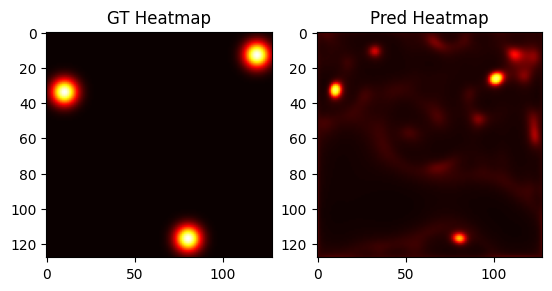


Epoch 25 completed in 224.50 seconds.
Train loss : 0.3931
GT mask loss : 0.2635
GT regr loss : 0.1297

Validation loss      : 0.8086
Validation mask loss : 0.7302
Validation regr loss : 0.0784
Precision:        0.4173
Instance Recall:  0.4287
F1 Score:         0.4229
Normal Region FP: 0.03274853801169591
FROC Score:       0.4309
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 4 epoch(s)

Epoch 26/100

Epoch 26 completed in 223.95 seconds.
Train loss : 0.3935
GT mask loss : 0.2638
GT regr loss : 0.1298


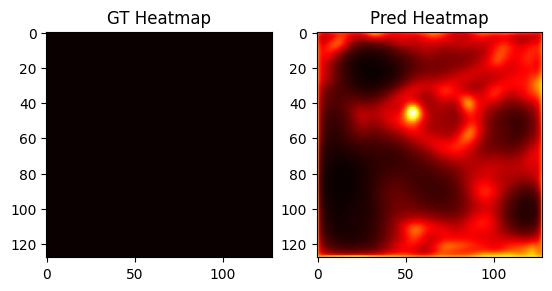


Validation loss      : 0.8220
Validation mask loss : 0.7444
Validation regr loss : 0.0776
Precision:        0.4099
Instance Recall:  0.4459
F1 Score:         0.4271
Normal Region FP: 0.03742690058479532
FROC Score:       0.4498
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 5 epoch(s)

Epoch 27/100


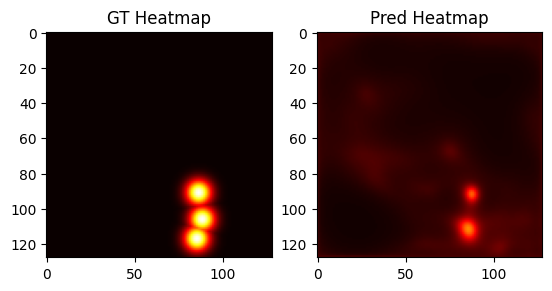


Epoch 27 completed in 224.31 seconds.
Train loss : 0.3994
GT mask loss : 0.2700
GT regr loss : 0.1294

Validation loss      : 0.9352
Validation mask loss : 0.8573
Validation regr loss : 0.0780
Precision:        0.4059
Instance Recall:  0.4573
F1 Score:         0.4301
Normal Region FP: 0.0608187134502924
FROC Score:       0.4606
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 6 epoch(s)

Epoch 28/100

Epoch 28 completed in 224.26 seconds.
Train loss : 0.3849
GT mask loss : 0.2539
GT regr loss : 0.1310

Validation loss      : 0.7665
Validation mask loss : 0.6886
Validation regr loss : 0.0779
Precision:        0.4249
Instance Recall:  0.4478
F1 Score:         0.4360
Normal Region FP: 0.0304093567251462
FROC Score:       0.4510
Current Learning Rate: 1.2500000000000002e-07
F1 Score improved from 0.4326 to 0.4360

Epoch 29/100


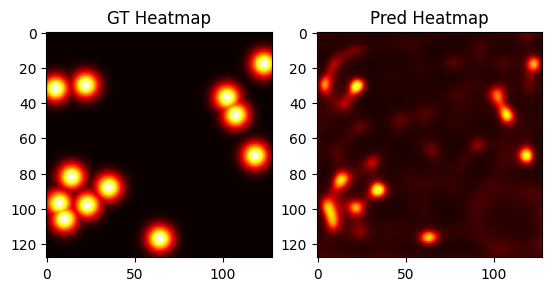


Epoch 29 completed in 228.22 seconds.
Train loss : 0.3879
GT mask loss : 0.2578
GT regr loss : 0.1301

Validation loss      : 0.7158
Validation mask loss : 0.6364
Validation regr loss : 0.0794
Precision:        0.4232
Instance Recall:  0.4162
F1 Score:         0.4197
Normal Region FP: 0.025730994152046785
FROC Score:       0.4191
Current Learning Rate: 1.2500000000000002e-07
No improvement in F1 Score for 1 epoch(s)

Epoch 30/100

Epoch 30 completed in 224.47 seconds.
Train loss : 0.3924
GT mask loss : 0.2636
GT regr loss : 0.1288

Validation loss      : 0.7585
Validation mask loss : 0.6805
Validation regr loss : 0.0780
Precision:        0.4335
Instance Recall:  0.4512
F1 Score:         0.4422
Normal Region FP: 0.026900584795321637
FROC Score:       0.4560
Current Learning Rate: 1.2500000000000002e-07
F1 Score improved from 0.4360 to 0.4422

Epoch 31/100


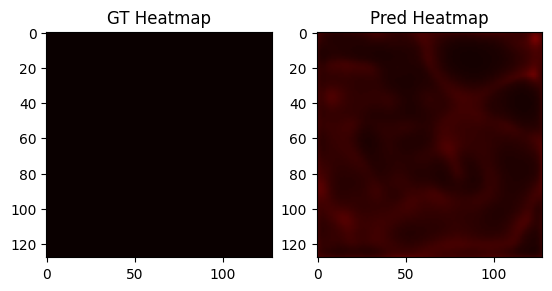


Epoch 31 completed in 228.39 seconds.
Train loss : 0.3860
GT mask loss : 0.2583
GT regr loss : 0.1277


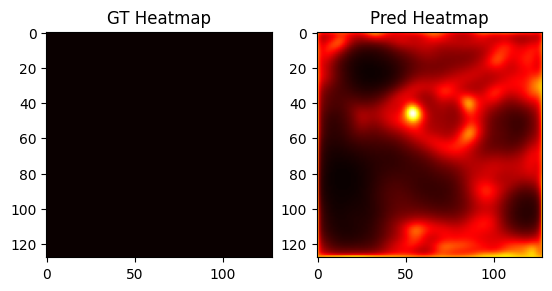


Validation loss      : 0.7924
Validation mask loss : 0.7150
Validation regr loss : 0.0774
Precision:        0.4289
Instance Recall:  0.4688
F1 Score:         0.4479
Normal Region FP: 0.03625730994152047
FROC Score:       0.4732
Current Learning Rate: 1e-07
F1 Score improved from 0.4422 to 0.4479

Epoch 32/100

Epoch 32 completed in 227.13 seconds.
Train loss : 0.3892
GT mask loss : 0.2587
GT regr loss : 0.1305

Validation loss      : 0.7512
Validation mask loss : 0.6724
Validation regr loss : 0.0788
Precision:        0.4219
Instance Recall:  0.4360
F1 Score:         0.4288
Normal Region FP: 0.0304093567251462
FROC Score:       0.4397
Current Learning Rate: 1e-07
No improvement in F1 Score for 1 epoch(s)

Epoch 33/100


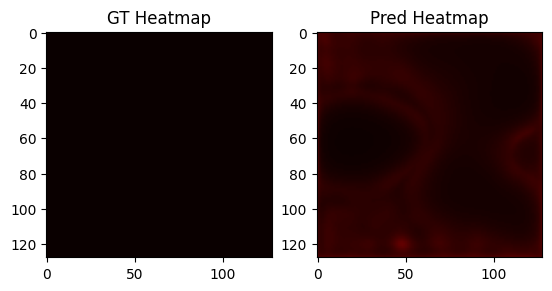


Epoch 33 completed in 223.61 seconds.
Train loss : 0.3878
GT mask loss : 0.2586
GT regr loss : 0.1293

Validation loss      : 0.7357
Validation mask loss : 0.6558
Validation regr loss : 0.0799
Precision:        0.4183
Instance Recall:  0.4101
F1 Score:         0.4142
Normal Region FP: 0.02456140350877193
FROC Score:       0.4126
Current Learning Rate: 1e-07
No improvement in F1 Score for 2 epoch(s)

Epoch 34/100

Epoch 34 completed in 223.94 seconds.
Train loss : 0.4031
GT mask loss : 0.2749
GT regr loss : 0.1283

Validation loss      : 0.9438
Validation mask loss : 0.8661
Validation regr loss : 0.0777
Precision:        0.4150
Instance Recall:  0.4738
F1 Score:         0.4424
Normal Region FP: 0.05964912280701754
FROC Score:       0.4768
Current Learning Rate: 1e-07
No improvement in F1 Score for 3 epoch(s)

Epoch 35/100


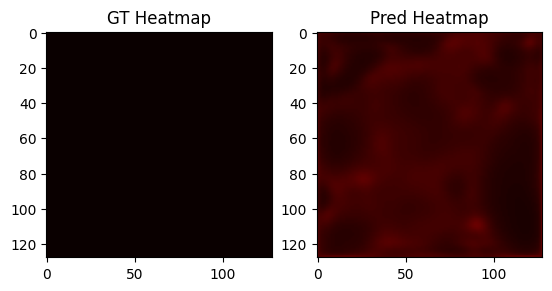


Epoch 35 completed in 223.99 seconds.
Train loss : 0.3702
GT mask loss : 0.2430
GT regr loss : 0.1272

Validation loss      : 0.7549
Validation mask loss : 0.6759
Validation regr loss : 0.0790
Precision:        0.4244
Instance Recall:  0.4334
F1 Score:         0.4288
Normal Region FP: 0.031578947368421054
FROC Score:       0.4357
Current Learning Rate: 1e-07
No improvement in F1 Score for 4 epoch(s)

Epoch 36/100

Epoch 36 completed in 223.11 seconds.
Train loss : 0.3710
GT mask loss : 0.2433
GT regr loss : 0.1278


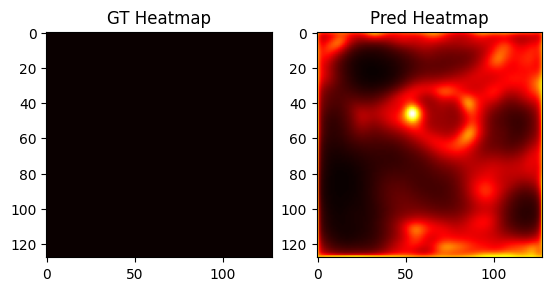


Validation loss      : 0.9276
Validation mask loss : 0.8497
Validation regr loss : 0.0779
Precision:        0.4259
Instance Recall:  0.4625
F1 Score:         0.4434
Normal Region FP: 0.05730994152046784
FROC Score:       0.4663
Current Learning Rate: 1e-07
No improvement in F1 Score for 5 epoch(s)

Epoch 37/100


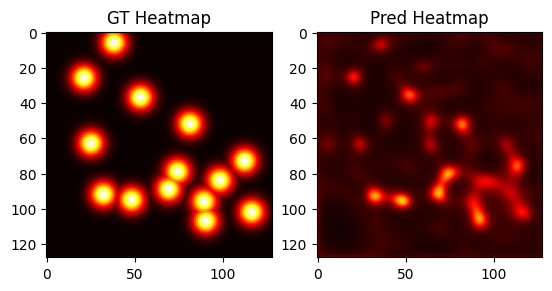


Epoch 37 completed in 223.71 seconds.
Train loss : 0.4032
GT mask loss : 0.2735
GT regr loss : 0.1297

Validation loss      : 0.8134
Validation mask loss : 0.7352
Validation regr loss : 0.0782
Precision:        0.4223
Instance Recall:  0.4540
F1 Score:         0.4376
Normal Region FP: 0.03976608187134503
FROC Score:       0.4577
Current Learning Rate: 1e-07
No improvement in F1 Score for 6 epoch(s)

Epoch 38/100

Epoch 38 completed in 223.58 seconds.
Train loss : 0.3957
GT mask loss : 0.2680
GT regr loss : 0.1277

Validation loss      : 0.8450
Validation mask loss : 0.7663
Validation regr loss : 0.0786
Precision:        0.4147
Instance Recall:  0.4407
F1 Score:         0.4273
Normal Region FP: 0.042105263157894736
FROC Score:       0.4440
Current Learning Rate: 1e-07
No improvement in F1 Score for 7 epoch(s)

Epoch 39/100


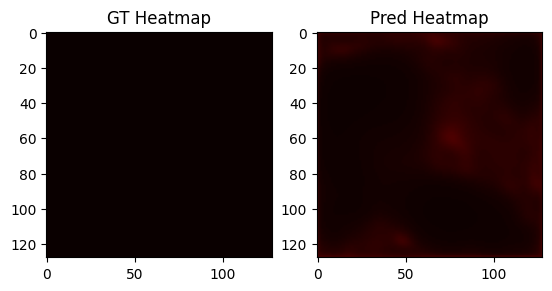


Epoch 39 completed in 224.34 seconds.
Train loss : 0.3827
GT mask loss : 0.2535
GT regr loss : 0.1292

Validation loss      : 0.7939
Validation mask loss : 0.7150
Validation regr loss : 0.0789
Precision:        0.4199
Instance Recall:  0.4355
F1 Score:         0.4275
Normal Region FP: 0.031578947368421054
FROC Score:       0.4379
Current Learning Rate: 1e-07
No improvement in F1 Score for 8 epoch(s)

Epoch 40/100

Epoch 40 completed in 223.10 seconds.
Train loss : 0.3853
GT mask loss : 0.2547
GT regr loss : 0.1306

Validation loss      : 0.8216
Validation mask loss : 0.7437
Validation regr loss : 0.0780
Precision:        0.4375
Instance Recall:  0.4636
F1 Score:         0.4501
Normal Region FP: 0.03859649122807018
FROC Score:       0.4680
Current Learning Rate: 1e-07
F1 Score improved from 0.4479 to 0.4501

Epoch 41/100


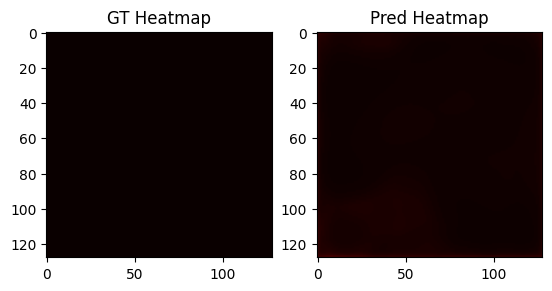


Epoch 41 completed in 228.83 seconds.
Train loss : 0.3796
GT mask loss : 0.2514
GT regr loss : 0.1282


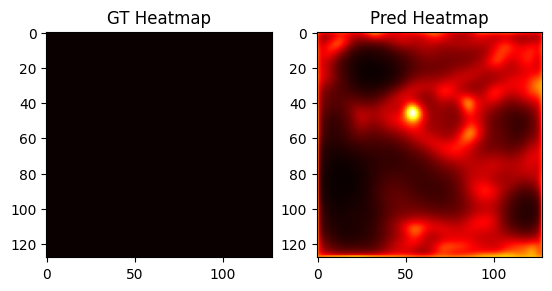


Validation loss      : 0.8168
Validation mask loss : 0.7390
Validation regr loss : 0.0778
Precision:        0.4257
Instance Recall:  0.4603
F1 Score:         0.4423
Normal Region FP: 0.03976608187134503
FROC Score:       0.4649
Current Learning Rate: 1e-07
No improvement in F1 Score for 1 epoch(s)

Epoch 42/100

Epoch 42 completed in 224.22 seconds.
Train loss : 0.3841
GT mask loss : 0.2563
GT regr loss : 0.1278

Validation loss      : 0.8360
Validation mask loss : 0.7571
Validation regr loss : 0.0789
Precision:        0.4361
Instance Recall:  0.4467
F1 Score:         0.4414
Normal Region FP: 0.03859649122807018
FROC Score:       0.4500
Current Learning Rate: 1e-07
No improvement in F1 Score for 2 epoch(s)

Epoch 43/100


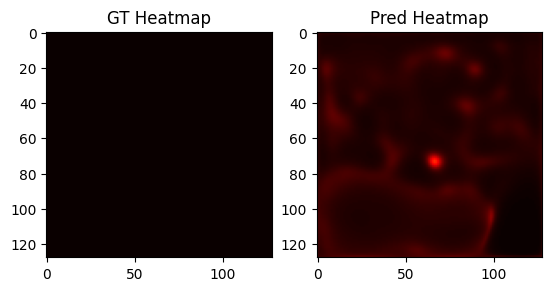


Epoch 43 completed in 223.60 seconds.
Train loss : 0.3826
GT mask loss : 0.2533
GT regr loss : 0.1293

Validation loss      : 0.8323
Validation mask loss : 0.7545
Validation regr loss : 0.0778
Precision:        0.4294
Instance Recall:  0.4618
F1 Score:         0.4450
Normal Region FP: 0.04327485380116959
FROC Score:       0.4665
Current Learning Rate: 1e-07
No improvement in F1 Score for 3 epoch(s)

Epoch 44/100

Epoch 44 completed in 223.67 seconds.
Train loss : 0.3932
GT mask loss : 0.2630
GT regr loss : 0.1302

Validation loss      : 0.8119
Validation mask loss : 0.7344
Validation regr loss : 0.0775
Precision:        0.4348
Instance Recall:  0.4617
F1 Score:         0.4478
Normal Region FP: 0.03508771929824561
FROC Score:       0.4657
Current Learning Rate: 1e-07
No improvement in F1 Score for 4 epoch(s)

Epoch 45/100


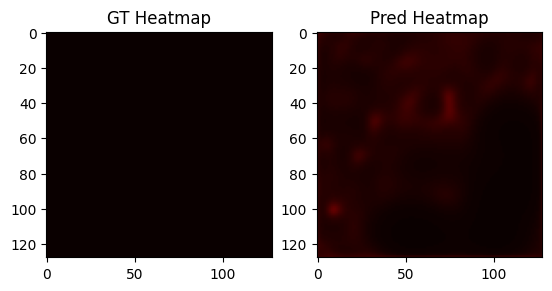


Epoch 45 completed in 223.51 seconds.
Train loss : 0.3914
GT mask loss : 0.2647
GT regr loss : 0.1268

Validation loss      : 0.8069
Validation mask loss : 0.7288
Validation regr loss : 0.0780
Precision:        0.4233
Instance Recall:  0.4533
F1 Score:         0.4378
Normal Region FP: 0.03274853801169591
FROC Score:       0.4573
Current Learning Rate: 1e-07
No improvement in F1 Score for 5 epoch(s)

Epoch 46/100

Epoch 46 completed in 224.08 seconds.
Train loss : 0.3954
GT mask loss : 0.2657
GT regr loss : 0.1297


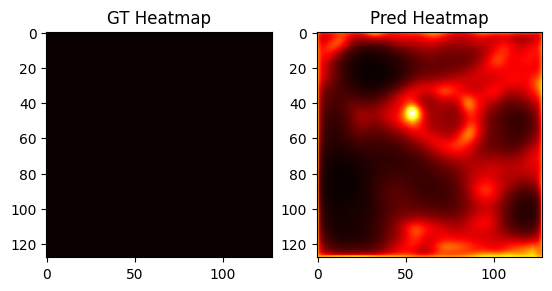


Validation loss      : 0.8295
Validation mask loss : 0.7506
Validation regr loss : 0.0789
Precision:        0.4258
Instance Recall:  0.4459
F1 Score:         0.4356
Normal Region FP: 0.04093567251461988
FROC Score:       0.4499
Current Learning Rate: 1e-07
No improvement in F1 Score for 6 epoch(s)

Epoch 47/100


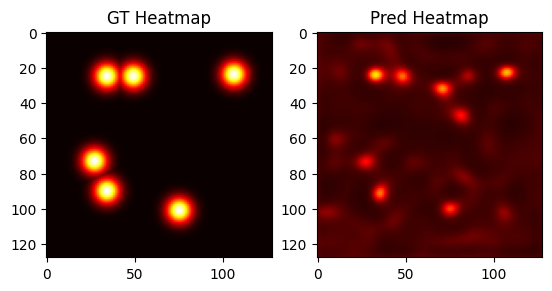


Epoch 47 completed in 224.04 seconds.
Train loss : 0.3884
GT mask loss : 0.2588
GT regr loss : 0.1296

Validation loss      : 0.7998
Validation mask loss : 0.7212
Validation regr loss : 0.0786
Precision:        0.4137
Instance Recall:  0.4407
F1 Score:         0.4268
Normal Region FP: 0.03742690058479532
FROC Score:       0.4441
Current Learning Rate: 1e-07
No improvement in F1 Score for 7 epoch(s)

Epoch 48/100

Epoch 48 completed in 224.10 seconds.
Train loss : 0.3843
GT mask loss : 0.2542
GT regr loss : 0.1300

Validation loss      : 0.8615
Validation mask loss : 0.7833
Validation regr loss : 0.0781
Precision:        0.4134
Instance Recall:  0.4632
F1 Score:         0.4369
Normal Region FP: 0.03625730994152047
FROC Score:       0.4670
Current Learning Rate: 1e-07
No improvement in F1 Score for 8 epoch(s)

Epoch 49/100


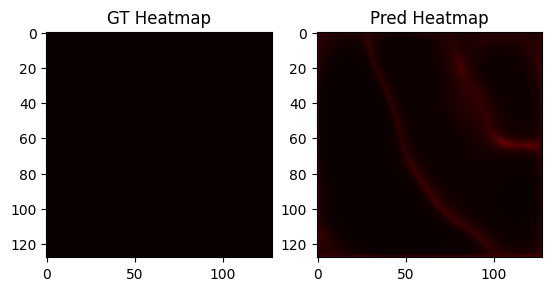


Epoch 49 completed in 224.61 seconds.
Train loss : 0.3819
GT mask loss : 0.2552
GT regr loss : 0.1267

Validation loss      : 0.8573
Validation mask loss : 0.7789
Validation regr loss : 0.0784
Precision:        0.4178
Instance Recall:  0.4464
F1 Score:         0.4316
Normal Region FP: 0.04678362573099415
FROC Score:       0.4499
Current Learning Rate: 1e-07
No improvement in F1 Score for 9 epoch(s)

Epoch 50/100

Epoch 50 completed in 223.86 seconds.
Train loss : 0.3897
GT mask loss : 0.2612
GT regr loss : 0.1285

Validation loss      : 0.8575
Validation mask loss : 0.7800
Validation regr loss : 0.0775
Precision:        0.4240
Instance Recall:  0.4696
F1 Score:         0.4456
Normal Region FP: 0.04912280701754386
FROC Score:       0.4739
Current Learning Rate: 1e-07
No improvement in F1 Score for 10 epoch(s)
Early stopping triggered after 10 epochs without improvement.
Early stopping at epoch 50


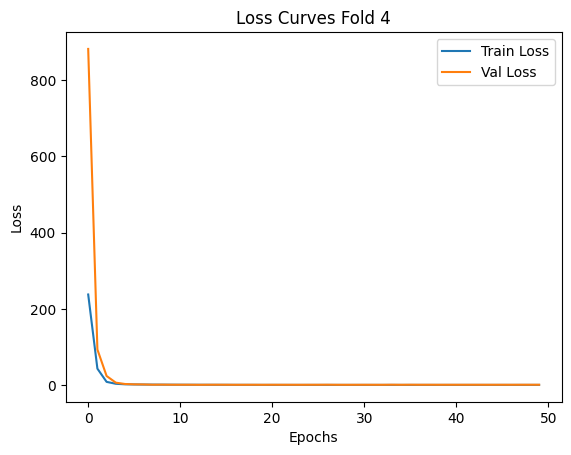


 Test Result
Precision: 0.3995
Instance Recall: 0.4044
F1 Score:  0.4019
FPs:       99.9539
FROC Score: 0.4089
Saved results to: /content/drive/MyDrive/Dissertation_Chatwipa/model_checkpoint/student_pseudolabel/adamw18_checkpoints_20250722_105039/fold4/test_results.csv

=== Cross-validation results ===
Mean Best F1 Score: 0.4478 ± 0.0293


In [ ]:
# Get current timestamp (format: YYYYMMDD_HHMMSS)
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

# Create save directory with timestamp
main_dir = f'/content/drive/MyDrive/Dissertation_Chatwipa/model_checkpoint/student_pseudolabel/adamw18_checkpoints_{timestamp}'
os.makedirs(main_dir, exist_ok=True)

epochs = 100
early_stop_patience = 10
batch_size = 16
folds = ['fold1', 'fold2', 'fold3', 'fold4']
all_fold_metrics = []

for test_fold_idx, test_fold_name in enumerate(folds):
    val_fold_idx = (test_fold_idx + 1) % 4
    train_fold_idxs = [i for i in range(4) if i != test_fold_idx and i != val_fold_idx]

    print(f"==== Test Fold: {folds[test_fold_idx]}, Val Fold: {folds[val_fold_idx]}, Train Folds: {[folds[i] for i in train_fold_idxs]} ====")

    train_loader, val_loader, test_loader = get_dataloaders(
        fold_root_dir = "/content/drive/MyDrive/Dissertation_Chatwipa/dataset",
        train_fold = [folds[i] for i in train_fold_idxs],
        val_fold = folds[val_fold_idx],
        test_fold = folds[test_fold_idx],
        transform_train = train_transform,
        transform_val_test = val_test_transform,
        batch_size = batch_size
    )

    # Initialize/reset model, optimizer, scheduler
    student_model = centernet(model_name='resnet18')
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    student_model.to(device)
    teacher_proj = nn.Conv2d(512, 256, kernel_size=1).to(device)

    # Optimizer
    optimizer = torch.optim.Adam(student_model.parameters(), lr=5e-5, weight_decay=1e-5)

    # Learning rate scheduler
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.05, patience=5, min_lr=1e-7)

    best_f1 = float('-inf')
    epochs_no_improve = 0
    early_stop_flag = False

    # Create save directory per fold
    fold_save_dir = os.path.join(main_dir, f'{folds[test_fold_idx]}')
    os.makedirs(fold_save_dir, exist_ok=True)

    train_loss_all = []
    val_loss_all = []
    metrics_log = []

    for epoch in range(epochs):
        early_stop_flag, best_f1, epochs_no_improve, train_loss, val_loss, val_metrics = train_student(
            epoch, teacher_model, student_model, fold_save_dir, best_f1,
            epochs_no_improve, early_stop_patience,
            train_loader, val_loader, optimizer, teacher_proj)

        train_loss_all.append(train_loss)
        val_loss_all.append(val_loss)

        metrics_log.append({
            'epoch': epoch+1,
            'train_loss': train_loss,
            'val_loss': val_loss,
            **val_metrics
        })

        if early_stop_flag:
            print(f"Early stopping at epoch {epoch+1}")
            break

    # Save fold metrics to CSV
    metrics_df = pd.DataFrame(metrics_log)
    metrics_df.to_csv(os.path.join(fold_save_dir, 'training_metrics.csv'), index=False)

    # Plot loss curve
    plt.figure()
    plt.plot(train_loss_all, label='Train Loss')
    plt.plot(val_loss_all, label='Val Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title(f"Loss Curves Fold {test_fold_idx+1}")
    plt.show()

    # Save best f1 score
    all_fold_metrics.append({
        'fold': test_fold_idx + 1,
        'best_f1_score': best_f1
    })

    # ----- Test ------ #
    model_path = os.path.join(fold_save_dir, 'best_model.pth')
    # checkpoint = torch.load(model_path, map_location=torch.device('cpu'))
    checkpoint = torch.load(model_path)
    student_model.load_state_dict(checkpoint['model_state_dict'])
    print("\n Test Result")
    metrics, froc, recall_list, csv_path = test(student_model, test_loader, device, fold_save_dir, plot = False)
    print(f"Saved results to: {csv_path}")

best_f1_scores = [fm['best_f1_score'] for fm in all_fold_metrics]

print("\n=== Cross-validation results ===")
print(f"Mean Best F1 Score: {np.mean(best_f1_scores):.4f} ± {np.std(best_f1_scores):.4f}")

## 4. Visualization

In [16]:
class double_conv(nn.Module):
    '''(conv => BN => ReLU) * 2'''
    def __init__(self, in_ch, out_ch):
        super(double_conv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ELU(inplace=True), # Change from ReLU to ELU
            nn.Dropout2d(p=0.3),

            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ELU(inplace=True), # Change from ReLU to ELU
            nn.Dropout2d(p=0.3),
        )

    def forward(self, x):
        x = self.conv(x)
        return x

class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=True):
        super(up, self).__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch//2, in_ch//2, 2, stride=2)
        self.conv = double_conv(in_ch, out_ch)

    def forward(self, x1, x2=None):
        x1 = self.up(x1)
        if x2 is not None:
            x = torch.cat([x2, x1], dim=1)
            # input is CHW
            diffY = x2.size()[2] - x1.size()[2]
            diffX = x2.size()[3] - x1.size()[3]

            x1 = F.pad(x1, (diffX // 2, diffX - diffX//2,
                            diffY // 2, diffY - diffY//2))
        else:
            x = x1
        x = self.conv(x)
        return x

class centernet(nn.Module):
    def __init__(self, n_classes=1, model_name="resnet34"):
        super(centernet, self).__init__()

        # Create model backbone
        if model_name == "resnet34":
            basemodel = torchvision.models.resnet34(weights=ResNet34_Weights.DEFAULT)
            self.num_ch = 512
        elif model_name == "resnet18":
            basemodel = torchvision.models.resnet18(weights=ResNet18_Weights.DEFAULT)
            self.num_ch = 512

        # Remove the last two layers (average pooling and linear layer)
        self.base_model = nn.Sequential(*list(basemodel.children())[:-2])

        # Freeze earlier layers except layer3 and layer4
        for name, param in basemodel.named_parameters():
            if "layer3" in name or "layer4" in name:
                param.requires_grad = True
            else:
                param.requires_grad = False

        self.up1 = up(self.num_ch, 512)
        self.up2 = up(512, 256)
        self.up3 = up(256, 256)

        # Output classification
        self.outc = nn.Conv2d(256, n_classes, 1)

        # Output residue
        self.outr = nn.Conv2d(256, 2, 1)

    def forward(self, x):
        x = self.base_model(x)
        x = self.up1(x)
        feat = self.up2(x)
        x = self.up3(feat)
        outc = self.outc(x)
        outr = self.outr(x)
        return feat, outc, outr

In [17]:
model = centernet(model_name='resnet18')
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

model_path = "/content/drive/MyDrive/Dissertation_Chatwipa/model_checkpoint/student_pseudolabel/adamw18_checkpoints_20250722_105039/fold3/best_model.pth"
checkpoint = torch.load(model_path)
model.load_state_dict(checkpoint['model_state_dict'])

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 230MB/s]


<All keys matched successfully>

In [18]:
save_dir = "/content/"
metrics, froc, recall_list, csv_path = test(model, test_loader, device, save_dir, plot = False)
print(f"Saved results to: {csv_path}")

Precision: 0.4501
Instance Recall: 0.5205
F1 Score:  0.4827
FPs:       99.9196
FROC Score: 0.5353
Saved results to: /content/test_results.csv
